In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.patches import Patch
plt.rcParams['figure.figsize'] = [16, 8]
cmap = plt.cm.get_cmap('brg', 3)


import numpy as np
import scipy.stats
import scipy.optimize
import sklearn.decomposition
import sklearn.cluster
import time
import wfdb
from scipy.special import softmax

from collections import Counter
from functools import reduce

In [2]:
# https://matplotlib.org/devdocs/gallery/statistics/confidence_ellipse.html
from matplotlib.patches import Ellipse
import matplotlib.transforms
def confidence_ellipse(mu, cov, dims, ax, n_std=3.0, facecolor='none', **kwargs):
    dim0, dim1 = dims

    pearson = cov[dim0, dim1]/np.sqrt(cov[dim0, dim0] * cov[dim1, dim1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[dim0, dim0]) * n_std
    mean_x = mu[dim0]

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[dim1, dim1]) * n_std
    mean_y = mu[dim1]

    transf = matplotlib.transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

In [3]:
def logsum(a):
    # computes np.log(np.exp(a).sum()) in a numerically stable way
    return np.log(np.exp(a - a.max()).sum()) + a.max()

In [4]:
def logdot(a, b):
    # computes np.log(np.dot(np.exp(a), np.exp(b))) in a numerically stable way
    # from https://stackoverflow.com/questions/23630277/
    #  numerically-stable-way-to-multiply-log-probability-matrices-in-numpy
    max_a, max_b = np.max(a), np.max(b)
    exp_a, exp_b = a - max_a, b - max_b
    np.exp(exp_a, out=exp_a)
    np.exp(exp_b, out=exp_b)
    c = np.dot(exp_a, exp_b)
    np.log(c, out=c)
    c += max_a + max_b
    return c

# Models

In [5]:
class Model:
    def __init__(self, nr_states, emission_dim):
        self.nr_states = nr_states
        self.emission_dim = emission_dim
    
    def fit(self, data):
        raise NotImplementedError
        
    def predict(self, data):
        raise NotImplementedError
    
    def nll(self, data):
        raise NotImplementedError

## k-means

In [6]:
class KMeans(Model):
    def __init__(self, nr_states, emission_dim):
        super().__init__(nr_states, emission_dim)
        self._kmeans = sklearn.cluster.KMeans(nr_states)
    
    def fit(self, data):
        self._kmeans.fit(data)
        self.mu = kmeans._kmeans.cluster_centers_   
        
    def predict(self, data):
        return self._kmeans.predict(data)

## Gaussian mixture

In [7]:
class GaussianMixture(Model):
    def __init__(self, nr_states, emission_dim):
        super().__init__(nr_states, emission_dim)
        self.delta = None
        self.mu = None
        self.cov = None
        
    def get_initial_params(self, data):        
        kmeans = sklearn.cluster.KMeans(self.nr_states).fit(data)
        
        delta = np.array([sum(kmeans.labels_ == s) for s in range(self.nr_states)])
        delta = delta / delta.sum()
        
        mu = [
            data[kmeans.labels_ == s].mean(axis=0) for s in range(self.nr_states)
        ]
        
        cov = [
            np.cov(data[kmeans.labels_ == s].transpose()) for s in range(self.nr_states)
        ]
        
        return delta, mu, cov
    
    def emission_logpdf(self, data):    
        # Returns p with p[i,s] is the log propability density of the ith emission given the system is in state s
        return np.stack([
            scipy.stats.multivariate_normal(self.mu[s], self.cov[s], allow_singular=True).logpdf(data)
            for s in range(self.nr_states)
        ], axis=1)
    
    def states_cond_prob(self, data):
        u = self.emission_logpdf(data) + np.log(self.delta)[np.newaxis, :]
        u = u - u.max(axis=1)[:, np.newaxis]  # scale to avoid overflow in exp
        u = np.exp(u)
        u = u / u.sum(axis=1)[:, np.newaxis]  # normalize
        return u
    
    def nll(self, data):
        return -sum(logdot(self.emission_logpdf(data), np.log(self.delta)))
    
    def fit(self, data, maxiter=200):
        self.delta, self.mu, self.cov = self.get_initial_params(data)
        
        nlls = []
        for i in range(maxiter):
            nlls.append(self.nll(data))
            
            # E-Step
            u = self.states_cond_prob(data)
            
            # M-Step
            self.delta = u.sum(axis=0) / data.shape[0]
            self.mu = (u[:, :, np.newaxis] * data[:, np.newaxis, :]).sum(axis=0) / u.sum(axis=0)[:, np.newaxis]
            self.cov = [
                np.cov(data.transpose(), aweights=u[:,s]) if u[:,s].any() else self.cov[s]
                for s in range(self.nr_states)
            ]
        
        nlls.append(self.nll(data))
        return nlls
    
    def predict(self, data):
        return self.states_cond_prob(data).argmax(axis=1)

## HMM with covariance set to 1

In [8]:
class HMMCov1(Model):
    def __init__(self, nr_states, emission_dim):
        self.nr_states = nr_states
        self.emission_dim = emission_dim
        self.gamma = None
        self.delta = None
        self.mu = None
    
    def get_initial_params(self, data):        
        kmeans = sklearn.cluster.KMeans(self.nr_states).fit(data)
        
        transition_count = Counter(zip(kmeans.labels_[:-1], kmeans.labels_[1:]))
        gamma = np.array([
            [transition_count[(i,j)] for j in range(kmeans.n_clusters)] for i in range(kmeans.n_clusters)
        ])
        gamma = gamma + 1  # additive smoothing
        gamma = gamma / gamma.sum(axis=1)[:, np.newaxis]
        
        delta = np.linalg.solve(
            (np.eye(self.nr_states) - gamma + np.ones((self.nr_states, self.nr_states))).transpose(),
            np.ones(self.nr_states)
        )
        
        mu = [
            data[kmeans.labels_ == s].mean(axis=0) for s in range(self.nr_states)
        ]
        
        return gamma, delta, mu
    
    def emission_logpdf(self, data):    
        # Returns p with p[i,s] is the log propability density of the ith emission given the system is in state s
        return np.stack([
            scipy.stats.multivariate_normal(self.mu[s]).logpdf(data)
            for s in range(self.nr_states)
        ], axis=1)
    
    def emission_pdf(self, data):    
        # Returns p with p[i,s] is the propability density of the ith emission given the chain is in state s  
        return np.exp(self.emission_logpdf(data))
    
    def log_forward_unsafe(self, data):
        p = self.emission_pdf(data)
        
        with np.errstate(divide='ignore'):
            # surpress log(0) warning because exp(log(0)) = 0 is a proper probability value
            lalpha = np.zeros((data.shape[0], self.nr_states))
            phi = self.delta * p[0]
            ll = np.log(phi.sum())
            phi = phi / phi.sum()  # scale to avoid underflow
            lalpha[0] = ll + np.log(phi)
            for t in range(1, data.shape[0]):
                phi = np.dot(phi, self.gamma) * p[t]
                ll = ll + np.log(phi.sum())
                phi = phi / phi.sum()
                lalpha[t] = np.log(phi) + ll
        
        return lalpha
    
    def log_forward(self, data):
        lp = self.emission_logpdf(data)
        with np.errstate(divide='ignore'):
            ld = np.log(self.delta)
            lg = np.log(self.gamma)
        
        with np.errstate(divide='ignore'):
            # surpress log(0) warning because exp(log(0)) = 0 is a proper probability value
            lalpha = np.zeros((data.shape[0], self.nr_states))
            lphi = ld + lp[0]
            ll = logsum(lphi)
            lphi = lphi - ll  # scale to avoid underflow
            lalpha[0] = ll + lphi
            for t in range(1, data.shape[0]):
                lphi = logdot(lphi, lg) + lp[t]
                ll = ll + logsum(lphi)
                lphi = lphi - logsum(lphi)
                lalpha[t] = lphi + ll
        
        return lalpha
                            
    def log_backward_unsafe(self, data):
        p = self.emission_pdf(data)
        
        with np.errstate(divide='ignore'):
            # surpress log(0) warning because exp(log(0)) = 0 is a proper probability value
            lbeta = np.zeros((data.shape[0], self.nr_states))
            phi = np.ones(self.nr_states) / self.nr_states
            scale = np.log(self.nr_states)
            for t in range(data.shape[0] - 2, -1, -1):
                phi = np.dot(self.gamma, phi * p[t + 1])
                lbeta[t] = np.log(phi) + scale
                scale = scale + np.log(phi.sum())
                phi = phi / phi.sum()    # scale to avoid underflow
        
        return lbeta
    
    def log_backward(self, data):
        lp = self.emission_logpdf(data)
        with np.errstate(divide='ignore'):
            lg = np.log(self.gamma)
        
        with np.errstate(divide='ignore'):
            # surpress log(0) warning because exp(log(0)) = 0 is a proper probability value
            lbeta = np.zeros((data.shape[0], self.nr_states))
            lphi = -np.log(self.nr_states) * np.ones(self.nr_states)
            scale = np.log(self.nr_states)
            for t in range(data.shape[0] - 2, -1, -1):
                lphi = logdot(lg, lphi + lp[t + 1])
                lbeta[t] = lphi + scale
                scale = scale + logsum(lphi)
                lphi = lphi - logsum(lphi)   # scale to avoid underflow
        
        return lbeta
    
    def nll_unsafe(self, data):
        # todo functools.reduce might be faster than the for loop
        # numpy.ufunc.reduce might be even faster
        
        p = self.emission_pdf(data)
        forward = self.delta * p[0]
        if forward.sum() == 0:
            return np.inf
        ll = np.log(forward.sum())
        phi = forward / forward.sum()
        for t in range(1, data.shape[0]):
            forward = np.dot(phi, self.gamma) * p[t]
            if forward.sum() == 0:
                return np.inf
            ll = ll + np.log(forward.sum())
            phi = forward / forward.sum()
        return -ll
    
    def nll(self, data):
        # todo functools.reduce might be faster than the for loop
        # numpy.ufunc.reduce might be even faster
        
        lp = self.emission_logpdf(data)
        with np.errstate(divide='ignore'):
            ld = np.log(self.delta)
            lg = np.log(self.gamma)
        
        lforward = ld + lp[0]
        ll = logsum(lforward)
        lphi = lforward - ll
        for t in range(1, data.shape[0]):
            lforward = logdot(lphi, lg) + lp[t]
            ll = ll + logsum(lforward)
            lphi = lforward - logsum(lforward)
        return -ll
    
    def fit(self, data, maxiter=200):
        # init parameters
        self.gamma, self.delta, self.mu = self.get_initial_params(data)
        
        nlls = []
        for i in range(maxiter):
            with np.errstate(divide='ignore'):
                lg = np.log(self.gamma)
            lp = self.emission_logpdf(data)
            
            # E-Step
            
            # get forward and backwards vars
            la = self.log_forward(data)
            lb = self.log_backward(data)
            
            nll = -logsum(la[-1])
            nlls.append(nll)
            
            u = np.exp(la + lb + nll)
            v = np.exp(
                la[:-1, :, np.newaxis] 
                + lg[np.newaxis, :, :] 
                + lp[1:, np.newaxis, :] 
                + lb[1:, np.newaxis, :] 
                + nll
            )
            
            # M-Step
            
            self.delta = u[0]
            self.gamma = v.sum(axis=0) / v.sum(axis=0).sum(axis=1)[:, np.newaxis]
            self.mu = (u[:, :, np.newaxis] * data[:, np.newaxis, :]).sum(axis=0) / u.sum(axis=0)[:, np.newaxis]
        
        nlls.append(self.nll(data))
        return nlls
           
    def predict_unsafe(self, data):
        # Viterbi algorithm
      
        p = self.emission_pdf(data)
        
        xi = np.zeros((data.shape[0], self.nr_states))
        xi[0] = self.delta * p[0] / np.dot(self.delta, p[0])
        for t in range(1, data.shape[0]):
            xi[t] = np.dot(xi[t - 1], self.gamma).max() * p[t,]
            xi[t] = xi[t] / xi[t].sum()
            
        iv = np.zeros(data.shape[0], dtype=np.uint8)
        iv[-1] = xi[-1].argmax()
        for t in range(data.shape[0] - 2, -1, -1):
            iv[t] = (self.gamma[:, iv[t + 1]] * xi[t]).argmax()
        
        return iv
    
    def predict(self, data):
        # Viterbi algorithm
      
        lp = self.emission_logpdf(data)
        with np.errstate(divide='ignore'):
            ld = np.log(self.delta)
            lg = np.log(self.gamma)
        
        lxi = np.zeros((data.shape[0], self.nr_states))
        lxi[0] = ld + lp[0]
        lxi[0] = lxi[0] - logsum(lxi[0] )
        for t in range(1, data.shape[0]):
            lxi[t] = logdot(lxi[t - 1], lg).max() + lp[t,]
            lxi[t] = lxi[t] - logsum(lxi[t])
            
        iv = np.zeros(data.shape[0], dtype=np.uint8)
        iv[-1] = lxi[-1].argmax()
        for t in range(data.shape[0] - 2, -1, -1):
            iv[t] = (lg[:, iv[t + 1]] + lxi[t]).argmax()
        
        return iv
    

## HMM with covariance

In [9]:
class HMM(Model):
    def __init__(self, nr_states, emission_dim):
        self.nr_states = nr_states
        self.emission_dim = emission_dim
        self.gamma = None
        self.delta = None
        self.mu = None
        self.cov = None
    
    def get_initial_params(self, data):        
        kmeans = sklearn.cluster.KMeans(self.nr_states).fit(data)
        
        transition_count = Counter(zip(kmeans.labels_[:-1], kmeans.labels_[1:]))
        gamma = np.array([
            [transition_count[(i,j)] for j in range(kmeans.n_clusters)] for i in range(kmeans.n_clusters)
        ])
        gamma = gamma + 1  # additive smoothing
        gamma = gamma / gamma.sum(axis=1)[:, np.newaxis]
        
        delta = np.linalg.solve(
            (np.eye(self.nr_states) - gamma + np.ones((self.nr_states, self.nr_states))).transpose(),
            np.ones(self.nr_states)
        )
        
        mu = [
            data[kmeans.labels_ == s].mean(axis=0) for s in range(self.nr_states)
        ]
        
        cov = [
            np.cov(data[kmeans.labels_ == s].transpose()) for s in range(self.nr_states)
        ]
        
        return gamma, delta, mu, cov
    
    def emission_logpdf(self, data):    
        # Returns p with p[i,s] is the log propability density of the ith emission given the system is in state s
        return np.stack([
            scipy.stats.multivariate_normal(self.mu[s], self.cov[s], allow_singular=True).logpdf(data)
            for s in range(self.nr_states)
        ], axis=1)
    
    def emission_pdf(self, data):    
        # Returns p with p[i,s] is the propability density of the ith emission given the chain is in state s  
        return np.exp(self.emission_logpdf(data))
    
    def log_forward_unsafe(self, data):
        p = self.emission_pdf(data)
        
        with np.errstate(divide='ignore'):
            # surpress log(0) warning because exp(log(0)) = 0 is a proper probability value
            lalpha = np.zeros((data.shape[0], self.nr_states))
            phi = self.delta * p[0]
            ll = np.log(phi.sum())
            phi = phi / phi.sum()  # scale to avoid underflow
            lalpha[0] = ll + np.log(phi)
            for t in range(1, data.shape[0]):
                phi = np.dot(phi, self.gamma) * p[t]
                ll = ll + np.log(phi.sum())
                phi = phi / phi.sum()
                lalpha[t] = np.log(phi) + ll
        
        return lalpha
    
    def log_forward(self, data):
        lp = self.emission_logpdf(data)
        with np.errstate(divide='ignore'):
            ld = np.log(self.delta)
            lg = np.log(self.gamma)
        
        with np.errstate(divide='ignore'):
            # surpress log(0) warning because exp(log(0)) = 0 is a proper probability value
            lalpha = np.zeros((data.shape[0], self.nr_states))
            lphi = ld + lp[0]
            ll = logsum(lphi)
            lphi = lphi - ll  # scale to avoid underflow
            lalpha[0] = ll + lphi
            for t in range(1, data.shape[0]):
                lphi = logdot(lphi, lg) + lp[t]
                ll = ll + logsum(lphi)
                lphi = lphi - logsum(lphi)
                lalpha[t] = lphi + ll
        
        return lalpha
                            
    def log_backward_unsafe(self, data):
        p = self.emission_pdf(data)
        
        with np.errstate(divide='ignore'):
            # surpress log(0) warning because exp(log(0)) = 0 is a proper probability value
            lbeta = np.zeros((data.shape[0], self.nr_states))
            phi = np.ones(self.nr_states) / self.nr_states
            scale = np.log(self.nr_states)
            for t in range(data.shape[0] - 2, -1, -1):
                phi = np.dot(self.gamma, phi * p[t + 1])
                lbeta[t] = np.log(phi) + scale
                scale = scale + np.log(phi.sum())
                phi = phi / phi.sum()    # scale to avoid underflow
        
        return lbeta
    
    def log_backward(self, data):
        lp = self.emission_logpdf(data)
        with np.errstate(divide='ignore'):
            lg = np.log(self.gamma)
        
        with np.errstate(divide='ignore'):
            # surpress log(0) warning because exp(log(0)) = 0 is a proper probability value
            lbeta = np.zeros((data.shape[0], self.nr_states))
            lphi = -np.log(self.nr_states) * np.ones(self.nr_states)
            scale = np.log(self.nr_states)
            for t in range(data.shape[0] - 2, -1, -1):
                lphi = logdot(lg, lphi + lp[t + 1])
                lbeta[t] = lphi + scale
                scale = scale + logsum(lphi)
                lphi = lphi - logsum(lphi)   # scale to avoid underflow
        
        return lbeta
    
    def nll_unsafe(self, data):
        # todo functools.reduce might be faster than the for loop
        # numpy.ufunc.reduce might be even faster
        
        p = self.emission_pdf(data)
        forward = self.delta * p[0]
        if forward.sum() == 0:
            return np.inf
        ll = np.log(forward.sum())
        phi = forward / forward.sum()
        for t in range(1, data.shape[0]):
            forward = np.dot(phi, self.gamma) * p[t]
            if forward.sum() == 0:
                return np.inf
            ll = ll + np.log(forward.sum())
            phi = forward / forward.sum()
        return -ll
    
    def nll(self, data):
        # todo functools.reduce might be faster than the for loop
        # numpy.ufunc.reduce might be even faster
        
        lp = self.emission_logpdf(data)
        with np.errstate(divide='ignore'):
            ld = np.log(self.delta)
            lg = np.log(self.gamma)
        
        lforward = ld + lp[0]
        ll = logsum(lforward)
        lphi = lforward - ll
        for t in range(1, data.shape[0]):
            lforward = logdot(lphi, lg) + lp[t]
            ll = ll + logsum(lforward)
            lphi = lforward - logsum(lforward)
        return -ll
    
    def fit(self, data, maxiter=200):
        # init parameters
        self.gamma, self.delta, self.mu, self.cov = self.get_initial_params(data)
        
        nlls = []
        for i in range(maxiter):
            with np.errstate(divide='ignore'):
                lg = np.log(self.gamma)
            lp = self.emission_logpdf(data)
            
            # E-Step
            
            # get forward and backwards vars
            la = self.log_forward(data)
            lb = self.log_backward(data)
            
            nll = -logsum(la[-1])
            nlls.append(nll)
            
            u = np.exp(la + lb + nll)
            v = np.exp(
                la[:-1, :, np.newaxis] 
                + lg[np.newaxis, :, :] 
                + lp[1:, np.newaxis, :] 
                + lb[1:, np.newaxis, :] 
                + nll
            )
            
            # M-Step
            
            self.delta = u[0]
            self.gamma = v.sum(axis=0) / v.sum(axis=0).sum(axis=1)[:, np.newaxis]
            self.mu = (u[:, :, np.newaxis] * data[:, np.newaxis, :]).sum(axis=0) / u.sum(axis=0)[:, np.newaxis]
            self.cov = [
                np.cov(data.transpose(), aweights=u[:,s]) if u[:,s].any() else self.cov[s]
                for s in range(self.nr_states)
            ]
        
        nlls.append(self.nll(data))
        return nlls
           
    def predict_unsafe(self, data):
        # Viterbi algorithm
      
        p = self.emission_pdf(data)
        
        xi = np.zeros((data.shape[0], self.nr_states))
        xi[0] = self.delta * p[0] / np.dot(self.delta, p[0])
        for t in range(1, data.shape[0]):
            xi[t] = np.dot(xi[t - 1], self.gamma).max() * p[t,]
            xi[t] = xi[t] / xi[t].sum()
            
        iv = np.zeros(data.shape[0], dtype=np.uint8)
        iv[-1] = xi[-1].argmax()
        for t in range(data.shape[0] - 2, -1, -1):
            iv[t] = (self.gamma[:, iv[t + 1]] * xi[t]).argmax()
        
        return iv
    
    def predict(self, data):
        # Viterbi algorithm
      
        lp = self.emission_logpdf(data)
        with np.errstate(divide='ignore'):
            ld = np.log(self.delta)
            lg = np.log(self.gamma)
        
        lxi = np.zeros((data.shape[0], self.nr_states))
        lxi[0] = ld + lp[0]
        lxi[0] = lxi[0] - logsum(lxi[0] )
        for t in range(1, data.shape[0]):
            lxi[t] = logdot(lxi[t - 1], lg).max() + lp[t,]
            lxi[t] = lxi[t] - logsum(lxi[t])
            
        iv = np.zeros(data.shape[0], dtype=np.uint8)
        iv[-1] = lxi[-1].argmax()
        for t in range(data.shape[0] - 2, -1, -1):
            iv[t] = (lg[:, iv[t + 1]] + lxi[t]).argmax()
        
        return iv
    

# Test

### Utility Functions

In [10]:
# utility functions

mappings = [
    (i, j, k) for i in range(3) for j in range(3) for k in range(3)
    if i != j and i != k and j != k
]

def map_states(states_, mapping_):
    return np.array(list(map(lambda s: mapping_[s], states_)))

def best_mapping(states_, true_states_):
    return max(mappings, key=lambda m: sum(map_states(states_, m) == true_states_))

def normalize_states(states_, true_states_):
    # select the mapping of states such that the accuracy is the highest
    # returns the mapping the mapped states and the accuracy
    m = best_mapping(states_, true_states_)
    s = map_states(states_, m)
    a = sum(s == true_states_) / len(states_)
    return m, s, a

## Simulation

### Data

In [11]:
initial = np.array([1.0, 0.0, 0.0])
transitions = np.array(
    [[0.6, 0.3, 0.1], 
     [0.1, 0.8, 0.1],
     [0.0, 1.0, 0.0]]
)
data_dim = 100
x = np.linspace(0, 1, data_dim)
mu_1 = [
    x * (1 - x),
    x**2 * (1 - x),
    x * (1 - x)**2
]
mu_2 = [
    2 * x,
    x**2,
    0.5 * x**3
]
cov = np.array([[0.1 * np.exp(-0.3 * abs(x[i] - x[j])) for j in range(data_dim)] for i in range(data_dim)])

t_max = 2000
true_states = [np.random.choice([0,1,2], p=initial)]
for t in range(1, t_max):
    true_states.append(np.random.choice([0,1,2], p=transitions[true_states[-1]]))
true_states = np.array(true_states)

data_1 = np.zeros((t_max, data_dim))
data_2 = np.zeros((t_max, data_dim))
for s in range(3):
    data_1[true_states == s] = scipy.stats.multivariate_normal(mu_1[s], cov).rvs(sum(true_states == s))
    data_2[true_states == s] = scipy.stats.multivariate_normal(mu_2[s], cov).rvs(sum(true_states == s))

data = np.concatenate([data_1, data_2], axis=1)

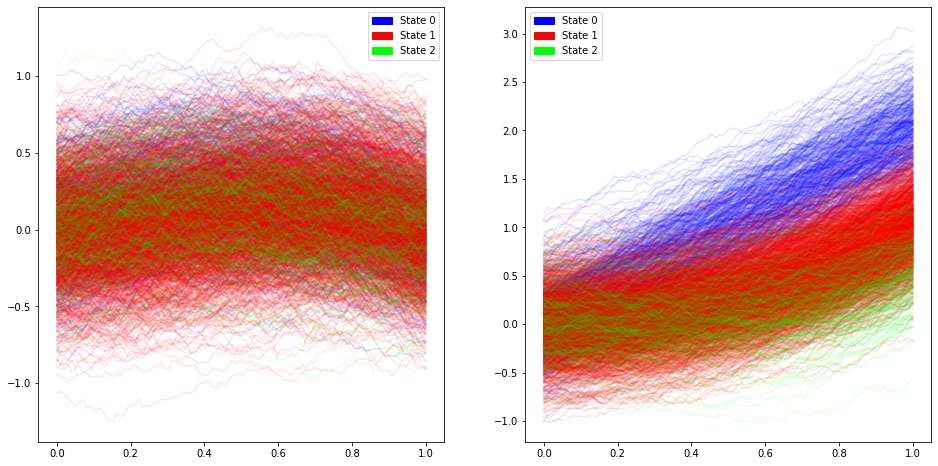

In [12]:
fig, axs = plt.subplots(1, 2)
for s in range(3):
    axs[0].plot(x, data_1[true_states == s].transpose(), color=cmap(s), alpha=0.1)
    axs[1].plot(x, data_2[true_states == s].transpose(), color=cmap(s), alpha=0.1)
axs[0].legend([Patch(color=cmap(c)) for c in (0, 1, 2)], ['State {}'.format(s) for s in range(3)])
axs[1].legend([Patch(color=cmap(c)) for c in (0, 1, 2)], ['State {}'.format(s) for s in range(3)])
pass

In [13]:
# Model parameters
nr_states, emission_dim, emission_dim_reduced = 3, data.shape[1], 10

In [14]:
# PCA
pca = sklearn.decomposition.PCA()
data_pca = pca.fit_transform(data)
data_pca_reduced = data_pca[:, :emission_dim_reduced]

def inverse_pca(curve):
    return pca.mean_ + np.dot(curve, pca.components_[:len(curve)])

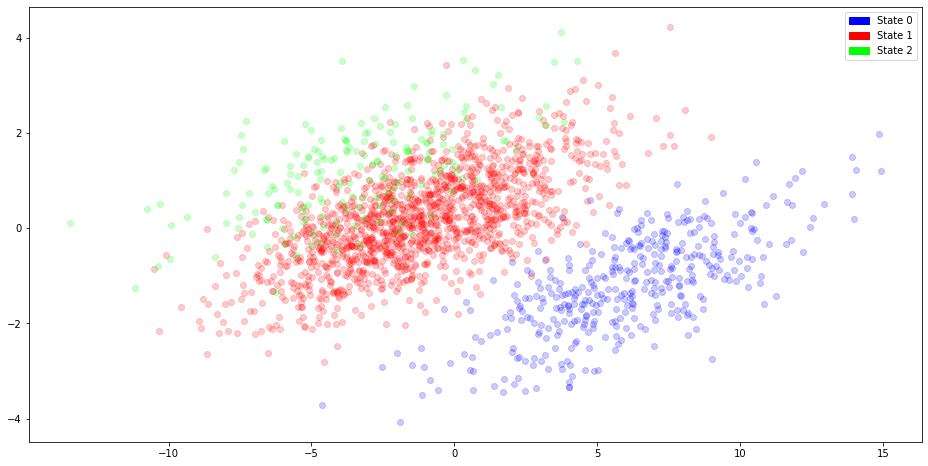

In [15]:
component1, component2 = 0, 2
for s in range(nr_states):
    plt.scatter(data_pca[true_states == s, component1], data_pca[true_states == s, component2], alpha=0.2,
                color=cmap(s))
plt.legend([Patch(color=cmap(c)) for c in (0, 1, 2)], ['State {}'.format(s) for s in range(3)])
pass

In [16]:
# whitening
data_white = (data_pca_reduced / np.sqrt(data_pca_reduced.var(axis=0)))

def inverse_white(curve):
    return inverse_pca(curve * np.sqrt(data_pca_reduced.var(axis=0)))

### k-means

In [17]:
# k-means, no PCA
kmeans = KMeans(nr_states, emission_dim)
kmeans.fit(data)
states = kmeans.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 0.5365


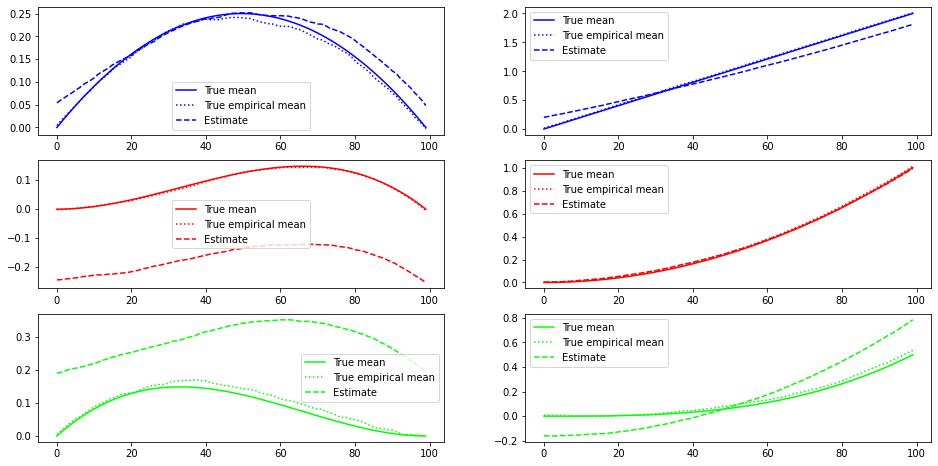

In [18]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(kmeans.mu[mapping.index(s), :data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(kmeans.mu[mapping.index(s), data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

In [19]:
# k-means, PCA
kmeans = KMeans(nr_states, emission_dim)
kmeans.fit(data_pca)
states = kmeans.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 0.534


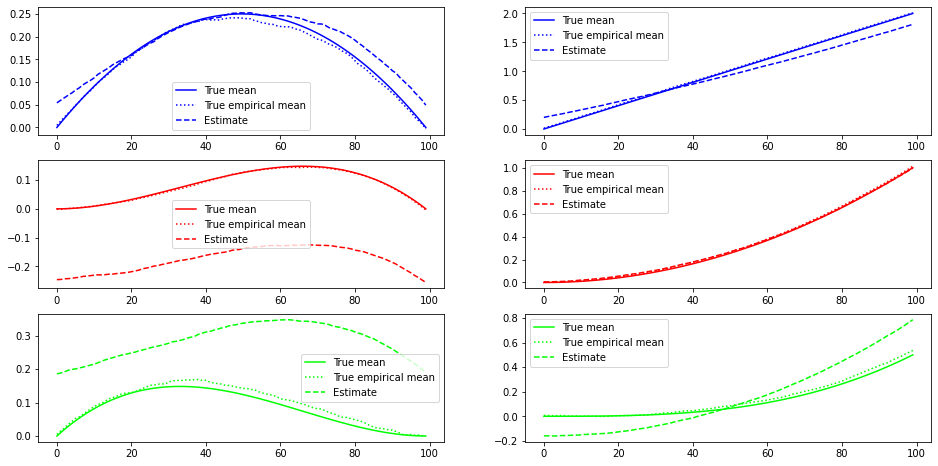

In [20]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_pca(kmeans.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_pca(kmeans.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

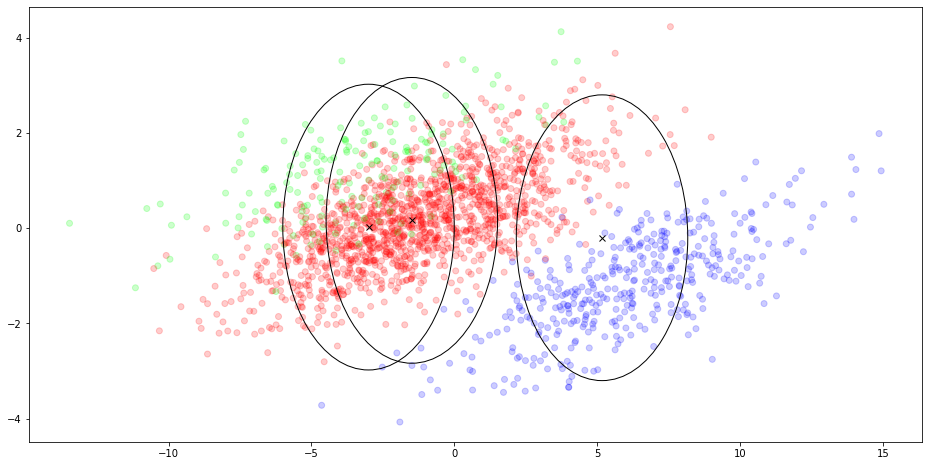

In [21]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(kmeans.mu[s], np.eye(emission_dim), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

In [22]:
# k-means, PCA, reduced
kmeans = KMeans(nr_states, emission_dim_reduced)
kmeans.fit(data_pca_reduced)
states = kmeans.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 0.533


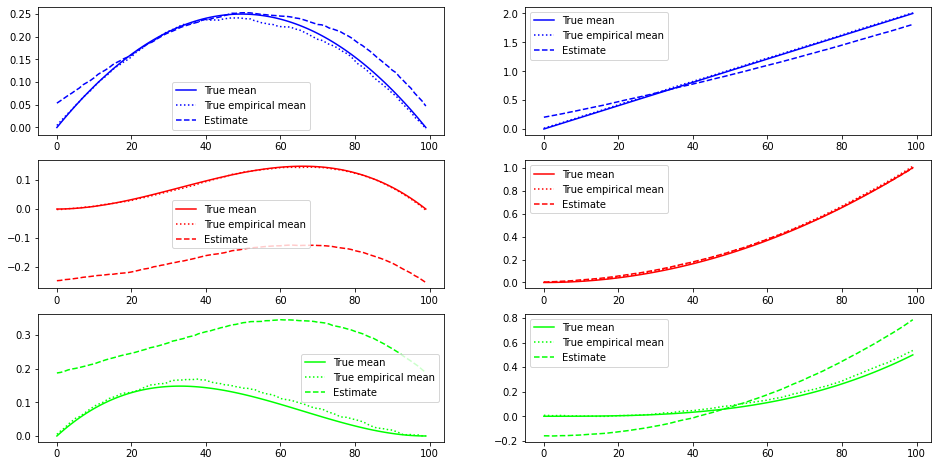

In [23]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_pca(kmeans.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_pca(kmeans.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

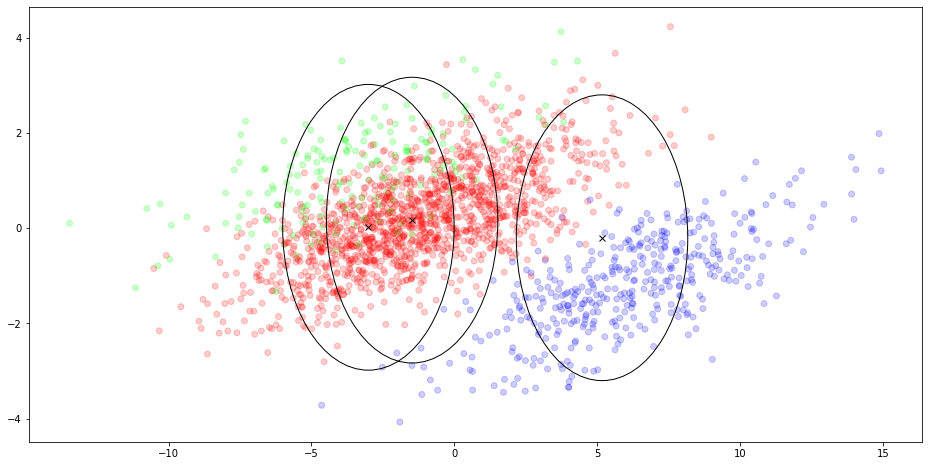

In [24]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(kmeans.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

In [25]:
# k-means, whitened data
kmeans = KMeans(nr_states, emission_dim_reduced)
kmeans.fit(data_white)
states = kmeans.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 0.696


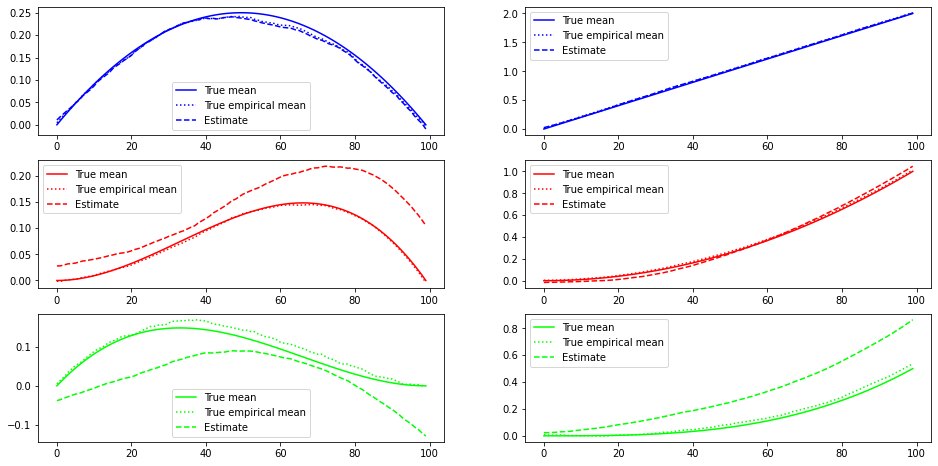

In [26]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_white(kmeans.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_white(kmeans.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

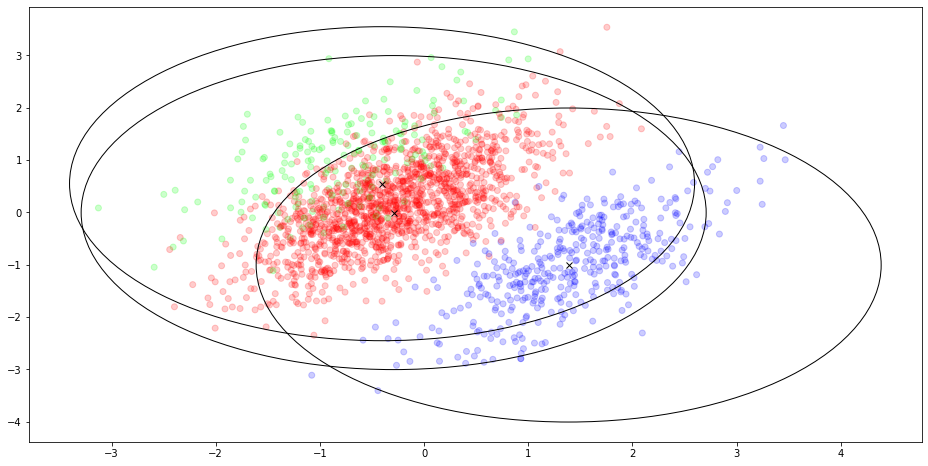

In [27]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(kmeans.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

### Gaussian mixture

Accuracy: 0.535
Negative log likelihood: -936361.1365914515


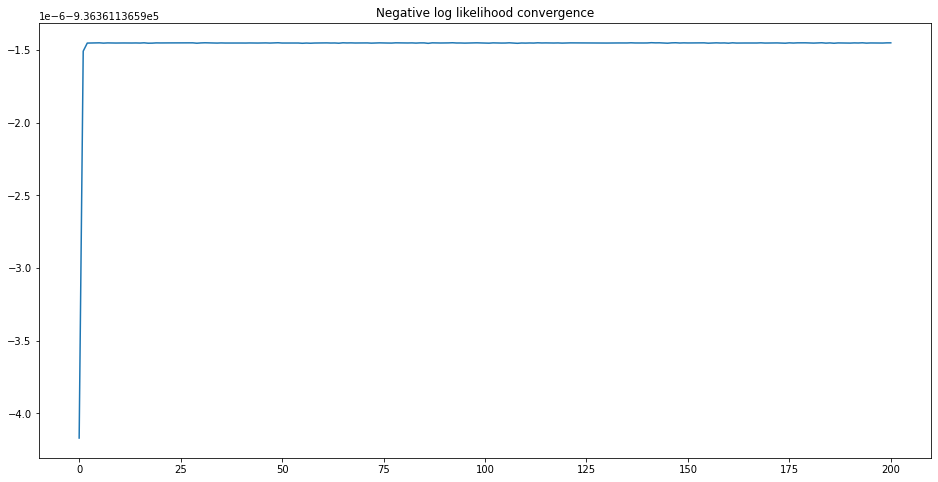

In [28]:
# Gaussian mixture, no PCA
gaussian_mixture = GaussianMixture(nr_states, emission_dim)
nlls = gaussian_mixture.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

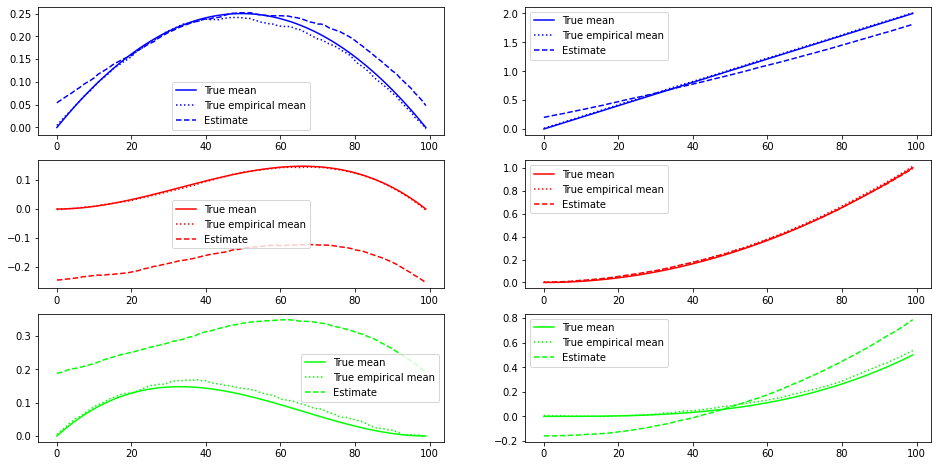

In [29]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(gaussian_mixture.mu[mapping.index(s), :data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(gaussian_mixture.mu[mapping.index(s), data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

Accuracy: 0.535
Negative log likelihood: -936361.1365914525


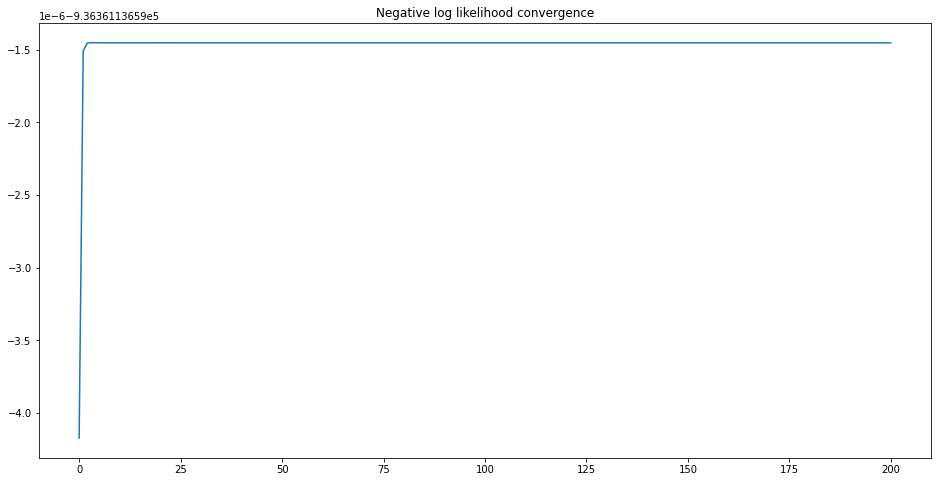

In [30]:
# Gaussian mixture, PCA
gaussian_mixture = GaussianMixture(nr_states, emission_dim)
nlls = gaussian_mixture.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

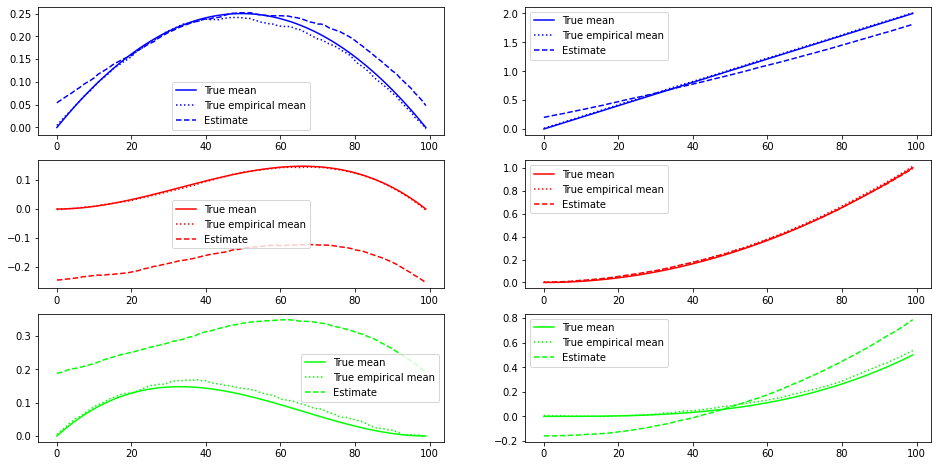

In [31]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_pca(gaussian_mixture.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_pca(gaussian_mixture.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

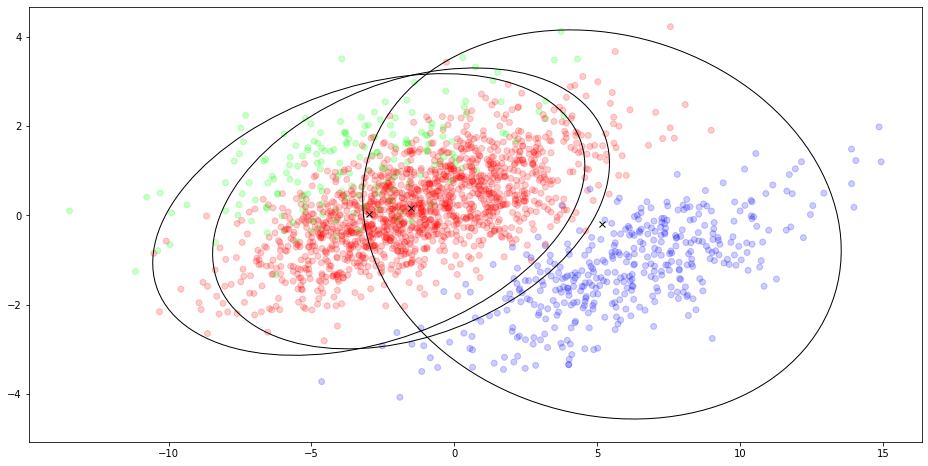

In [32]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

Accuracy: 0.791
Negative log likelihood: 17211.88784724432


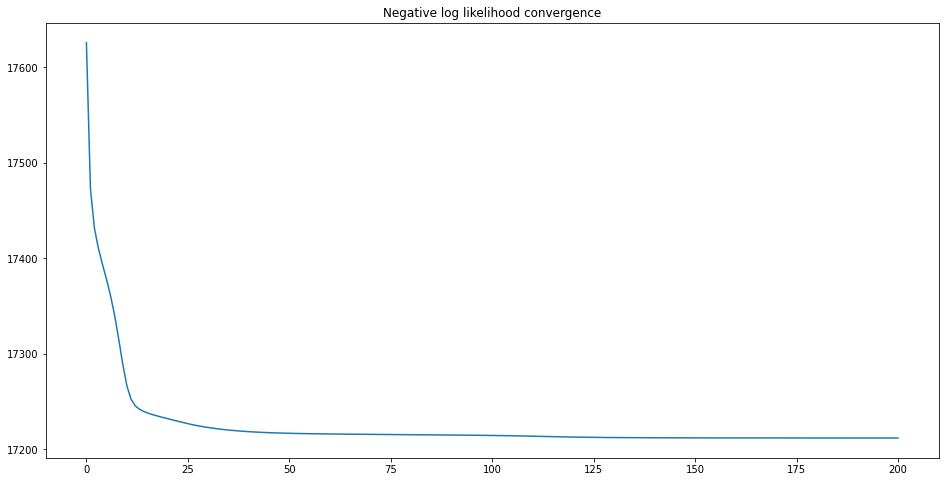

In [33]:
# Gaussian mixture, PCA, reduced
gaussian_mixture = GaussianMixture(nr_states, emission_dim_reduced)
nlls = gaussian_mixture.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

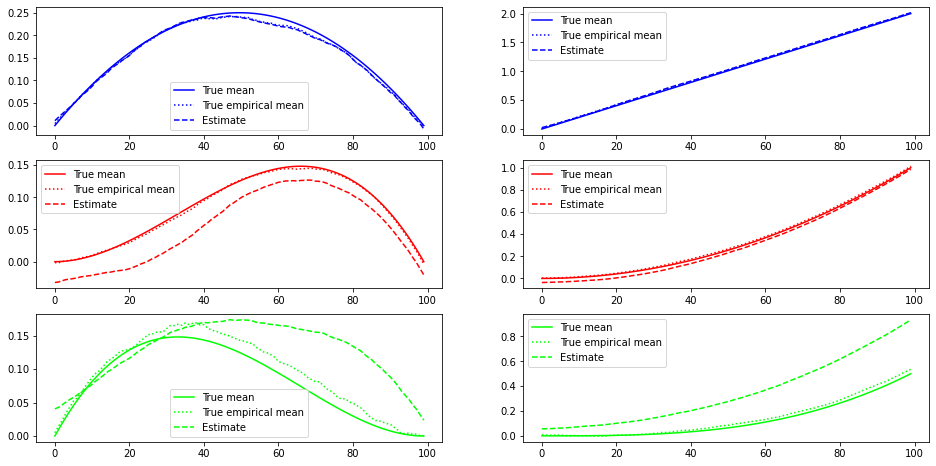

In [34]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_pca(gaussian_mixture.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_pca(gaussian_mixture.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

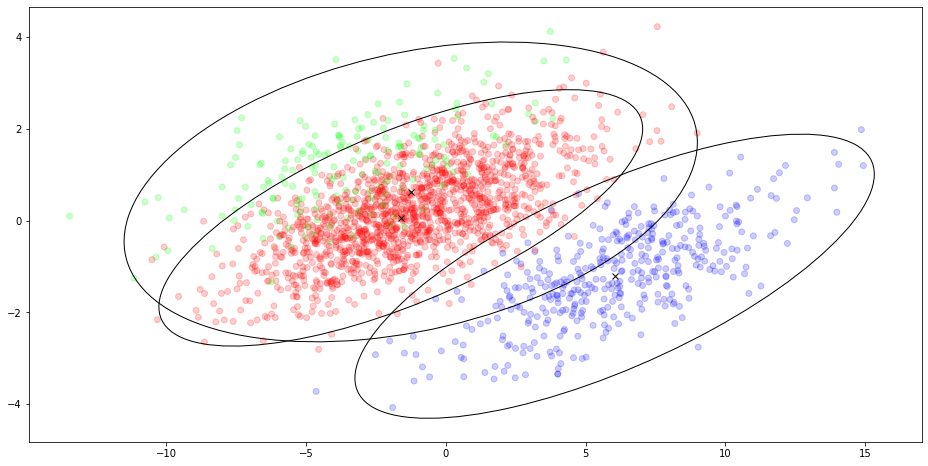

In [35]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

Accuracy: 0.812
Negative log likelihood: 27587.571592031283


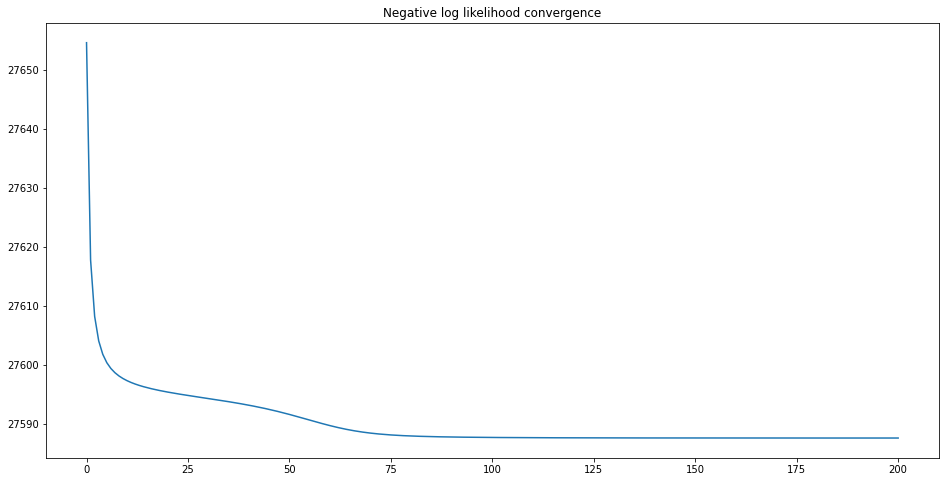

In [36]:
# Gaussian mixture, whitened data
gaussian_mixture = GaussianMixture(nr_states, emission_dim_reduced)
nlls = gaussian_mixture.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

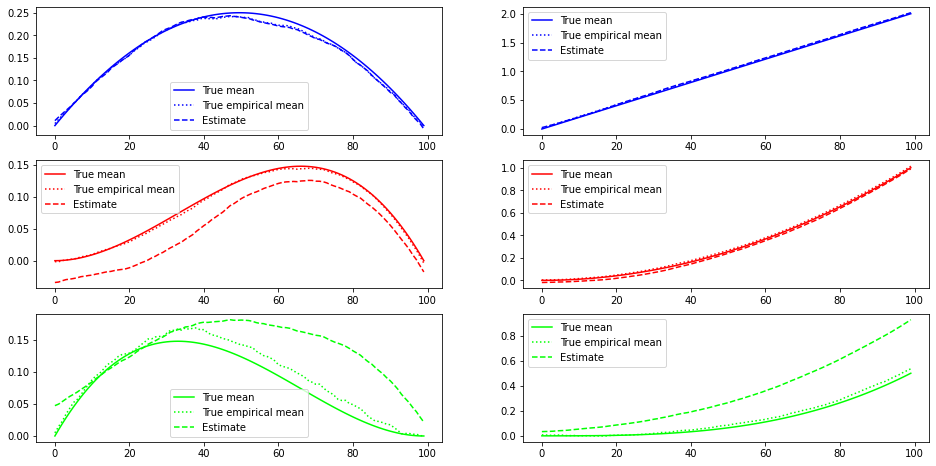

In [37]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_white(gaussian_mixture.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_white(gaussian_mixture.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

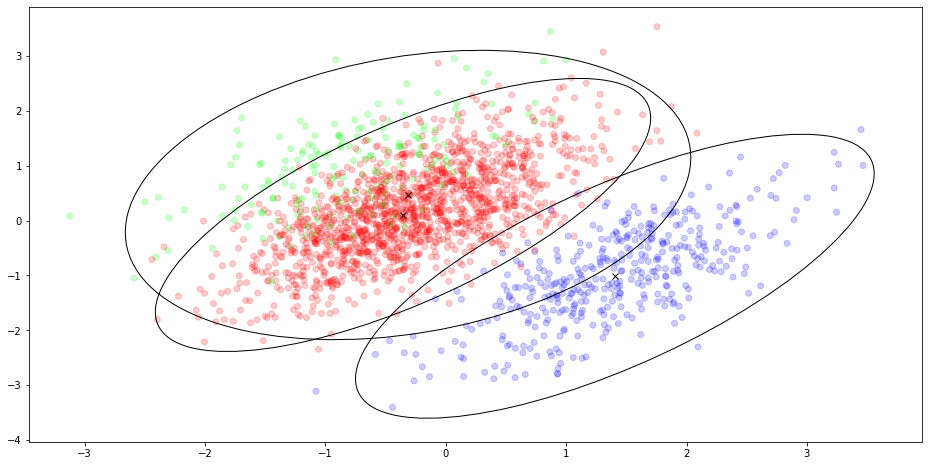

In [38]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

### HMM with covariance set to 1

Accuracy: 0.554
Negative log likelihood: 383474.3953909875


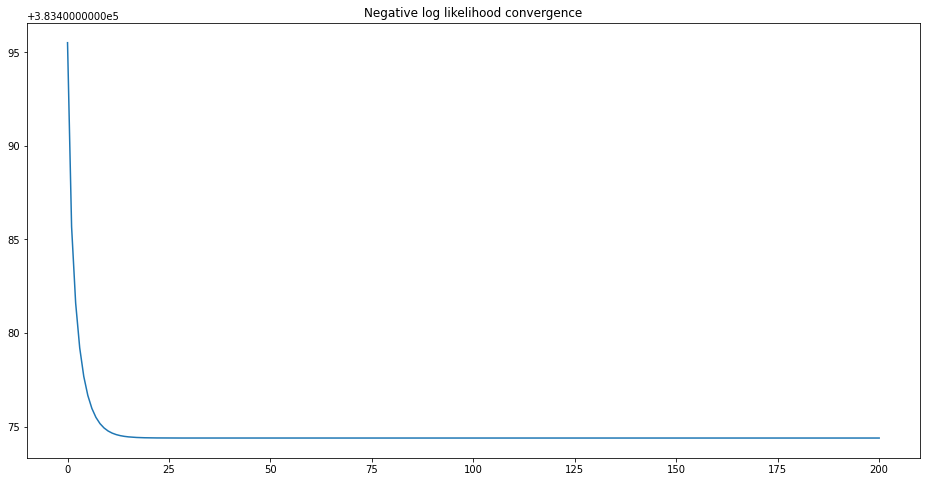

In [39]:
# HMM with covariance set to 1, no PCA
hmm_cov_1 = HMMCov1(nr_states, emission_dim)
nlls = hmm_cov_1.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

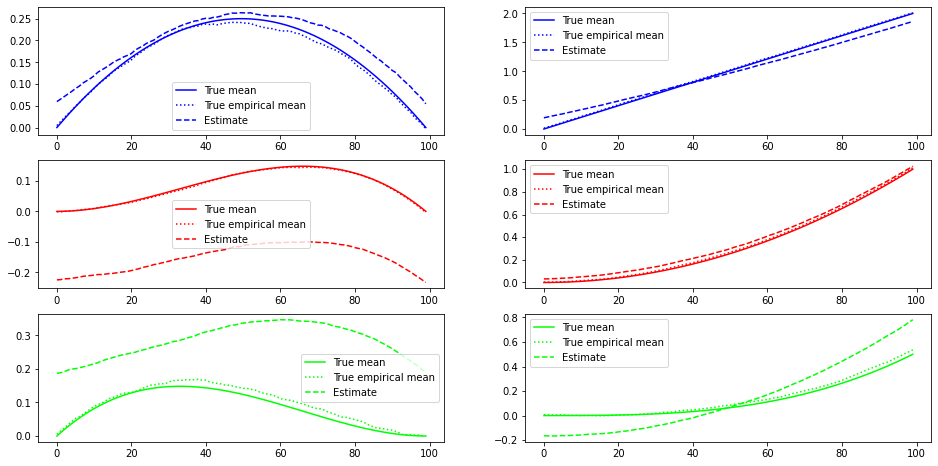

In [40]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(hmm_cov_1.mu[mapping.index(s), :data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(hmm_cov_1.mu[mapping.index(s), data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

Accuracy: 0.554
Negative log likelihood: 383474.39539098827


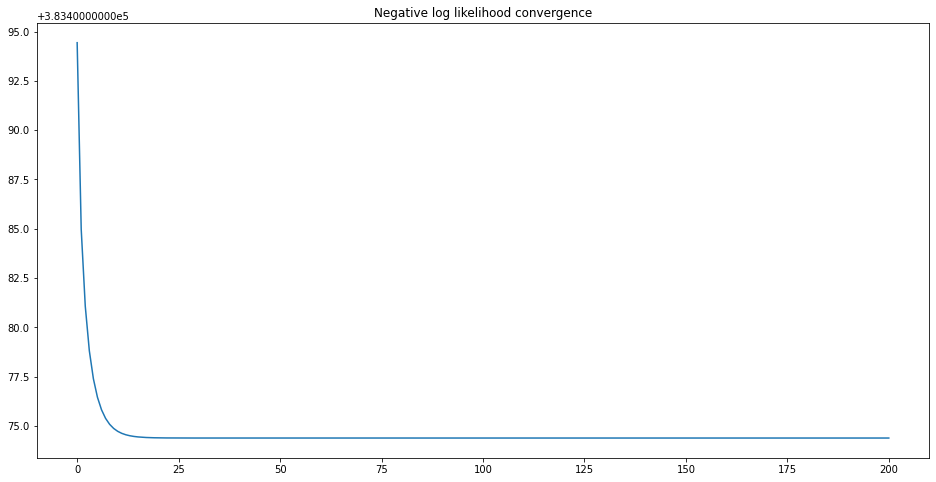

In [41]:
# HMM with covariance set to 1, PCA
hmm_cov_1 = HMMCov1(nr_states, emission_dim)
nlls = hmm_cov_1.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

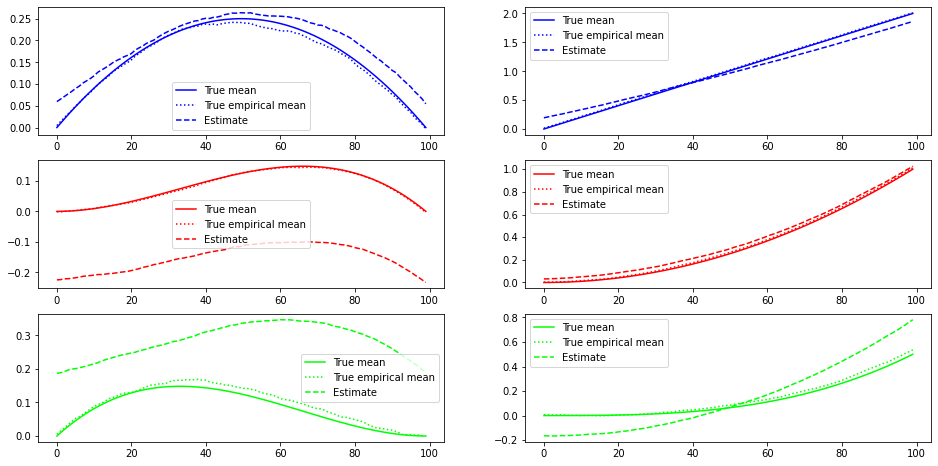

In [42]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_pca(hmm_cov_1.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_pca(hmm_cov_1.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

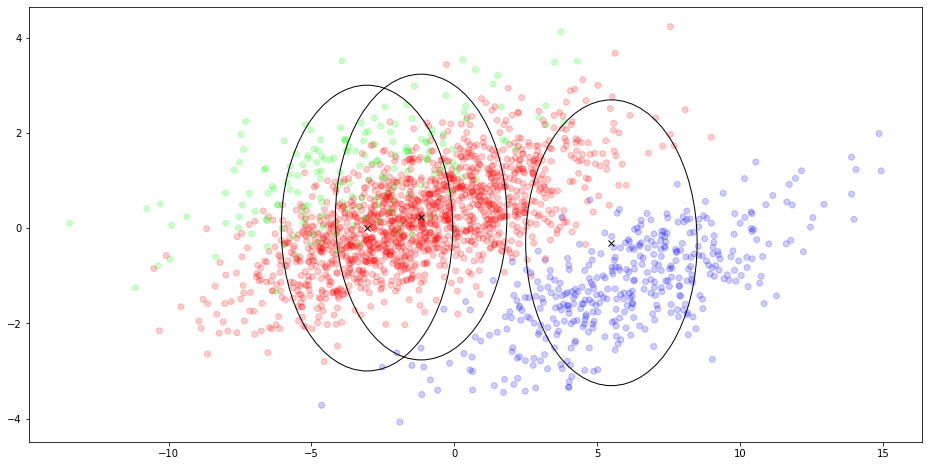

In [43]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

Accuracy: 0.554
Negative log likelihood: 34005.560842726634


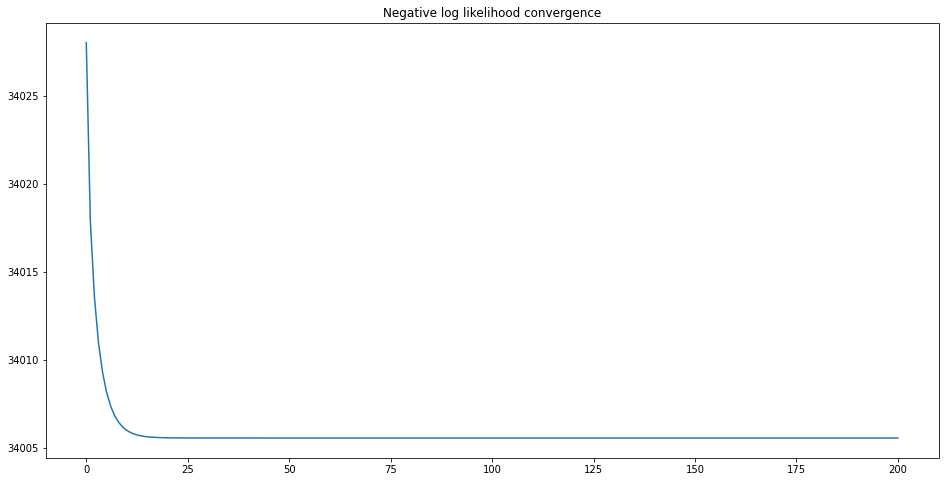

In [44]:
# HMM with covariance set to 1, PCA, reduced
hmm_cov_1 = HMMCov1(nr_states, emission_dim_reduced)
nlls = hmm_cov_1.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

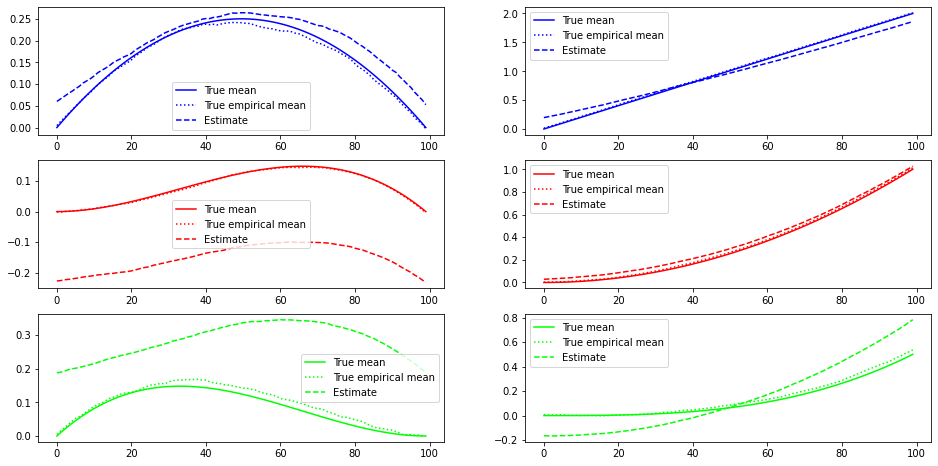

In [45]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_pca(hmm_cov_1.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_pca(hmm_cov_1.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

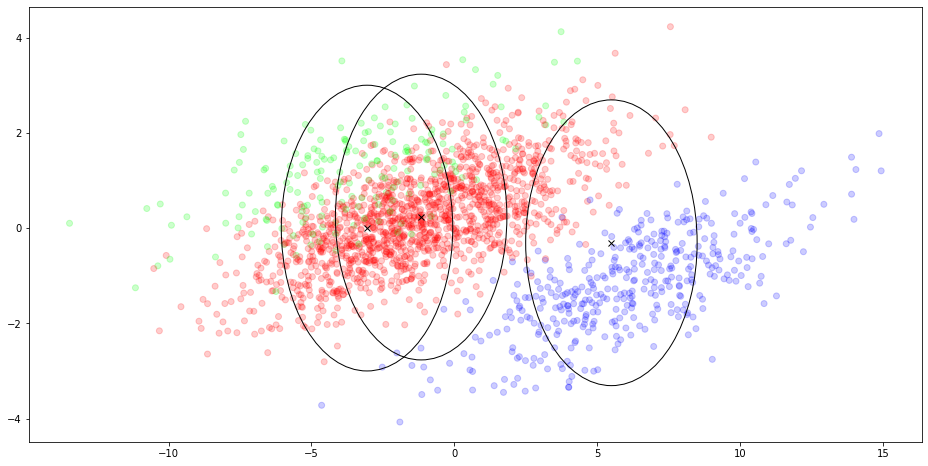

In [46]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

Accuracy: 0.7605
Negative log likelihood: 28101.685675058114


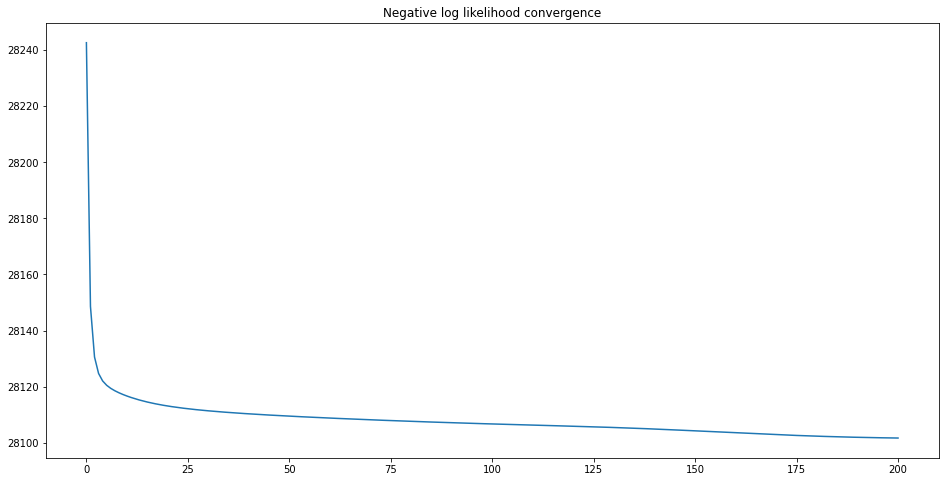

In [47]:
# HMM with covariance set to 1, whitened data
hmm_cov_1 = HMMCov1(nr_states, emission_dim_reduced)
nlls = hmm_cov_1.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

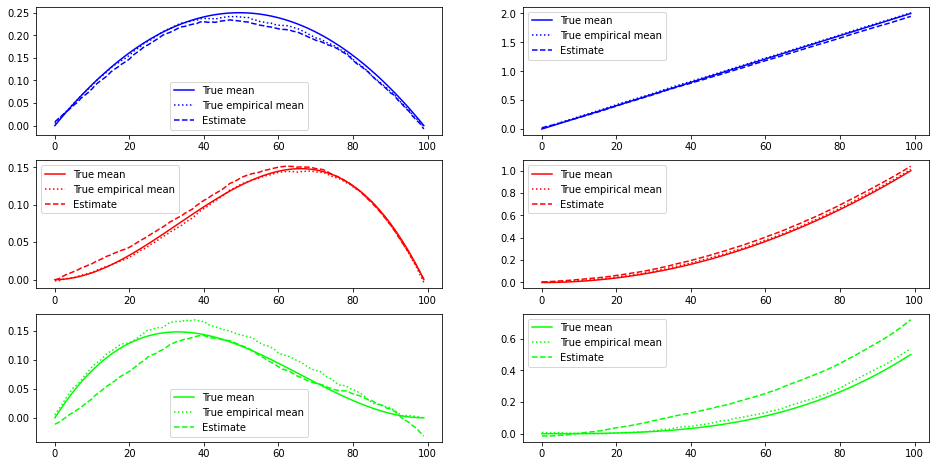

In [48]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_white(hmm_cov_1.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_white(hmm_cov_1.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

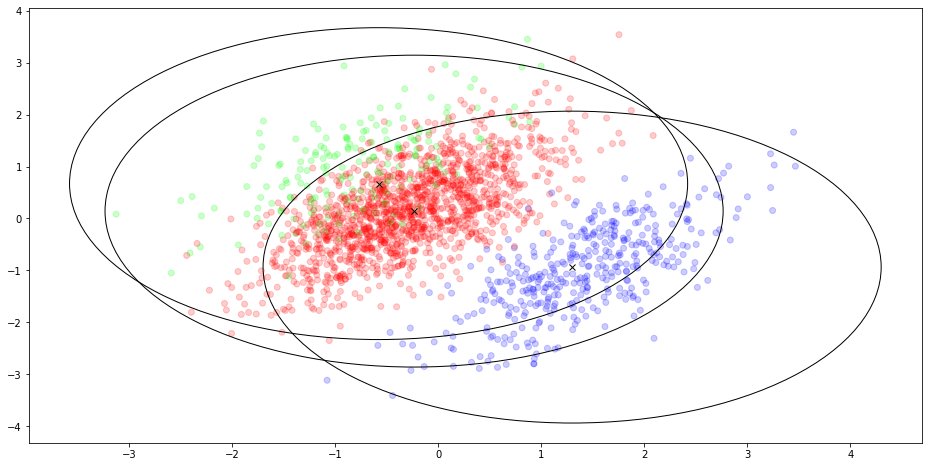

In [49]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

### HMM

Accuracy: 0.533
Negative log likelihood: -936464.4518983838


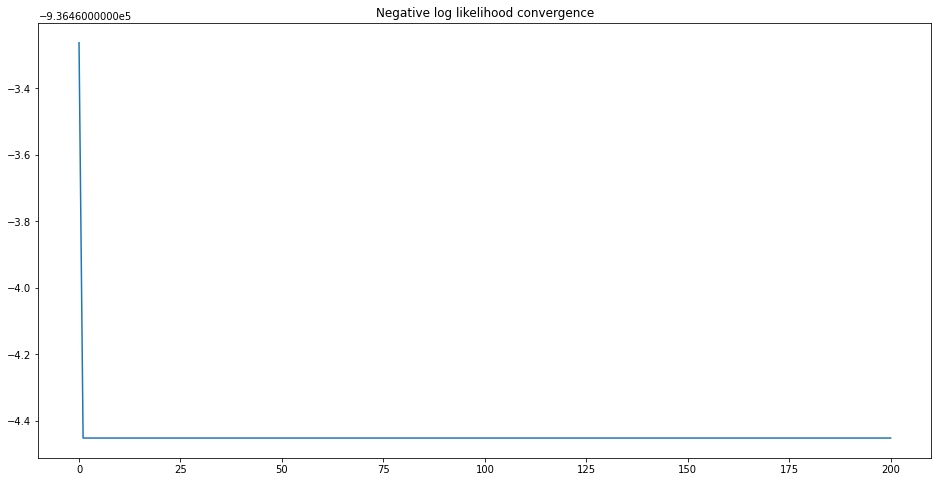

In [50]:
# HMM, no PCA
hmm = HMM(nr_states, emission_dim)
nlls = hmm.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

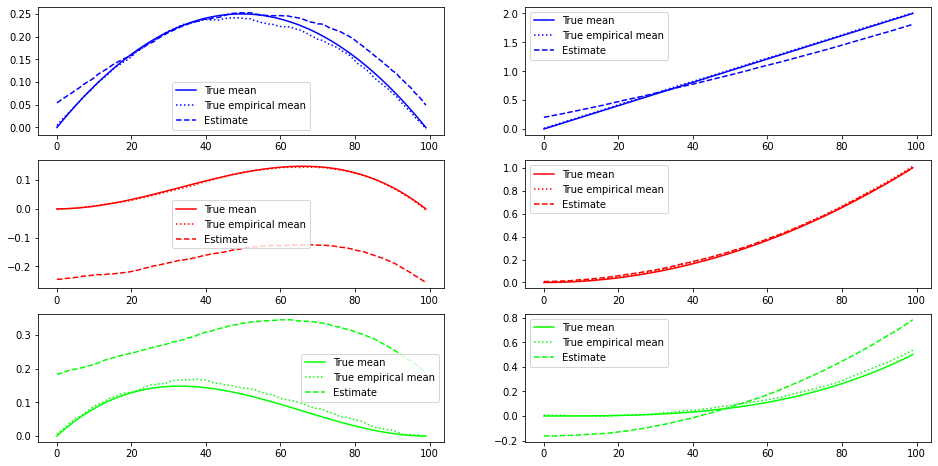

In [51]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(hmm.mu[mapping.index(s), :data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(hmm.mu[mapping.index(s), data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

Accuracy: 0.535
Negative log likelihood: -936430.0231719607


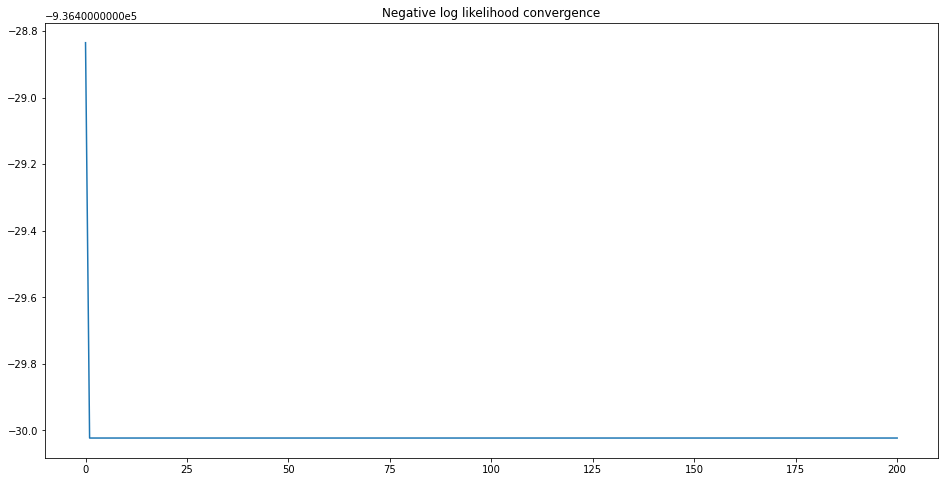

In [52]:
# HMM, PCA
hmm = HMM(nr_states, emission_dim)
nlls = hmm.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

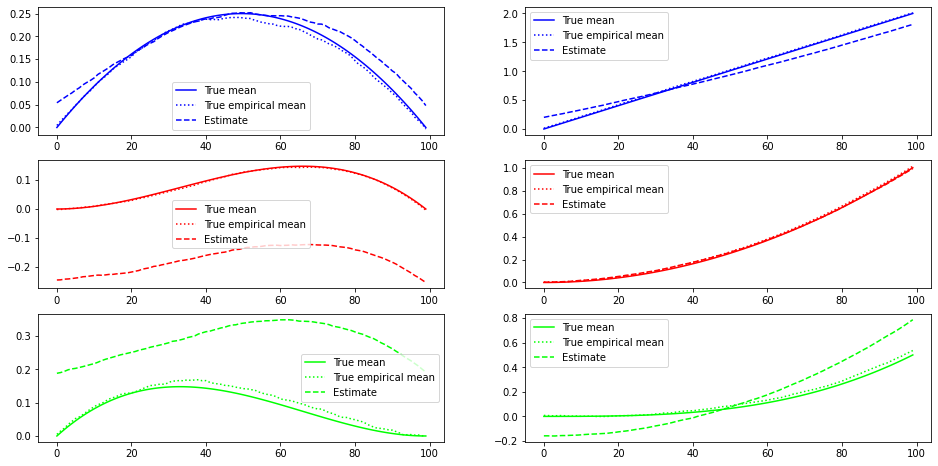

In [53]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_pca(hmm.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_pca(hmm.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

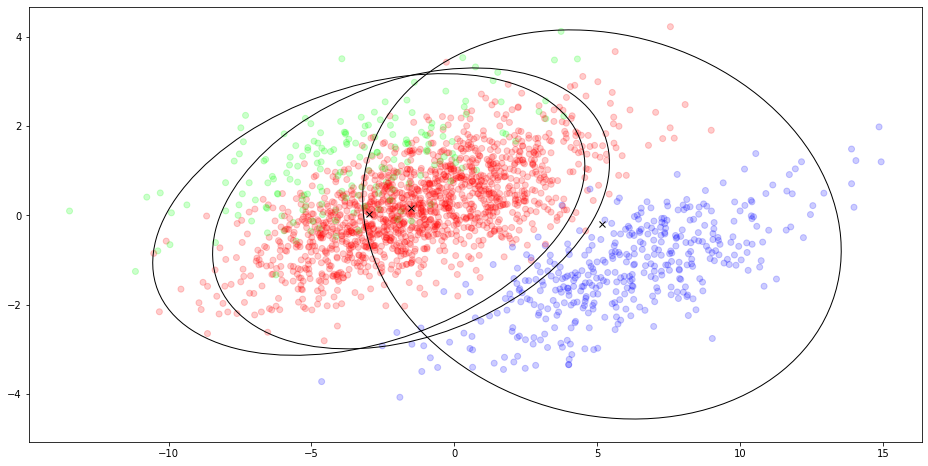

In [54]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')

Accuracy: 0.9005
Negative log likelihood: 16917.606247784977


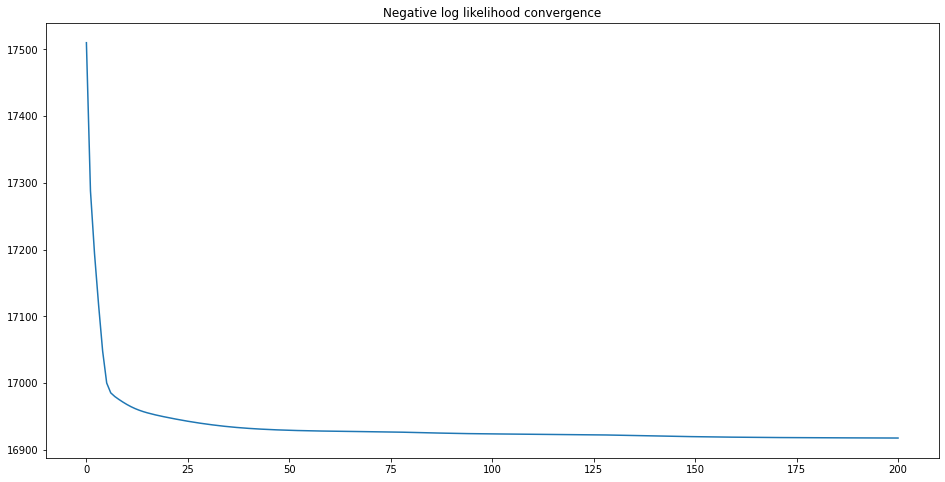

In [55]:
# HMM, PCA, reduced
hmm = HMM(nr_states, emission_dim_reduced)
nlls = hmm.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

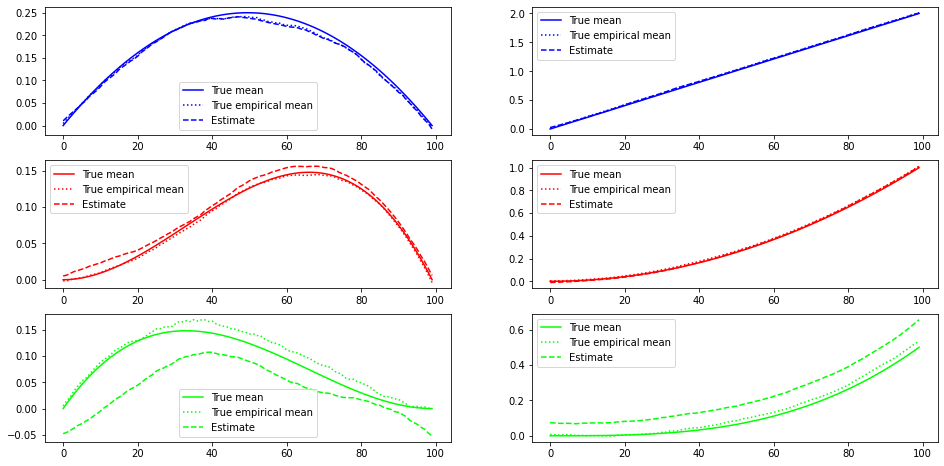

In [56]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_pca(hmm.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_pca(hmm.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

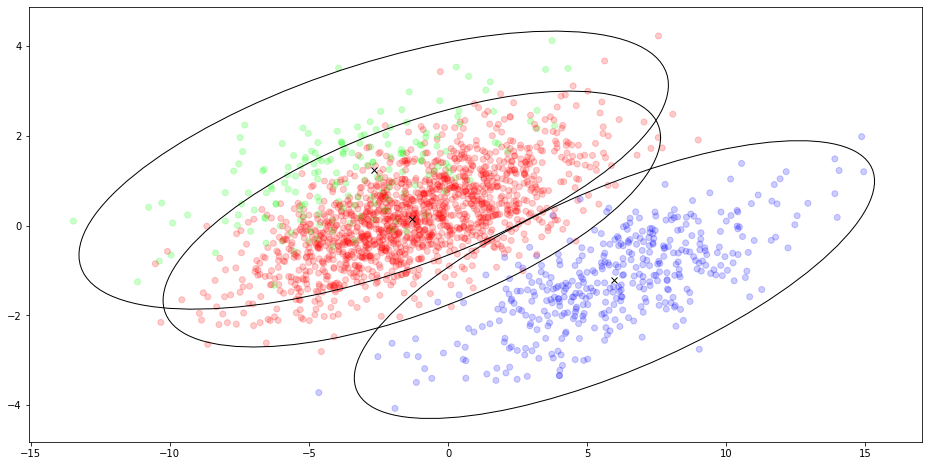

In [57]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')

Accuracy: 0.858
Negative log likelihood: 27296.379924713932


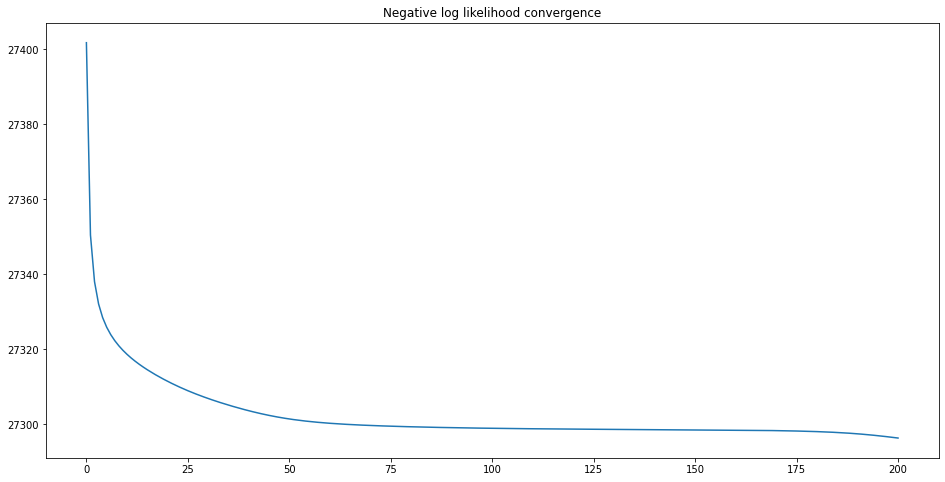

In [58]:
# HMM, whitened data
hmm = HMM(nr_states, emission_dim_reduced)
nlls = hmm.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

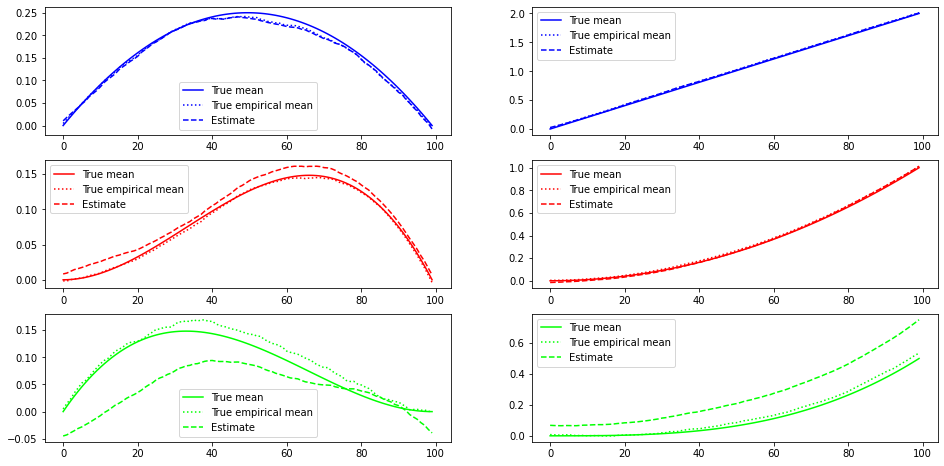

In [59]:
fig, axs = plt.subplots(nr_states, 2)
for s in range(nr_states):
    axs[s, 0].plot(mu_1[s], label='True mean', color=cmap(s))
    axs[s, 1].plot(mu_2[s], label='True mean', color=cmap(s))
    axs[s, 0].plot(data[true_states == s].mean(axis=0)[:data_dim], ':', label='True empirical mean', color=cmap(s))
    axs[s, 1].plot(data[true_states == s].mean(axis=0)[data_dim:], ':', label='True empirical mean', color=cmap(s))
    axs[s, 0].plot(inverse_white(hmm.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s, 1].plot(inverse_white(hmm.mu[mapping.index(s)])[data_dim:], '--', label='Estimate', color=cmap(s))
    axs[s, 0].legend()
    axs[s, 1].legend()

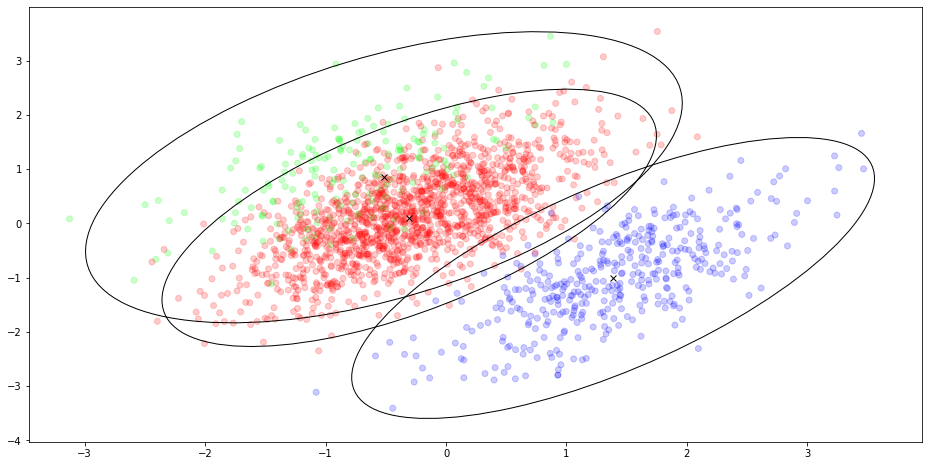

In [60]:
dims = 0, 2
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')

## Real world data

### Data

In [61]:
record = wfdb.rdrecord('data/MIT_BIH_Arrhythmia_Database/119')
annotation = wfdb.rdann('data/MIT_BIH_Arrhythmia_Database/119', 'atr')
symbols = np.asarray(annotation.symbol, dtype=object)

In [62]:
# preprocessing
cuts = annotation.sample[(symbols == 'N') | (symbols == 'V')]
periods = (cuts[1:] - cuts[:-1]) / record.fs
max_data_len = max(cuts[1:] - cuts[:-1])
data = np.array([
    np.interp(
        np.linspace(0, 1, max_data_len),  # resample so we have the same number of samples per curve
        np.linspace(0, 1, cuts[i+1]-cuts[i]), 
        record.p_signal[cuts[i]:cuts[i+1], 0])
    for i in range(len(cuts)-1)
])
data = data - data.mean(axis=1)[:, np.newaxis]  # vertical align

In [63]:
# true labels from annotations by medical experts
s = symbols[(symbols == 'N') | (symbols == 'V')]
nn, nv, vn = 0, 1, 2
true_states = np.array([
    nn if s[t] == 'N' and s[t+1] == 'N'
    else nv if s[t] == 'N' and s[t+1] == 'V'
    else vn
    for t in range(data.shape[0])
])

In [64]:
# Model parameters
nr_states, emission_dim, emission_dim_reduced = 3, data.shape[1], 2

In [65]:
# PCA
pca = sklearn.decomposition.PCA()
data_pca = pca.fit_transform(data)
data_pca_reduced = data_pca[:, :emission_dim_reduced]

def inverse_pca(curve):
    return pca.mean_ + np.dot(curve, pca.components_[:len(curve)])

In [66]:
# whitening
data_white = (data_pca_reduced / np.sqrt(data_pca_reduced.var(axis=0)))

def inverse_white(curve):
    return inverse_pca(curve * np.sqrt(data_pca_reduced.var(axis=0)))

### k-means

In [67]:
# k-means, no PCA
kmeans = KMeans(nr_states, emission_dim)
kmeans.fit(data)
states = kmeans.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 1.0


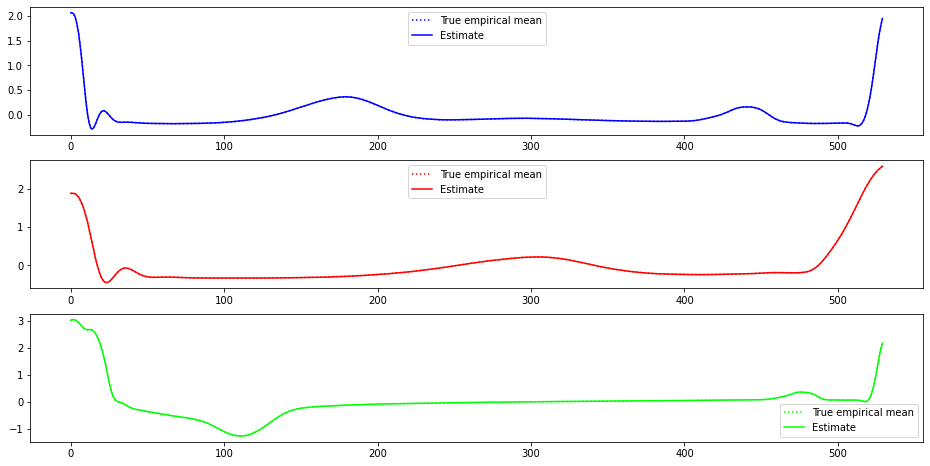

In [68]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(kmeans.mu[mapping.index(s)], label='Estimate', color=cmap(s))
    axs[s].legend()

In [69]:
# k-means, PCA
kmeans = KMeans(nr_states, emission_dim)
kmeans.fit(data_pca)
states = kmeans.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 1.0


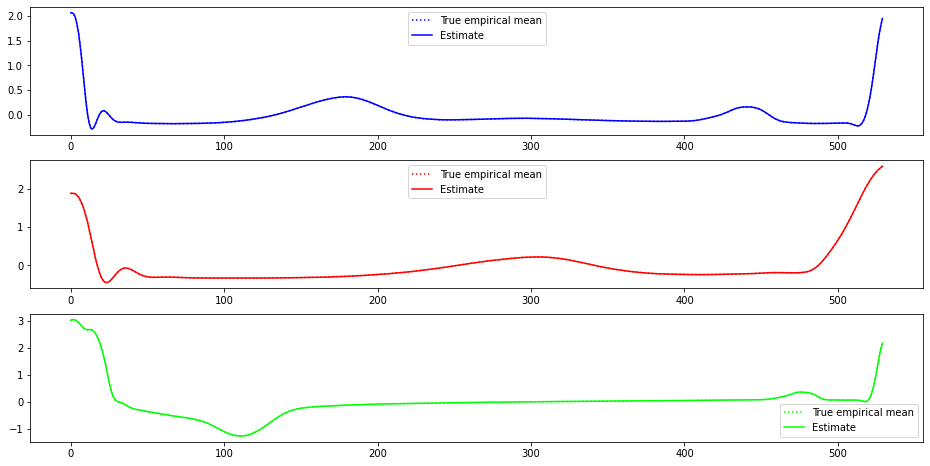

In [70]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(kmeans.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

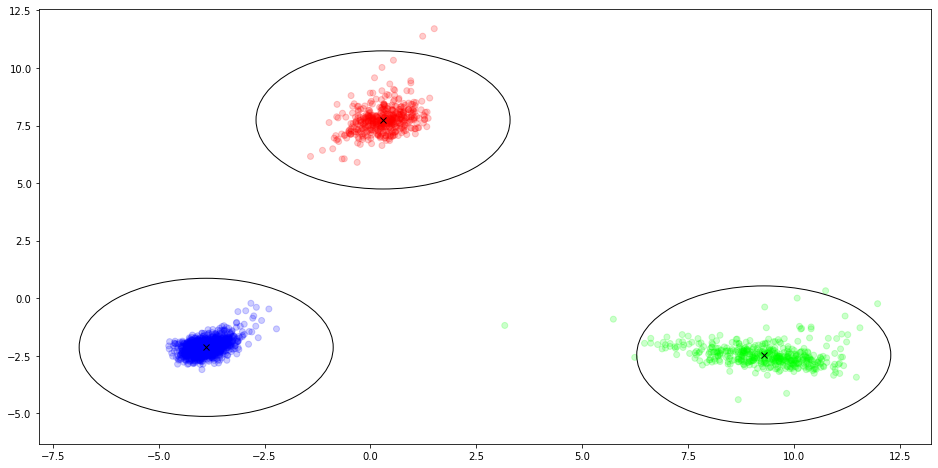

In [71]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(kmeans.mu[s], np.eye(emission_dim), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

In [72]:
# k-means, PCA, reduced
kmeans = KMeans(nr_states, emission_dim_reduced)
kmeans.fit(data_pca_reduced)
states = kmeans.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 1.0


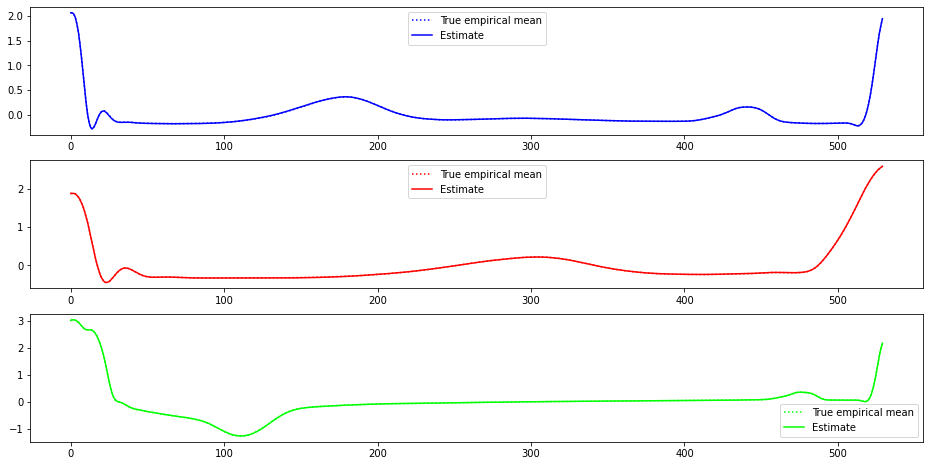

In [73]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(kmeans.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

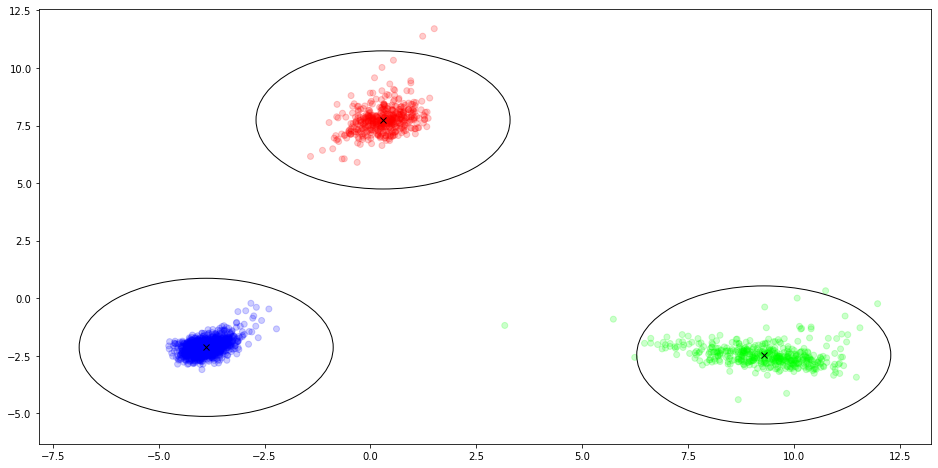

In [74]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(kmeans.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

In [75]:
# k-means, whitened data
kmeans = KMeans(nr_states, emission_dim_reduced)
kmeans.fit(data_white)
states = kmeans.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 1.0


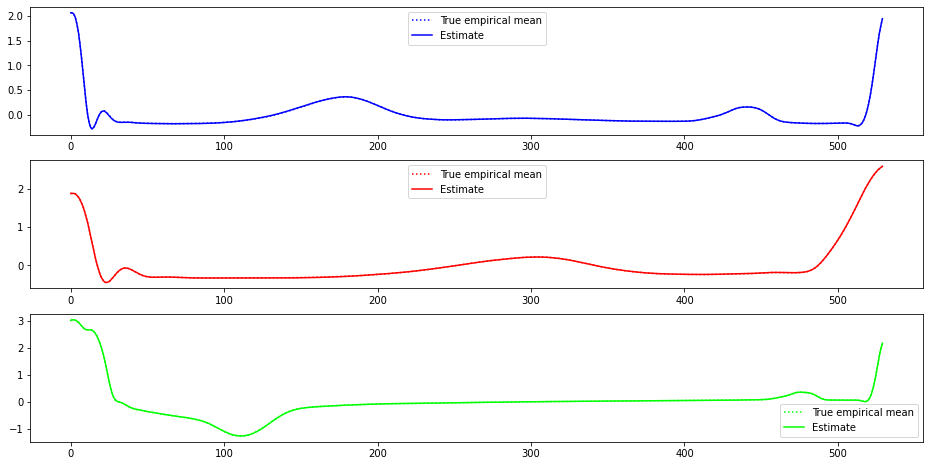

In [76]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_white(kmeans.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

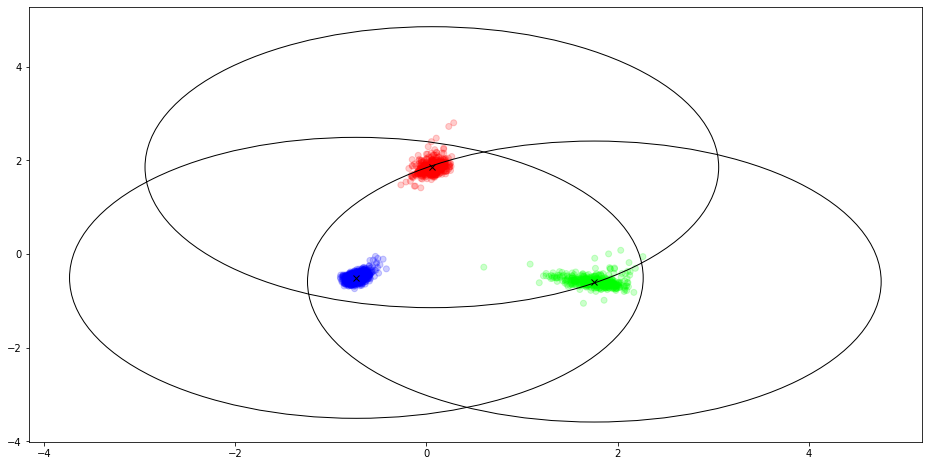

In [77]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(kmeans.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

### Gaussian mixture

Accuracy: 1.0
Negative log likelihood: -3960712.6607141313


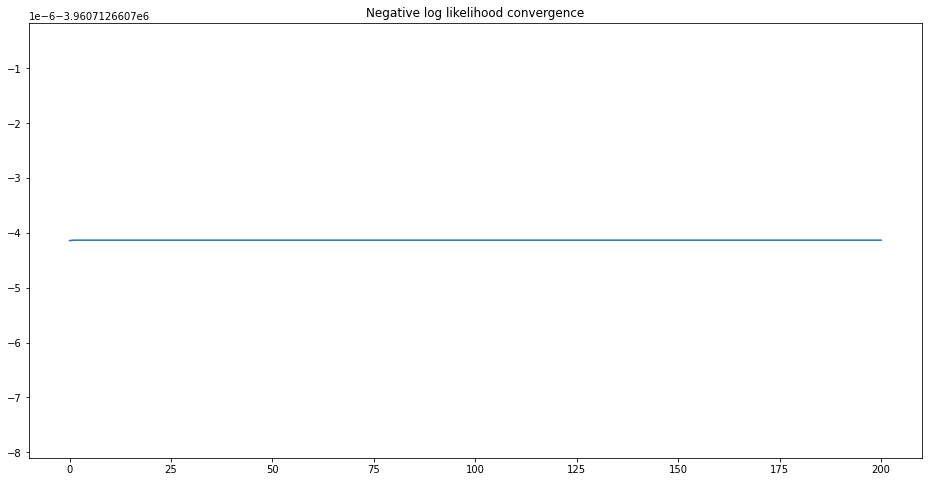

In [78]:
# Gaussian mixture, no PCA
gaussian_mixture = GaussianMixture(nr_states, emission_dim)
nlls = gaussian_mixture.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

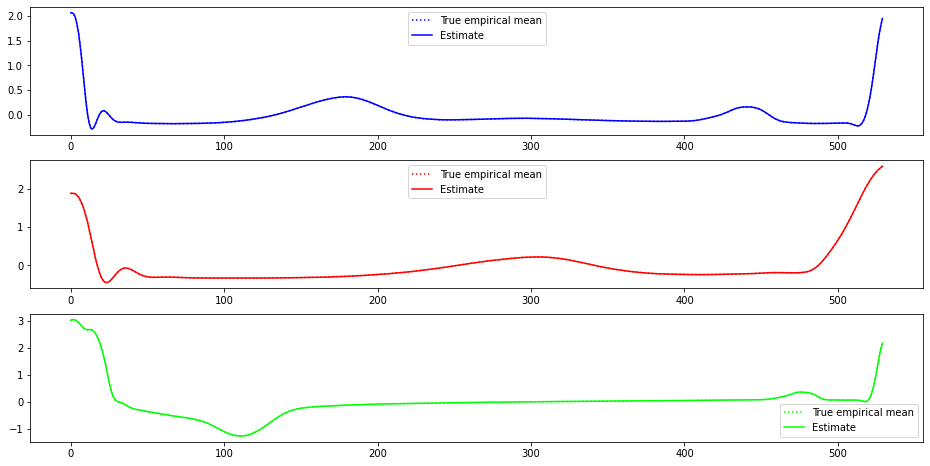

In [79]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(gaussian_mixture.mu[mapping.index(s)], label='Estimate', color=cmap(s))
    axs[s].legend()

Accuracy: 1.0
Negative log likelihood: -3960712.6607141523


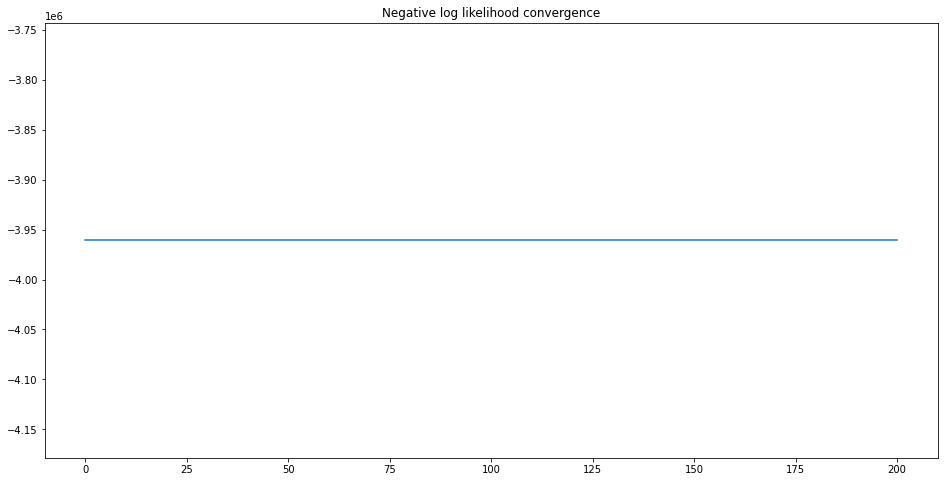

In [80]:
# Gaussian mixture, PCA
gaussian_mixture = GaussianMixture(nr_states, emission_dim)
nlls = gaussian_mixture.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

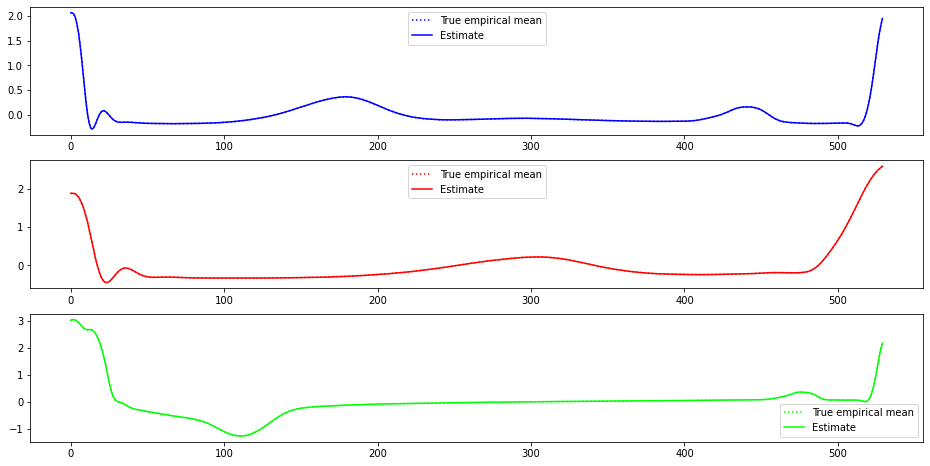

In [81]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(gaussian_mixture.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

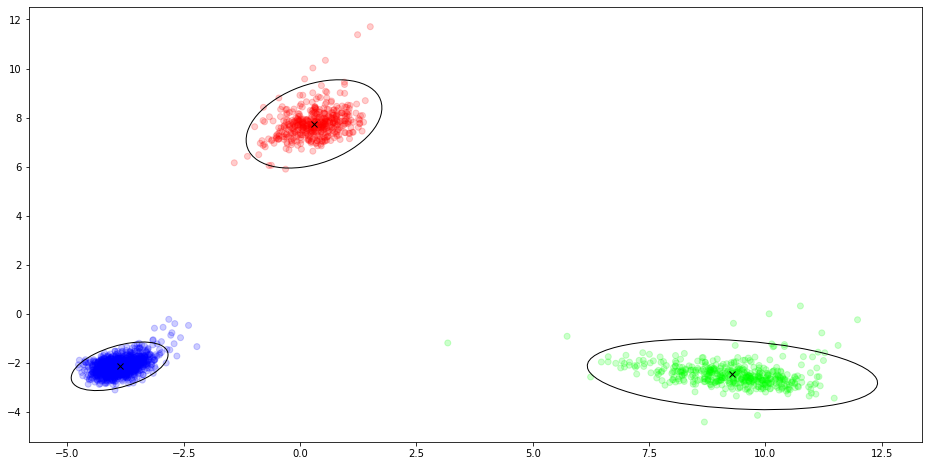

In [82]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

Accuracy: 1.0
Negative log likelihood: 4190.277889867433


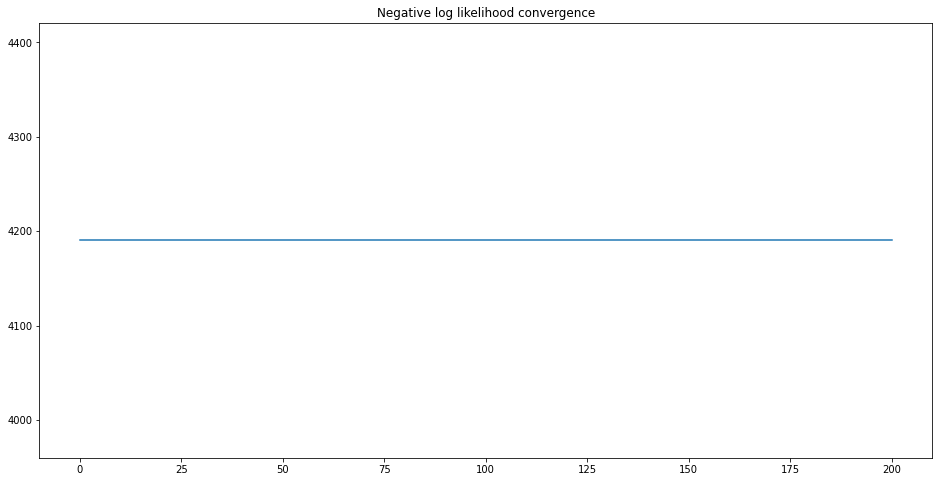

In [83]:
# Gaussian mixture, PCA, reduced
gaussian_mixture = GaussianMixture(nr_states, emission_dim_reduced)
nlls = gaussian_mixture.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

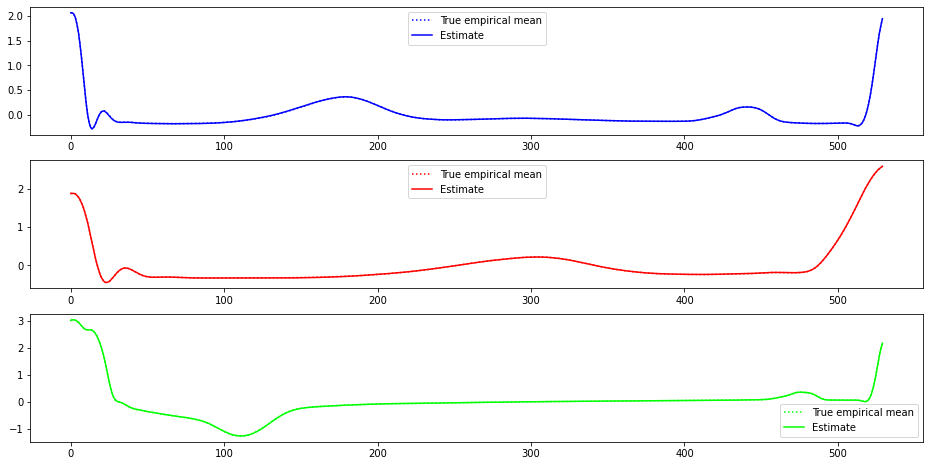

In [84]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(gaussian_mixture.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

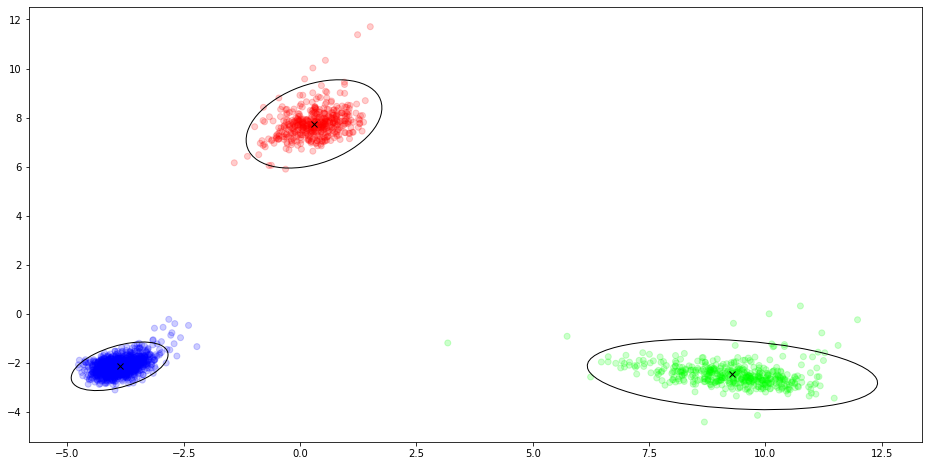

In [85]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

Accuracy: 1.0
Negative log likelihood: -1959.0833430725472


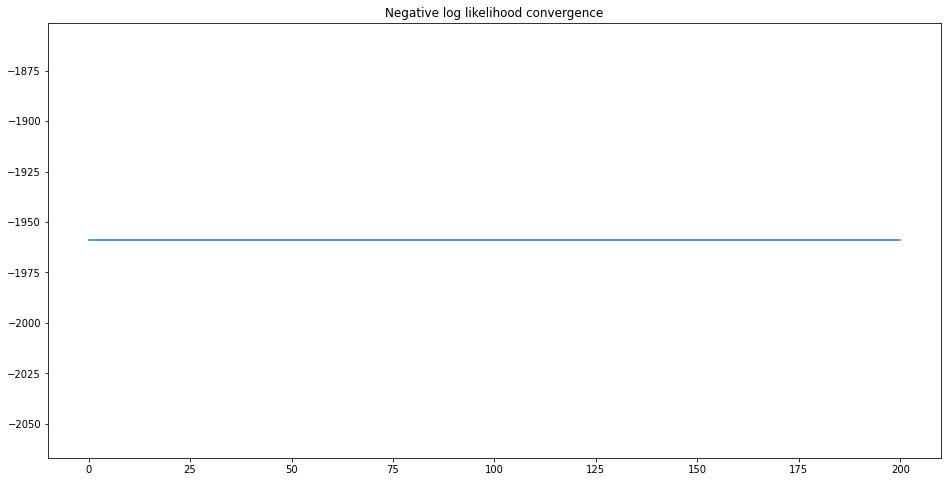

In [86]:
# Gaussian mixture, whitened data
gaussian_mixture = GaussianMixture(nr_states, emission_dim_reduced)
nlls = gaussian_mixture.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

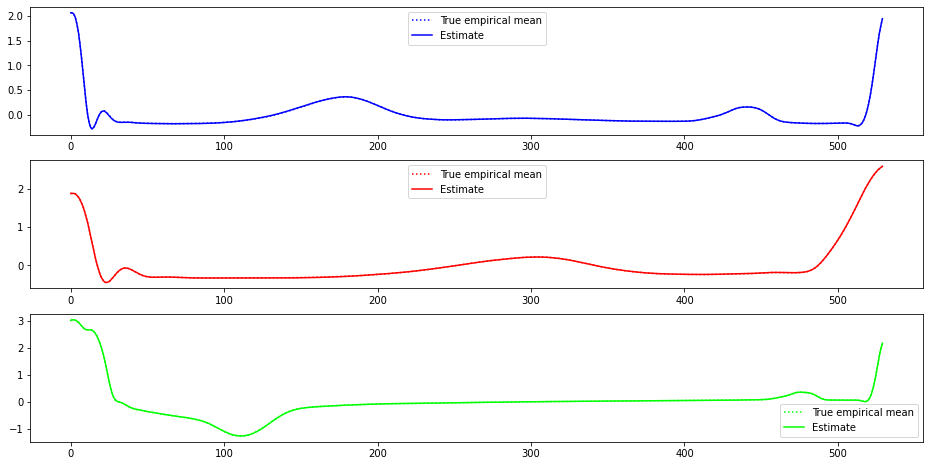

In [87]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_white(gaussian_mixture.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

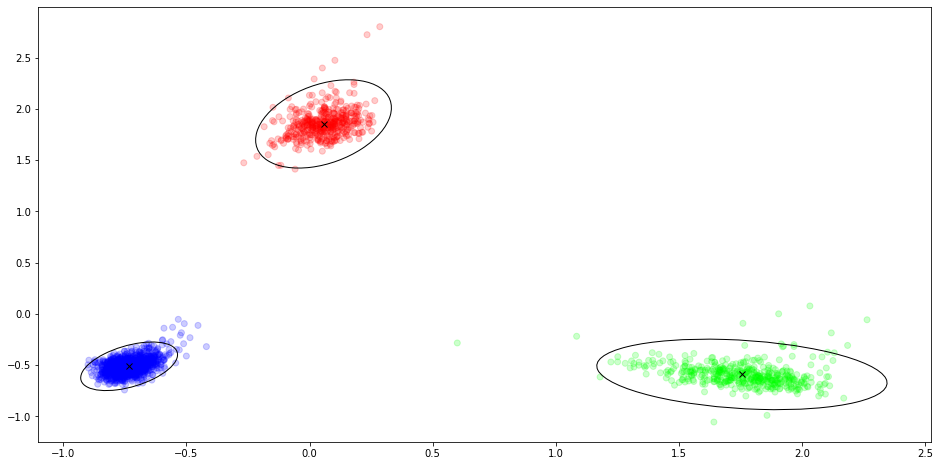

In [88]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

### HMM with covariance set to 1

/tmp/ipykernel_12013/3494935137.py:10: RuntimeWarning: divide by zero encountered in log
  np.log(c, out=c)


Accuracy: 1.0
Negative log likelihood: 971755.2936574812


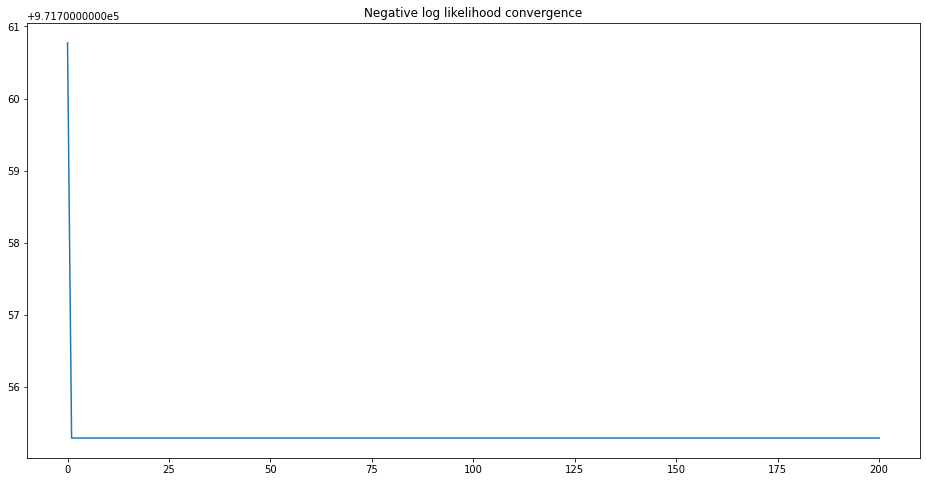

In [89]:
# HMM with covariance set to 1, no PCA
hmm_cov_1 = HMMCov1(nr_states, emission_dim)
nlls = hmm_cov_1.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

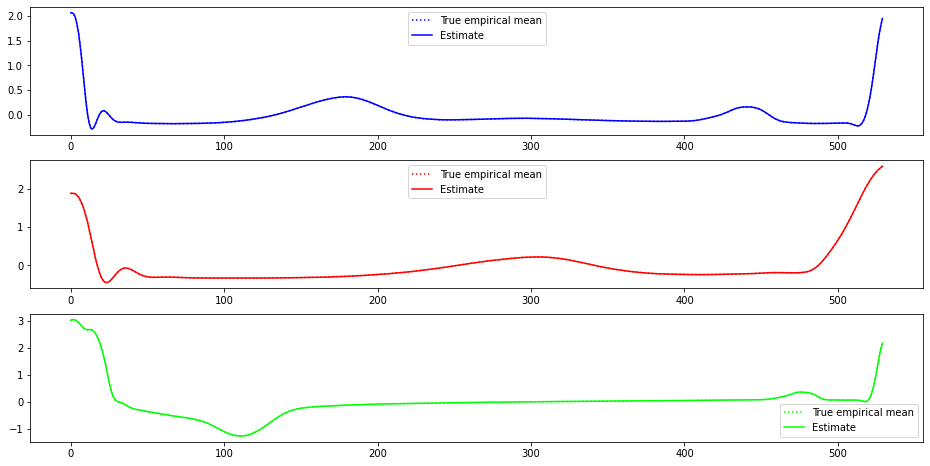

In [90]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(hmm_cov_1.mu[mapping.index(s)], label='Estimate', color=cmap(s))
    axs[s].legend()

/tmp/ipykernel_12013/3494935137.py:10: RuntimeWarning: divide by zero encountered in log
  np.log(c, out=c)


Accuracy: 1.0
Negative log likelihood: 971755.2936574836


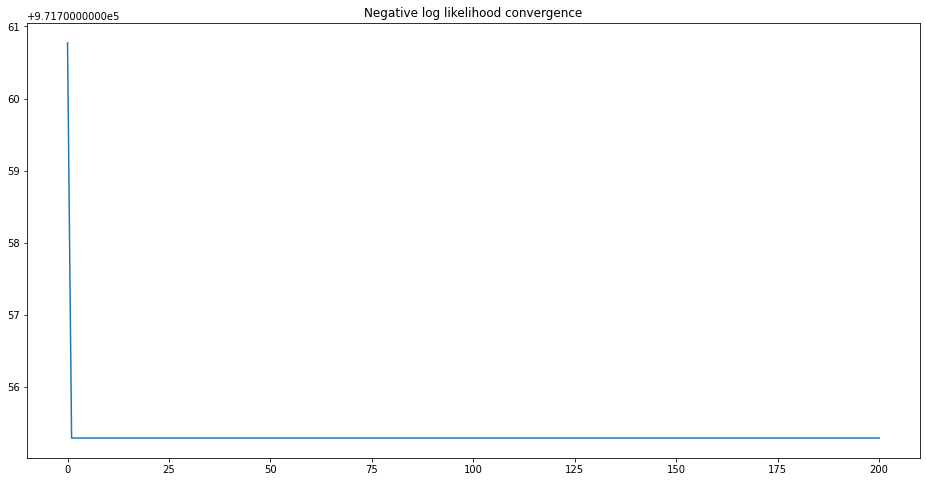

In [91]:
# HMM with covariance set to 1, PCA
hmm_cov_1 = HMMCov1(nr_states, emission_dim)
nlls = hmm_cov_1.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

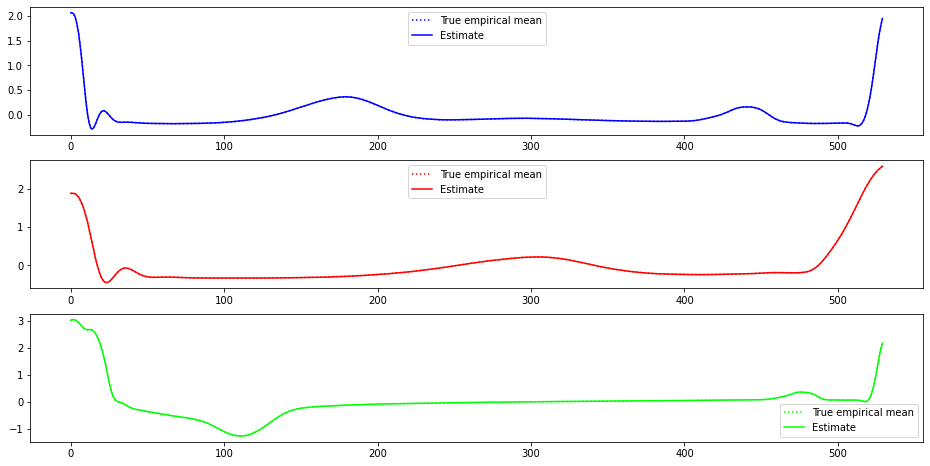

In [92]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(hmm_cov_1.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

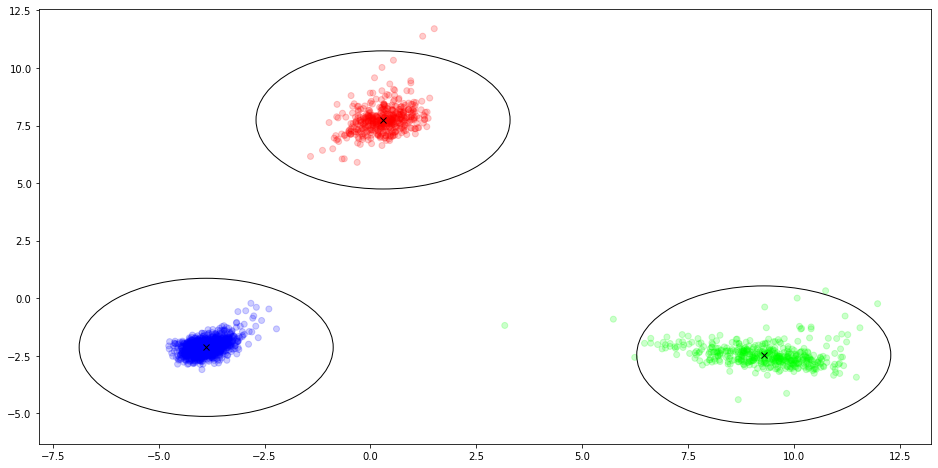

In [93]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

/tmp/ipykernel_12013/3494935137.py:10: RuntimeWarning: divide by zero encountered in log
  np.log(c, out=c)


Accuracy: 1.0
Negative log likelihood: 5109.504758696743


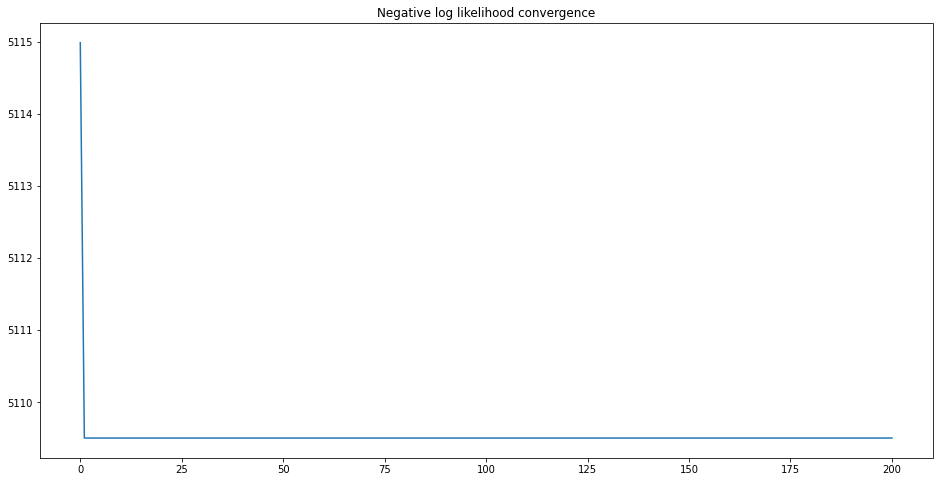

In [94]:
# HMM with covariance set to 1, PCA, reduced
hmm_cov_1 = HMMCov1(nr_states, emission_dim_reduced)
nlls = hmm_cov_1.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

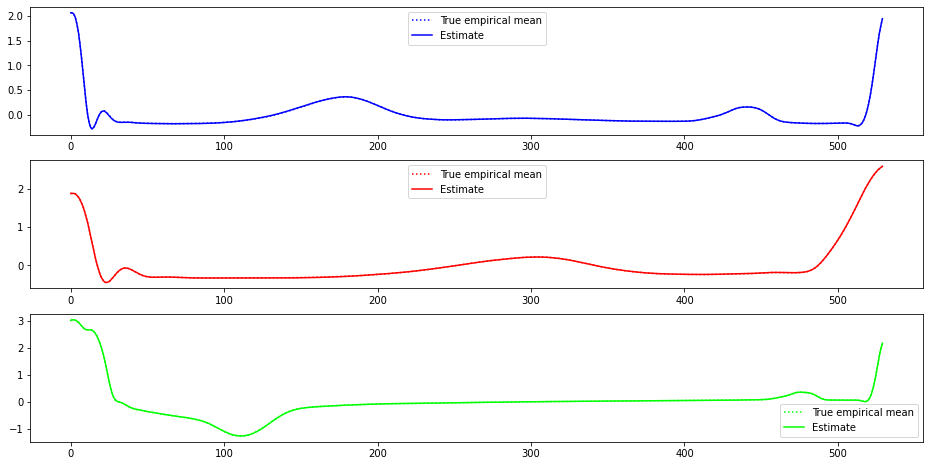

In [95]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(hmm_cov_1.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

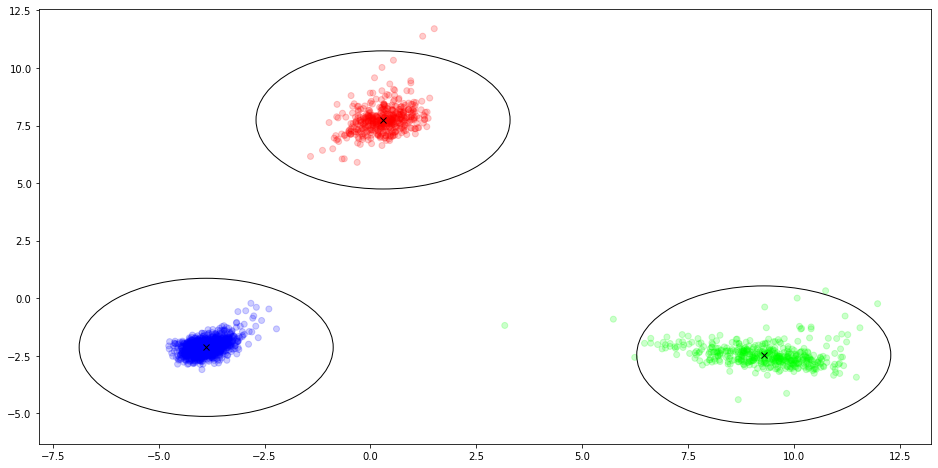

In [96]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

Accuracy: 1.0
Negative log likelihood: 4582.487907458068


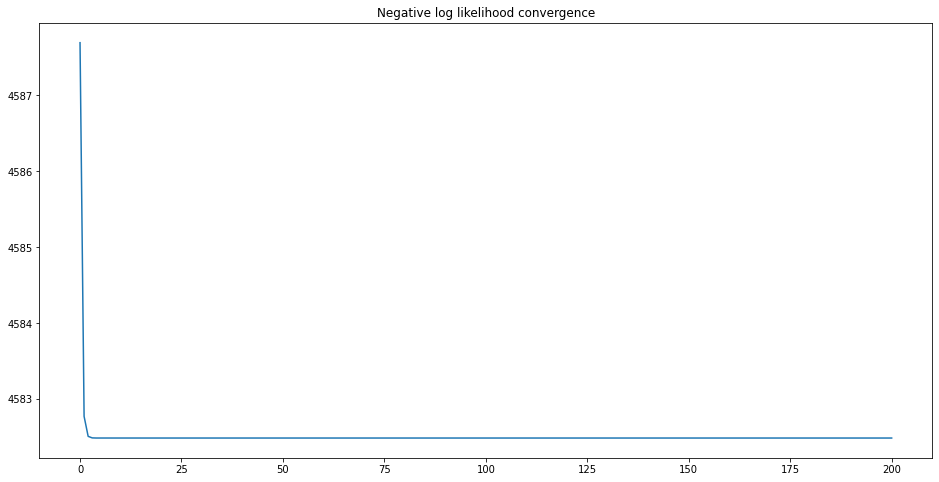

In [97]:
# HMM with covariance set to 1, whitened data
hmm_cov_1 = HMMCov1(nr_states, emission_dim_reduced)
nlls = hmm_cov_1.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

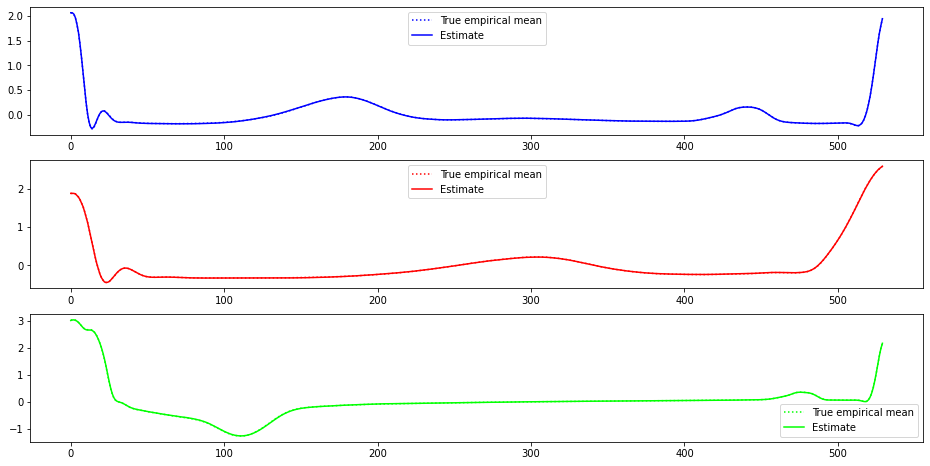

In [98]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_white(hmm_cov_1.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

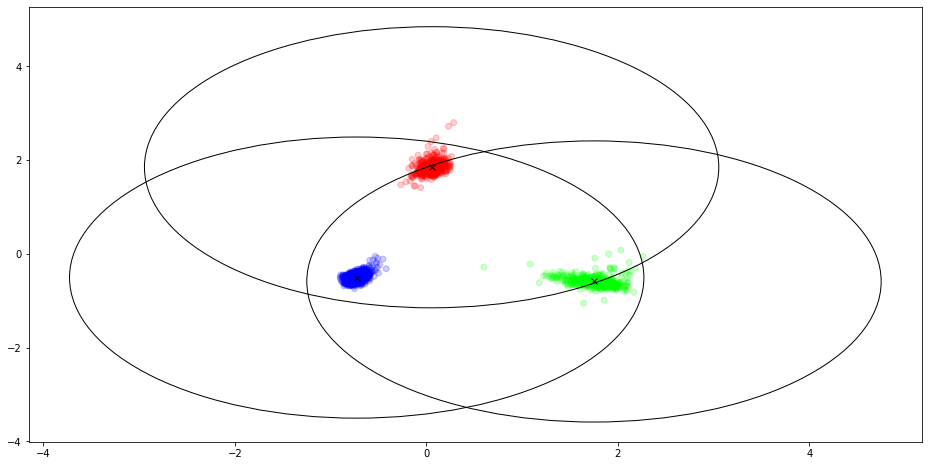

In [99]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

### HMM

/tmp/ipykernel_12013/3494935137.py:10: RuntimeWarning: divide by zero encountered in log
  np.log(c, out=c)


Accuracy: 1.0
Negative log likelihood: -3961782.054189373


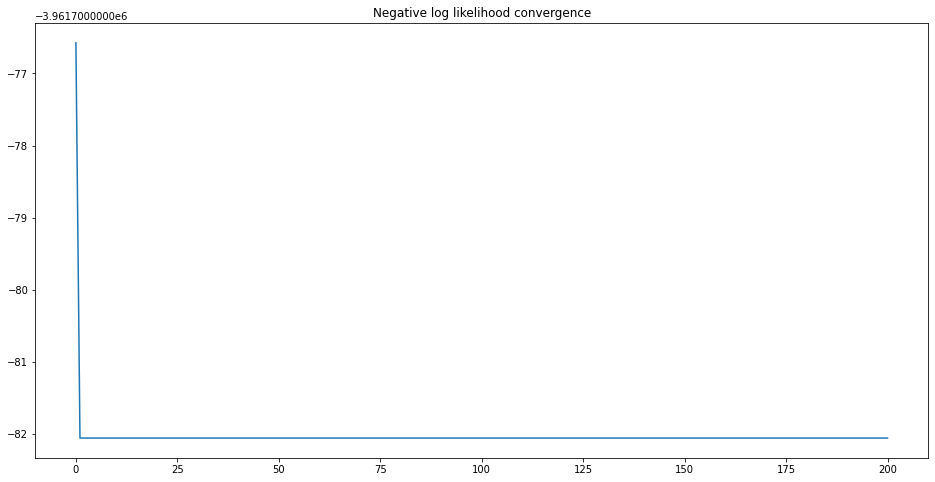

In [100]:
# HMM, no PCA
hmm = HMM(nr_states, emission_dim)
nlls = hmm.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

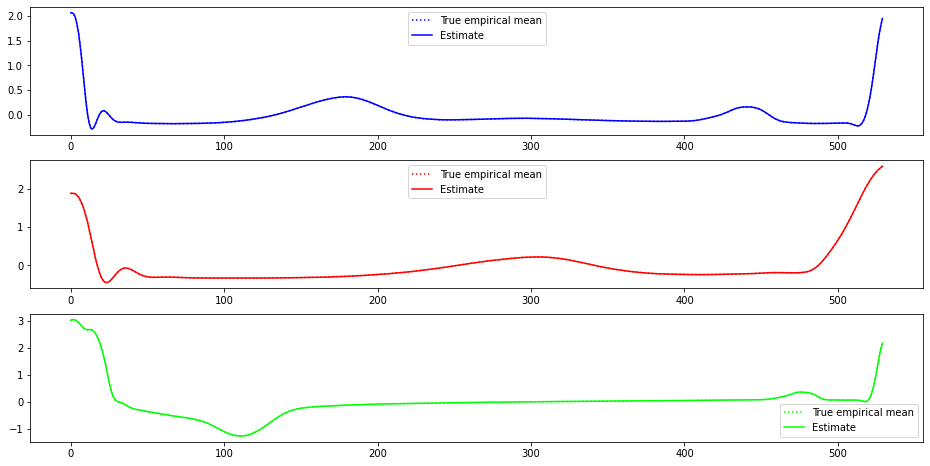

In [101]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(hmm.mu[mapping.index(s)], label='Estimate', color=cmap(s))
    axs[s].legend()

/tmp/ipykernel_12013/3494935137.py:10: RuntimeWarning: divide by zero encountered in log
  np.log(c, out=c)


Accuracy: 1.0
Negative log likelihood: -3961782.0541894105


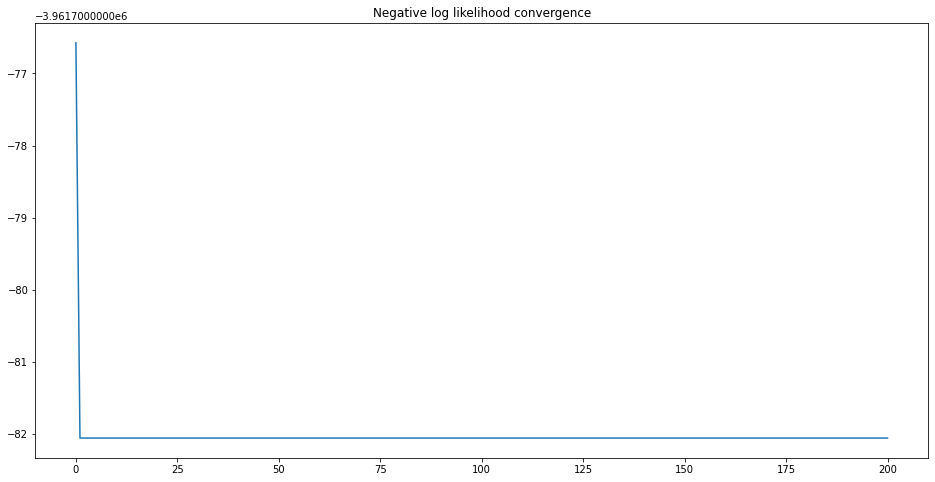

In [102]:
# HMM, PCA
hmm = HMM(nr_states, emission_dim)
nlls = hmm.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

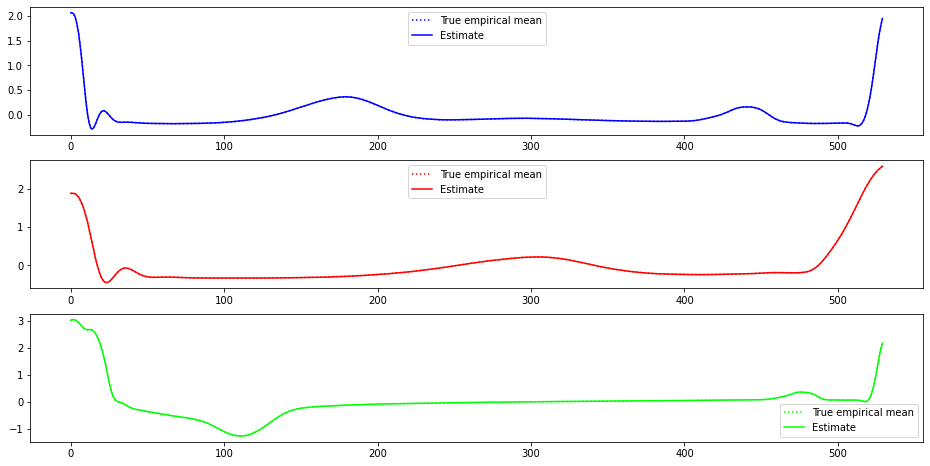

In [103]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(hmm.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

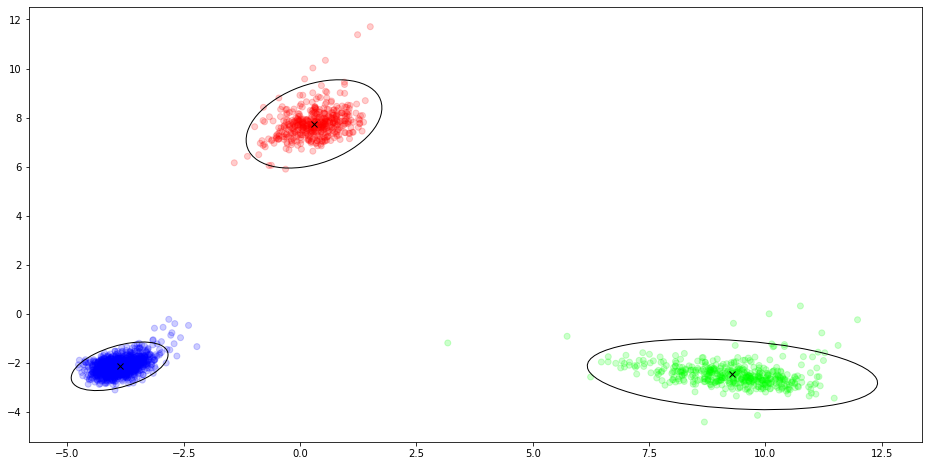

In [104]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')

/tmp/ipykernel_12013/3494935137.py:10: RuntimeWarning: divide by zero encountered in log
  np.log(c, out=c)


Accuracy: 1.0
Negative log likelihood: 3120.884414607755


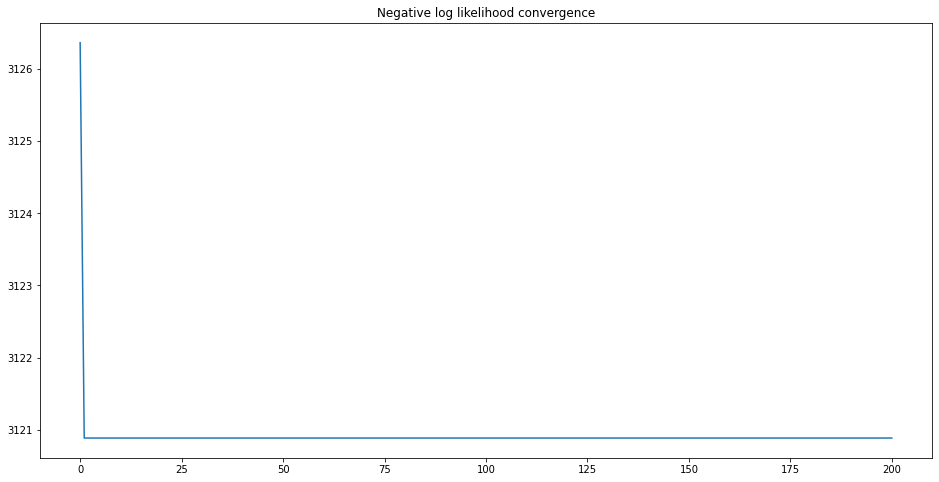

In [105]:
# HMM, PCA, reduced
hmm = HMM(nr_states, emission_dim_reduced)
nlls = hmm.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

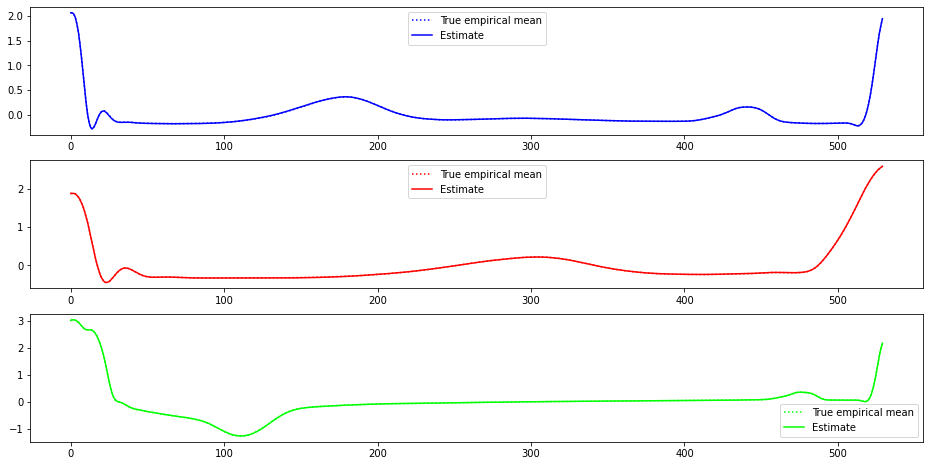

In [106]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(hmm.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

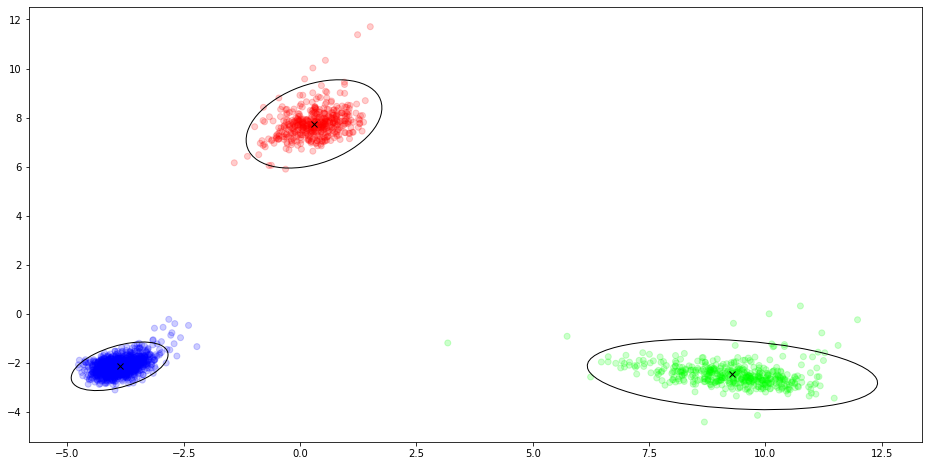

In [107]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')

/tmp/ipykernel_12013/3494935137.py:10: RuntimeWarning: divide by zero encountered in log
  np.log(c, out=c)


Accuracy: 1.0
Negative log likelihood: -3028.476818332235


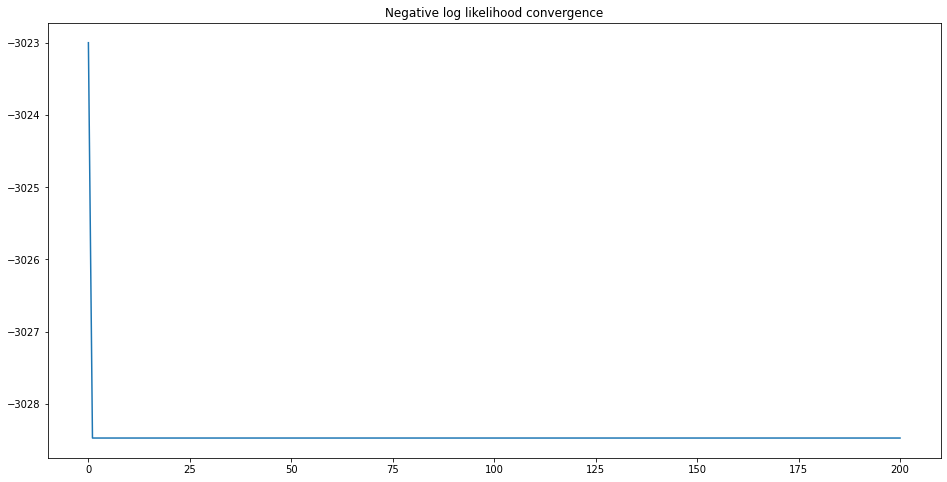

In [108]:
# HMM, whitened data
hmm = HMM(nr_states, emission_dim_reduced)
nlls = hmm.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

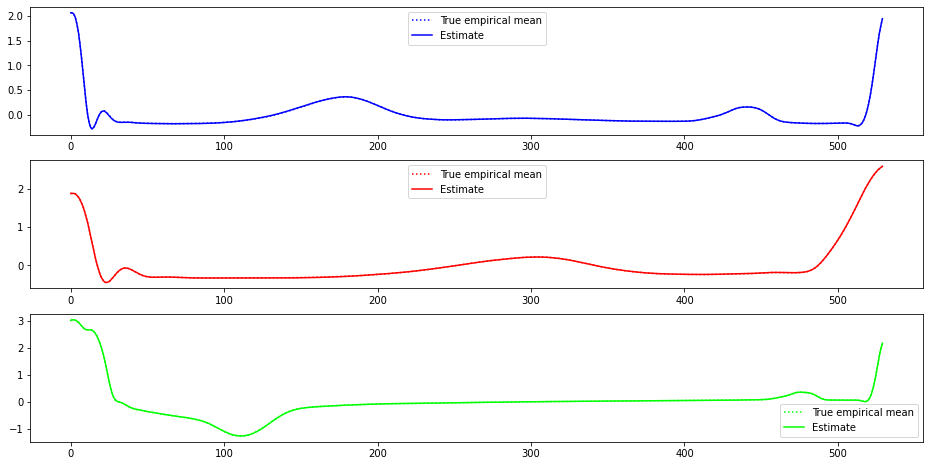

In [109]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_white(hmm.mu[mapping.index(s)]), label='Estimate', color=cmap(s))
    axs[s].legend()

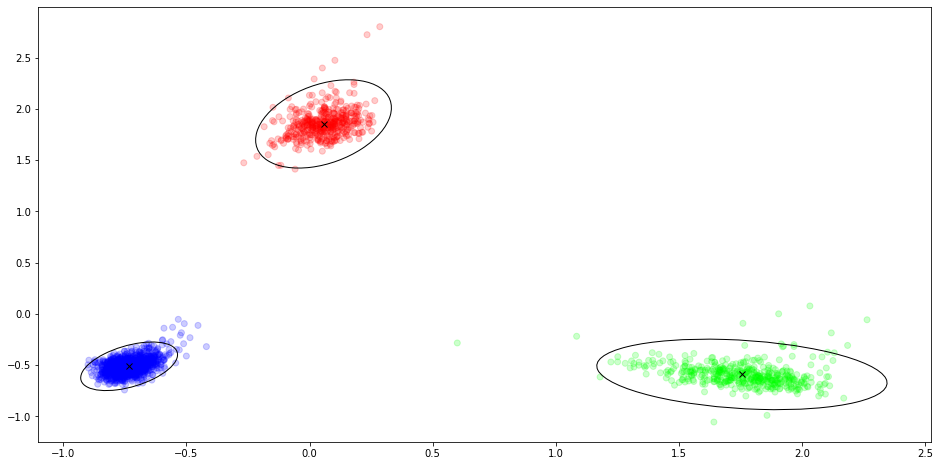

In [110]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(3):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')

## Simulation without high dim noise

### Data

In [139]:
initial = np.array([1.0, 0.0])
transitions = np.array(
    [[0.6, 0.4], 
     [0.8, 0.2]]
)
data_dim = 100
x = np.linspace(0, 1, data_dim)
mu = [0.01 * np.array([-1, 10]), 0.01 * np.array([1, -10])]
cov = np.array([[26, 2.5],[2.5,0.25]])

t_max = 2000
true_states = [np.random.choice([0,1], p=initial)]
for t in range(1, t_max):
    true_states.append(np.random.choice([0,1], p=transitions[true_states[-1]]))
true_states = np.array(true_states)

data = np.zeros((t_max, 2))
for s in range(2):
    data[true_states == s] = scipy.stats.multivariate_normal(mu[s], cov).rvs(sum(true_states == s))

In [140]:
# Model parameters
nr_states, emission_dim, emission_dim_reduced = 2, data.shape[1], 2

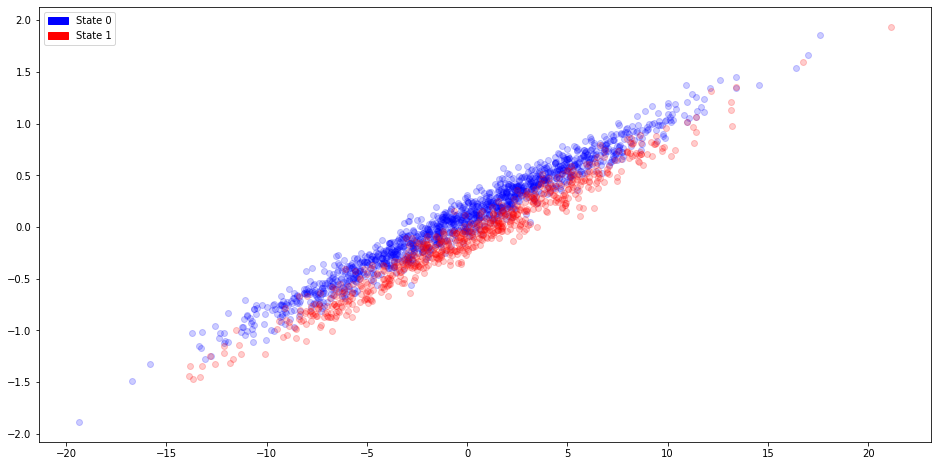

In [141]:
component1, component2 = 0, 1
for s in range(nr_states):
    plt.scatter(data[true_states == s, component1], data[true_states == s, component2], alpha=0.2,
                color=cmap(s))
plt.legend([Patch(color=cmap(c)) for c in (0, 1)], ['State {}'.format(s) for s in range(2)])
pass

In [142]:
# make it functional
data = np.linspace(data[:,0],data[:,1], data_dim).transpose()
mu = [
    np.linspace(mu[0][0], mu[s][1], data_dim) for s in range(2)
]

#cov_noise = 0.1 * np.array([[np.exp(-0.1 * abs(x[i] - x[j])) for j in range(data_dim)] for i in range(data_dim)])
#data = data + scipy.stats.multivariate_normal(np.zeros(data_dim), cov_noise).rvs(data.shape[0])
#data = data + scipy.stats.multivariate_normal(np.zeros(data_dim), 0.001).rvs(data.shape[0])

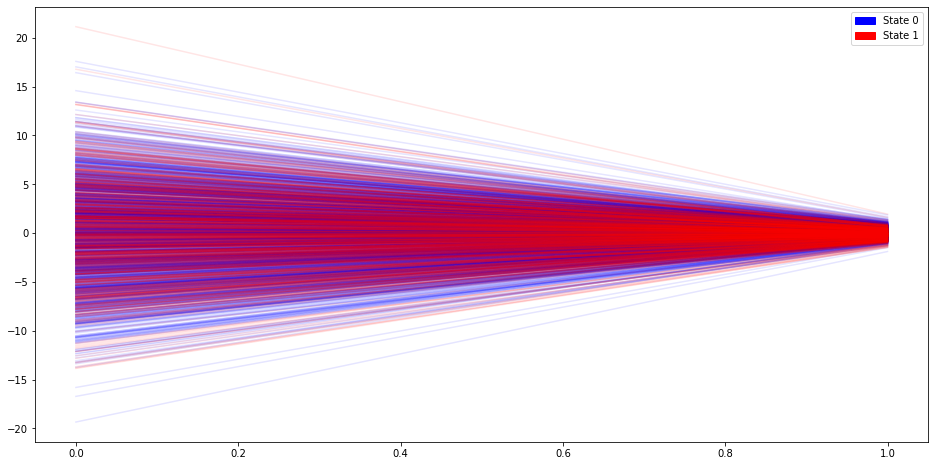

In [143]:
fig, ax = plt.subplots()
for s in range(2):
    ax.plot(x, data[true_states == s].transpose(), color=cmap(s), alpha=0.1)
ax.legend([Patch(color=cmap(c)) for c in (0, 1)], ['State {}'.format(s) for s in range(2)])
pass

In [144]:
# PCA
pca = sklearn.decomposition.PCA()
data_pca = pca.fit_transform(data)
data_pca_reduced = data_pca[:, :emission_dim_reduced]

def inverse_pca(curve):
    return pca.mean_ + np.dot(curve, pca.components_[:len(curve)])

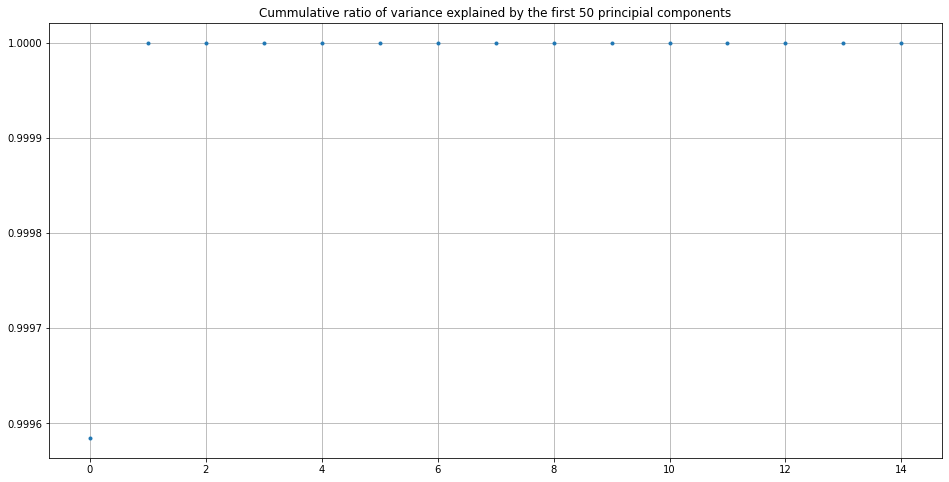

In [145]:
plt.plot(pca.explained_variance_ratio_.cumsum()[:15], '.')
plt.grid()
plt.title('Cummulative ratio of variance explained by the first 50 principial components')
pass

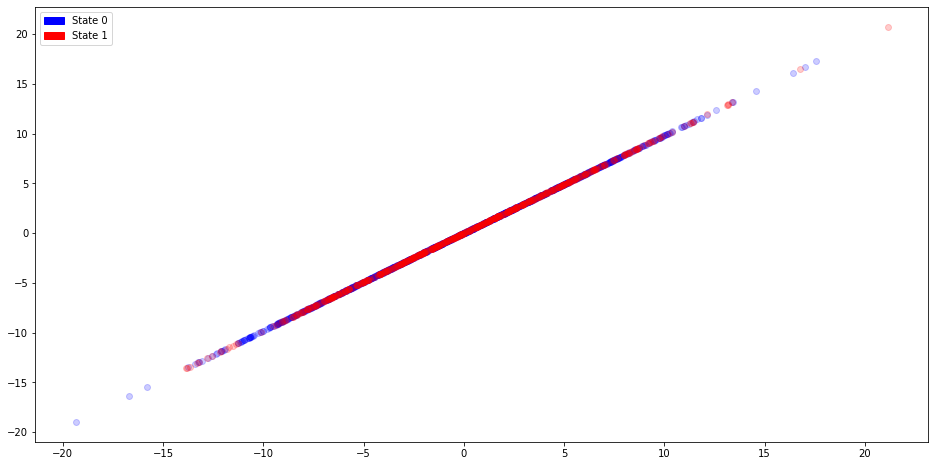

In [146]:
# without pca
# strong dependence between dimnesions, this is to be expected with all continuous data
# this is the extreme case of exact linear dependence between dimensions
component1, component2 = 0, 2
for s in range(nr_states):
    plt.scatter(data[true_states == s, component1], data[true_states == s, component2], alpha=0.2,
                color=cmap(s))
plt.legend([Patch(color=cmap(c)) for c in (0, 1)], ['State {}'.format(s) for s in range(2)])
pass

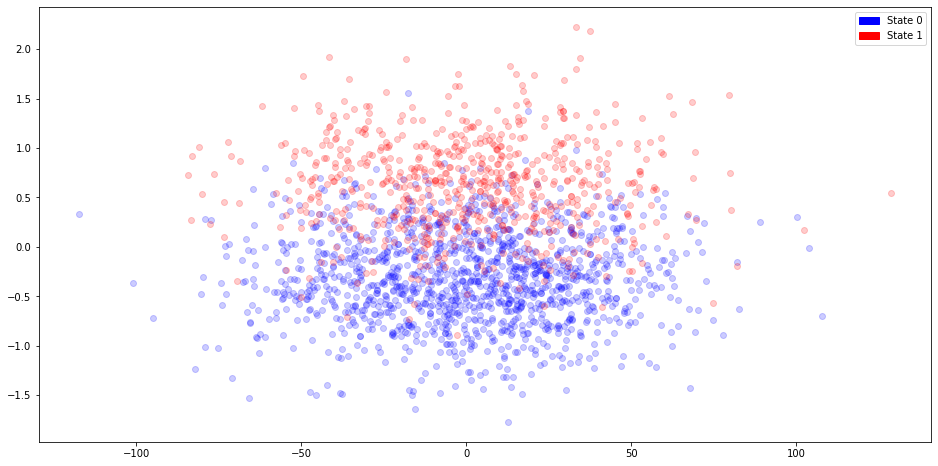

In [147]:
# with pca
fig, ax = plt.subplots()
component1, component2 = 0, 1
for s in range(nr_states):
    ax.scatter(data_pca[true_states == s, component1], data_pca[true_states == s, component2], alpha=0.2,
               color=cmap(s))
plt.legend([Patch(color=cmap(c)) for c in (0, 1)], ['State {}'.format(s) for s in range(2)])
pass

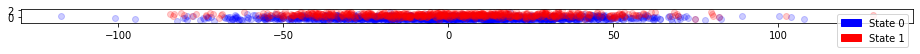

In [148]:
# plot with aspect ratio set to 1

# with pca
fig, ax = plt.subplots()
ax.set_aspect(1.)
component1, component2 = 0, 1
for s in range(nr_states):
    ax.scatter(data_pca[true_states == s, component1], data_pca[true_states == s, component2], alpha=0.2,
               color=cmap(s))
plt.legend([Patch(color=cmap(c)) for c in (0, 1)], ['State {}'.format(s) for s in range(2)])
pass

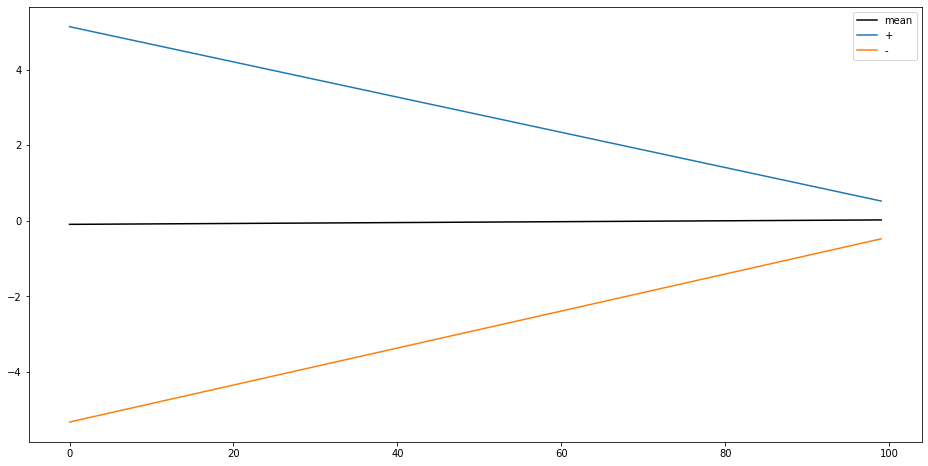

In [149]:
# The first principal component is a combination of slope and position

# Results of adding or subtracting the principal component scaled by the standard deviation of it's scores
#  from the mean curve
component = 0
plt.plot(pca.mean_, label='mean', color='black')
plt.plot(pca.mean_ + data_pca[:,component].std() * pca.components_[component], label='+')
plt.plot(pca.mean_ - data_pca[:,component].std() * pca.components_[component], label='-')
plt.legend()
pass

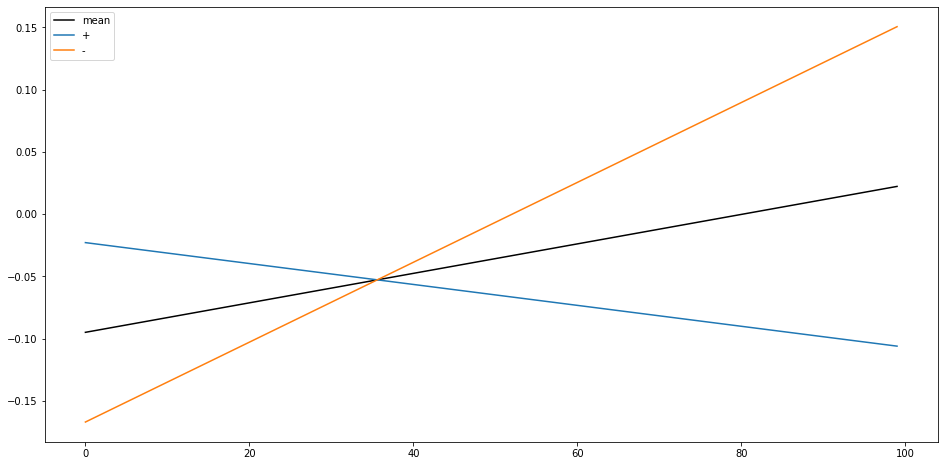

In [150]:
# The second component, the one that identifies the classes, is slope independent of position

# Results of adding or subtracting the principal component scaled by the standard deviation of it's scores
#  from the mean curve
component = 1
plt.plot(pca.mean_, label='mean', color='black')
plt.plot(pca.mean_ + data_pca[:,component].std() * pca.components_[component], label='+')
plt.plot(pca.mean_ - data_pca[:,component].std() * pca.components_[component], label='-')
plt.legend()
pass

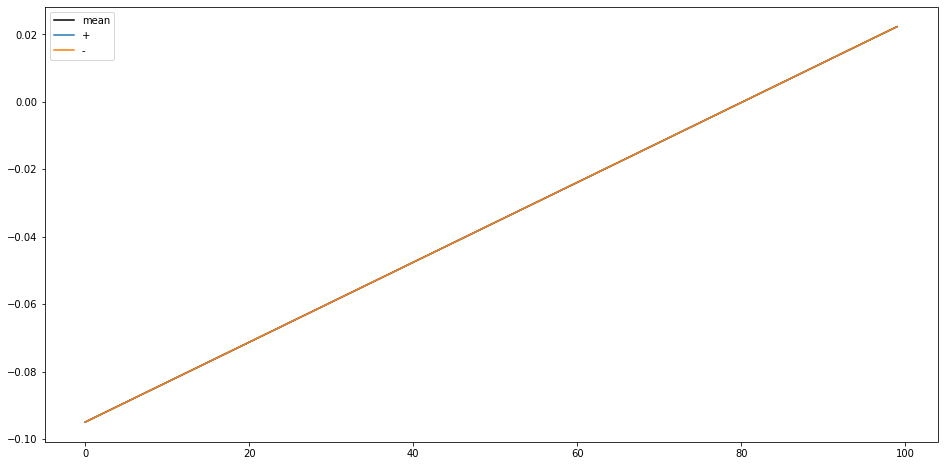

In [151]:
# The rest would be noise, but since the dimensions 2 to n-1 are a noiseless linear combination of dimensions
# 1 und n, the rest is practically zero

# Results of adding or subtracting the principal component scaled by the standard deviation of it's scores
#  from the mean curve
component = 2
plt.plot(pca.mean_, label='mean', color='black')
plt.plot(pca.mean_ + data_pca[:,component].std() * pca.components_[component], label='+')
plt.plot(pca.mean_ - data_pca[:,component].std() * pca.components_[component], label='-')
plt.legend()
pass

In [152]:
# whitening
data_white = (data_pca_reduced / np.sqrt(data_pca_reduced.var(axis=0)))

def inverse_white(curve):
    return inverse_pca(curve * np.sqrt(data_pca_reduced.var(axis=0)))

### k-means

In [153]:
# k-means, no PCA
kmeans = KMeans(nr_states, emission_dim)
kmeans.fit(data)
states = kmeans.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 0.514


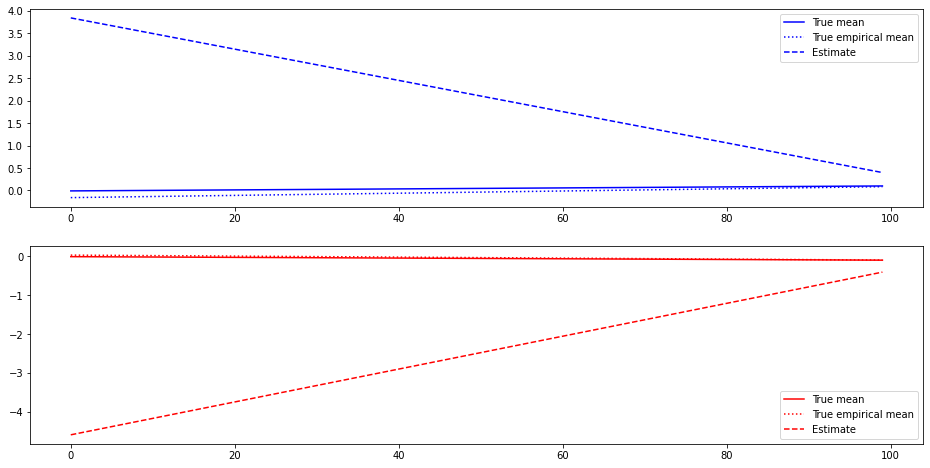

In [154]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(kmeans.mu[mapping.index(s), :data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

In [155]:
# k-means, PCA
kmeans = KMeans(nr_states, emission_dim)
kmeans.fit(data_pca)
states = kmeans.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 0.514


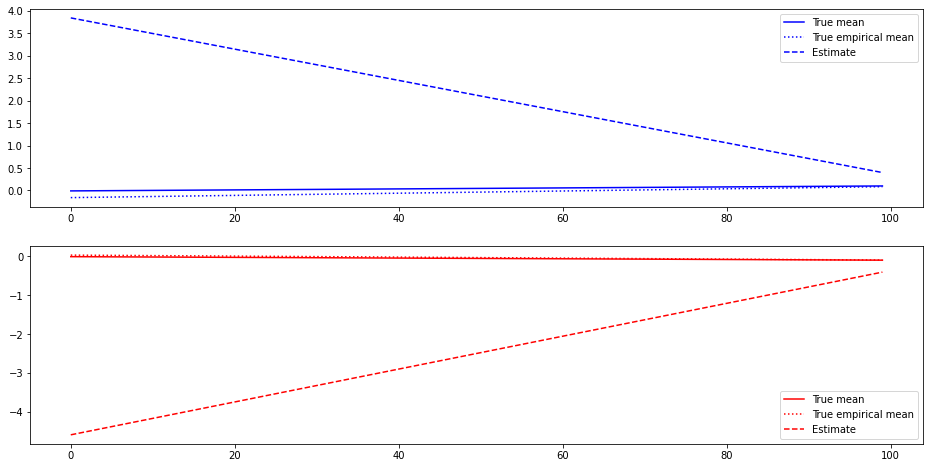

In [156]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(kmeans.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

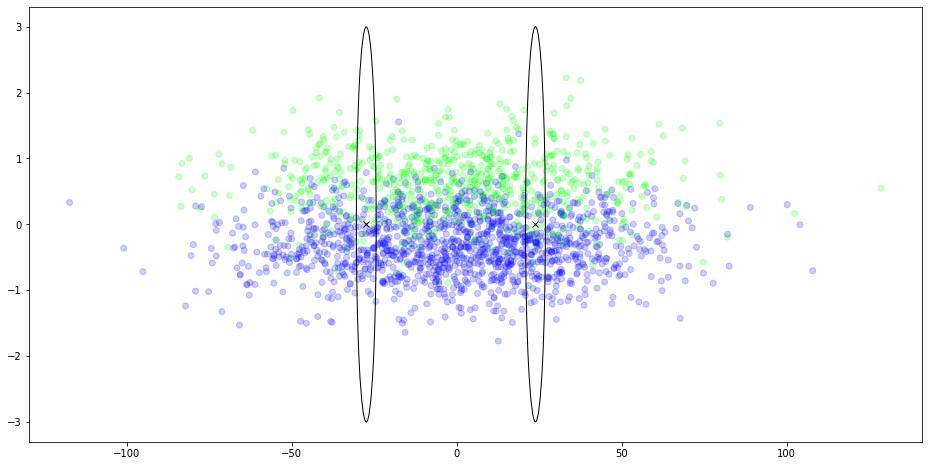

In [157]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(kmeans.mu[s], np.eye(2), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

In [158]:
# k-means, PCA, reduced
kmeans = KMeans(nr_states, emission_dim_reduced)
kmeans.fit(data_pca_reduced)
states = kmeans.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 0.514


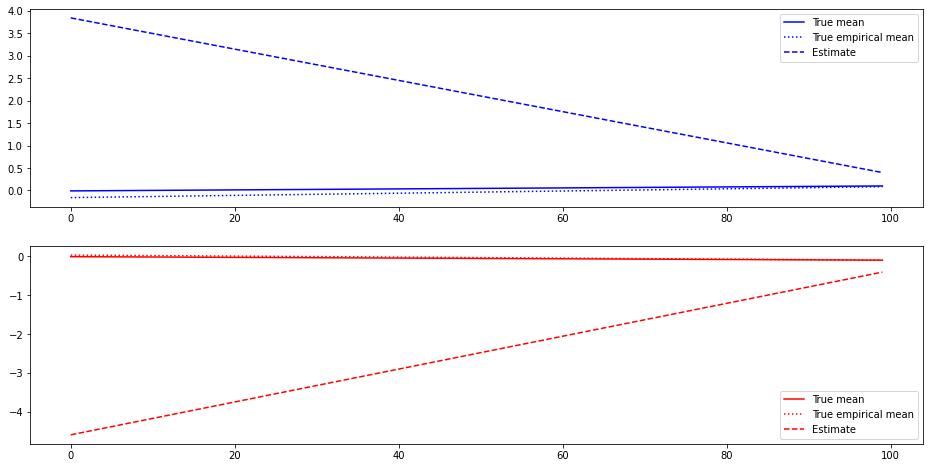

In [159]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(kmeans.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

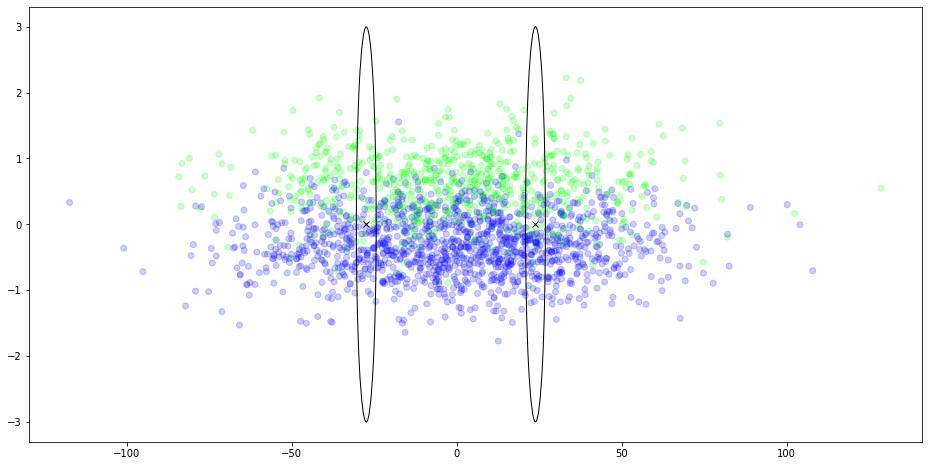

In [160]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(kmeans.mu[s], np.eye(2), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

In [161]:
# k-means, whitened data
kmeans = KMeans(nr_states, emission_dim)
kmeans.fit(data_white)
states = kmeans.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)

Accuracy: 0.8295


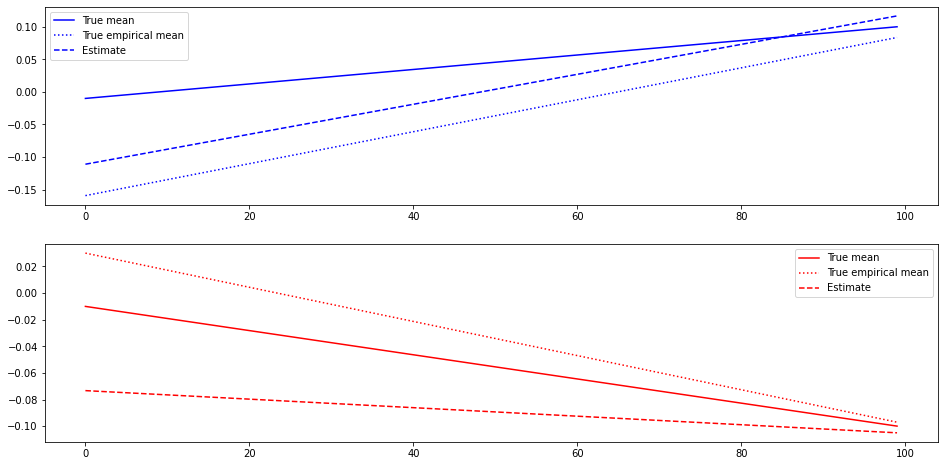

In [162]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_white(kmeans.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

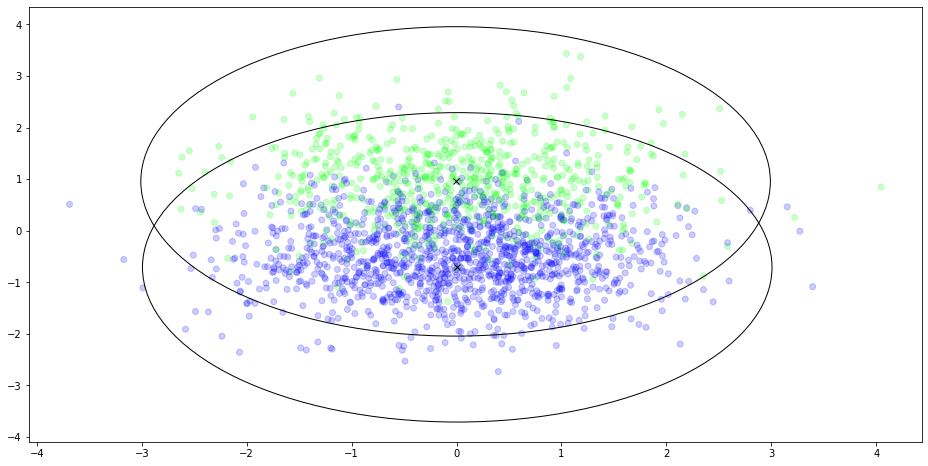

In [163]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(kmeans.mu[s], np.eye(emission_dim), dims, ax, n_std=3, edgecolor='black')
    ax.plot(kmeans.mu[s][dim0], kmeans.mu[s][dim1], 'x', c='black')

### Gaussian mixture

Accuracy: 0.824
Negative log likelihood: 11690.611489393374


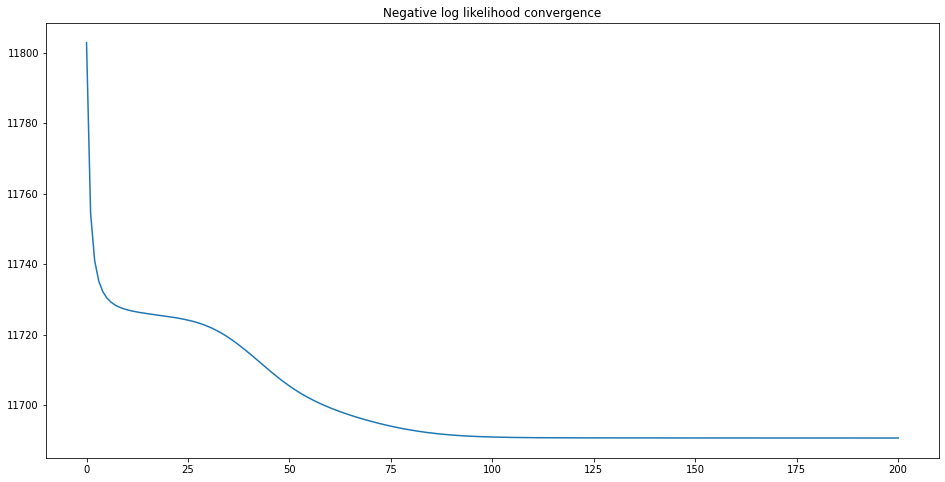

In [164]:
# Gaussian mixture, no PCA
gaussian_mixture = GaussianMixture(nr_states, emission_dim)
nlls = gaussian_mixture.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

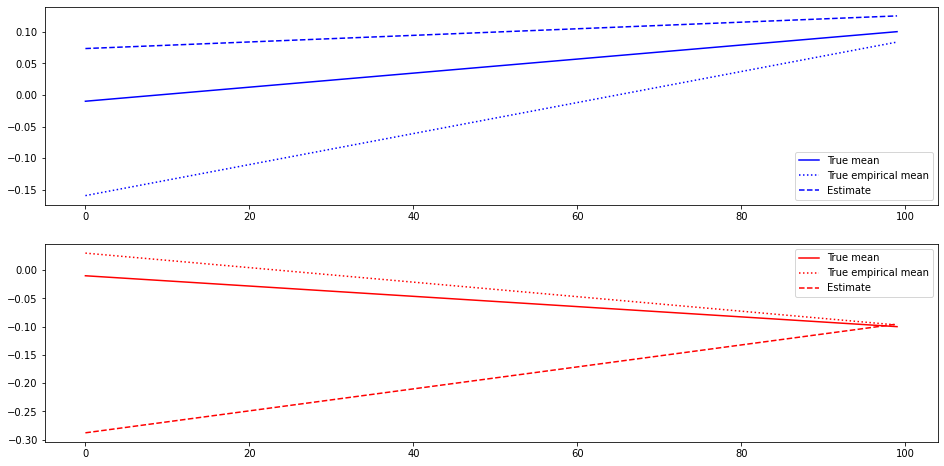

In [165]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(gaussian_mixture.mu[mapping.index(s)], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

Accuracy: 0.824
Negative log likelihood: 11690.611489393355


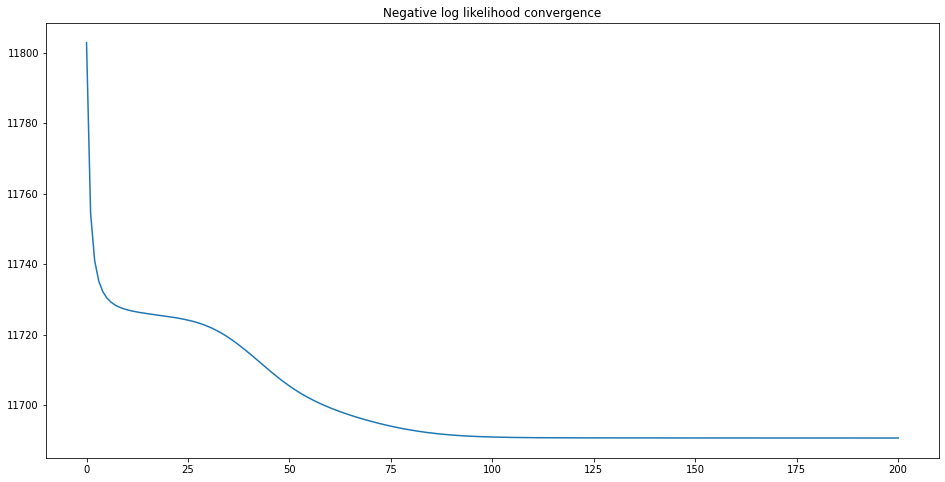

In [166]:
# Gaussian mixture, PCA
gaussian_mixture = GaussianMixture(nr_states, emission_dim)
nlls = gaussian_mixture.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

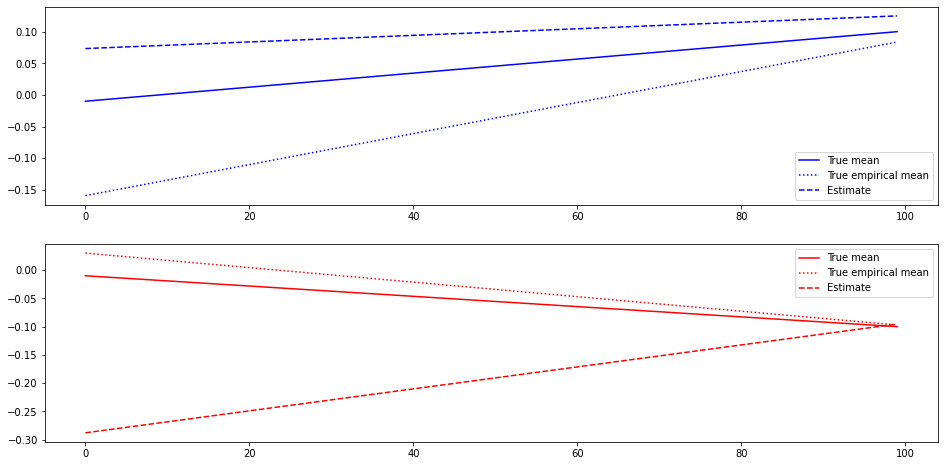

In [167]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(gaussian_mixture.mu[mapping.index(s)]), '--', label='Estimate', color=cmap(s))
    axs[s].legend()

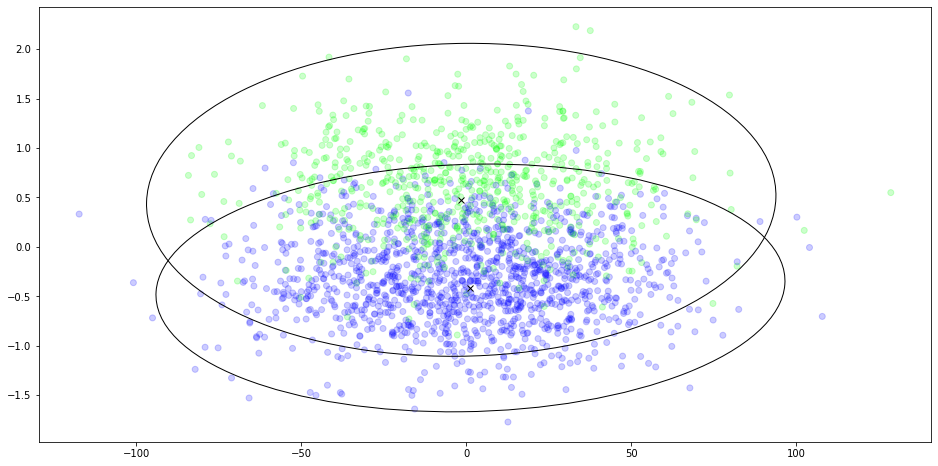

In [168]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

Accuracy: 0.824
Negative log likelihood: 11690.611489393377


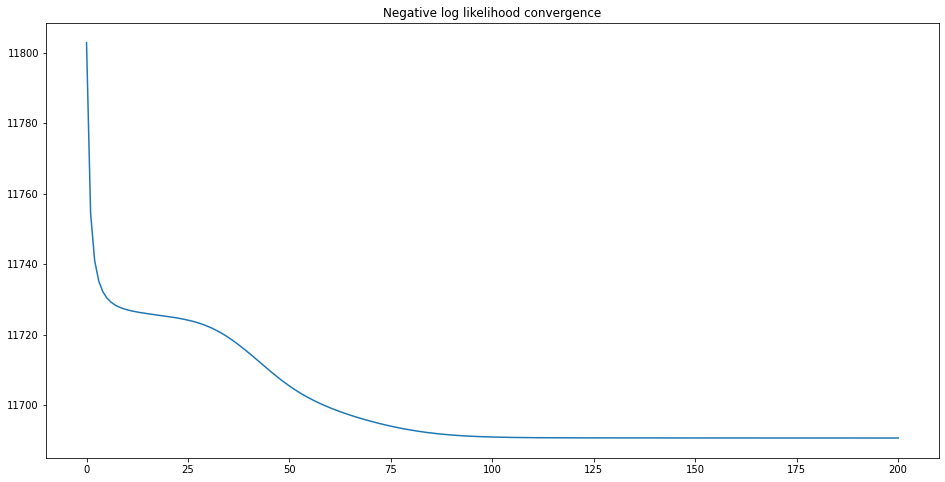

In [169]:
# Gaussian mixture, PCA, reduced
gaussian_mixture = GaussianMixture(nr_states, emission_dim_reduced)
nlls = gaussian_mixture.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

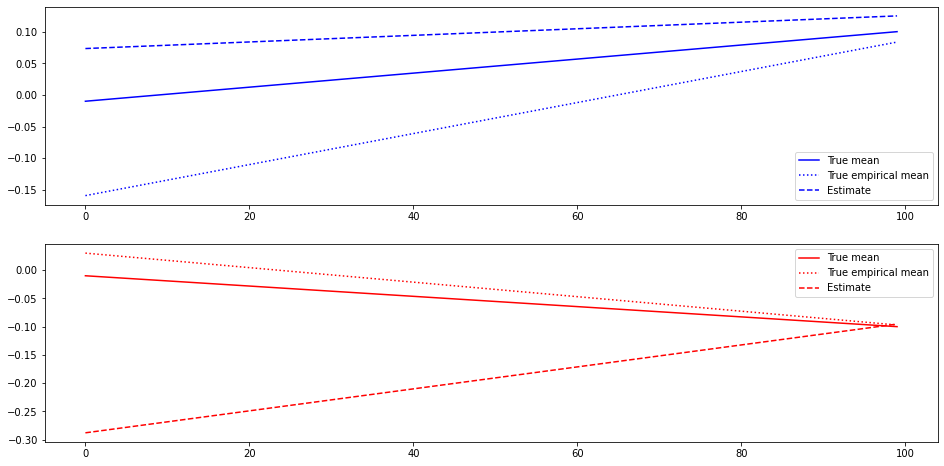

In [170]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(gaussian_mixture.mu[mapping.index(s)]), '--', label='Estimate', color=cmap(s))
    axs[s].legend()

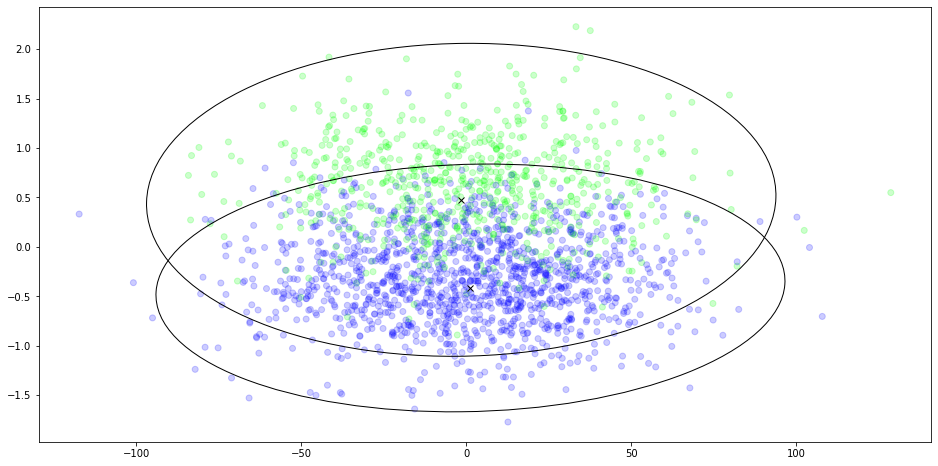

In [171]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

Accuracy: 0.8375
Negative log likelihood: 5638.707438351728


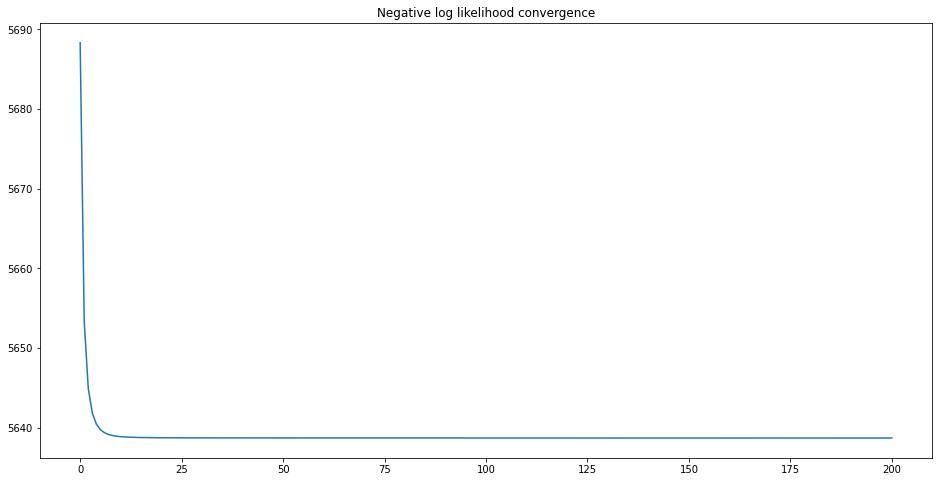

In [172]:
# Gaussian mixture, whitened data
gaussian_mixture = GaussianMixture(nr_states, emission_dim_reduced)
nlls = gaussian_mixture.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = gaussian_mixture.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

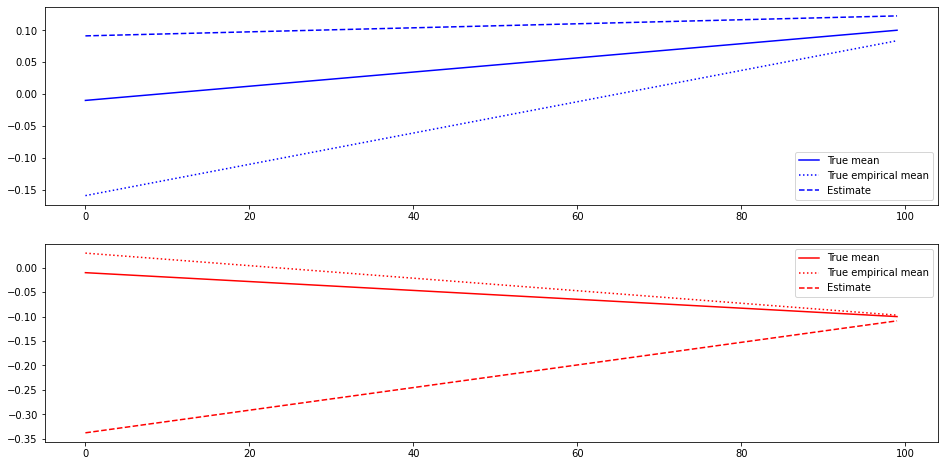

In [173]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_white(gaussian_mixture.mu[mapping.index(s)]), '--', label='Estimate', color=cmap(s))
    axs[s].legend()

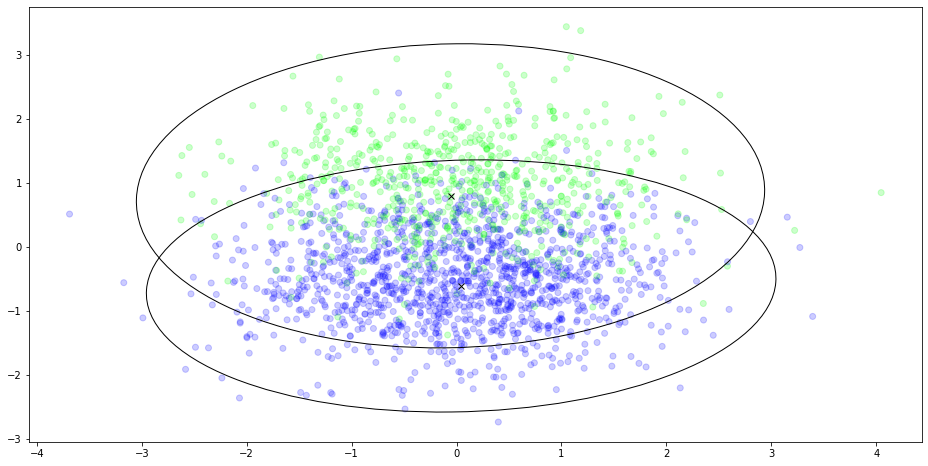

In [174]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(gaussian_mixture.mu[s], gaussian_mixture.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(gaussian_mixture.mu[s][dim0], gaussian_mixture.mu[s][dim1], 'x', c='black')

### HMM with covariance set to 1

Accuracy: 0.514
Negative log likelihood: 542322.664396696


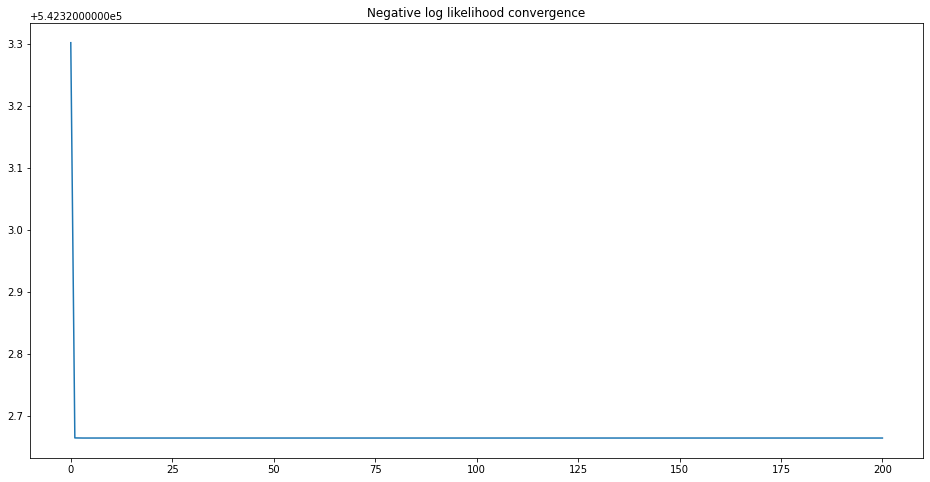

In [175]:
# HMM with covariance set to 1, no PCA
hmm_cov_1 = HMMCov1(nr_states, emission_dim)
nlls = hmm_cov_1.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

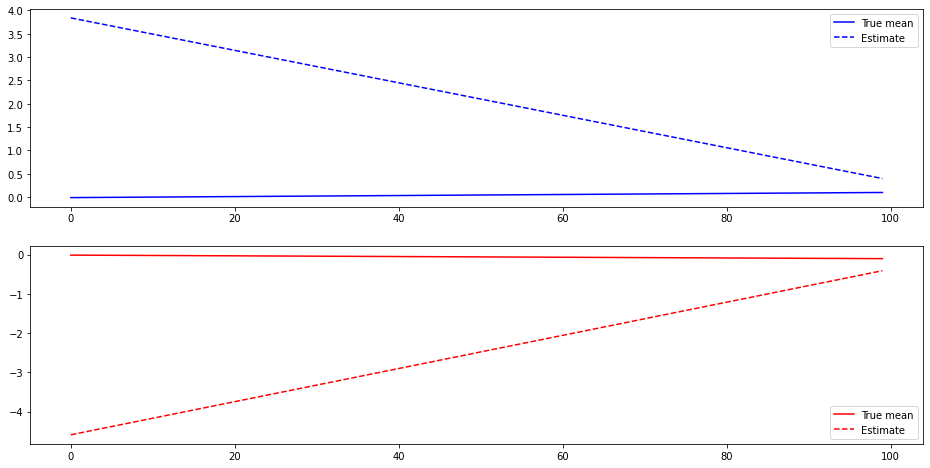

In [176]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(hmm_cov_1.mu[mapping.index(s), :data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

Accuracy: 0.514
Negative log likelihood: 542322.6643966915


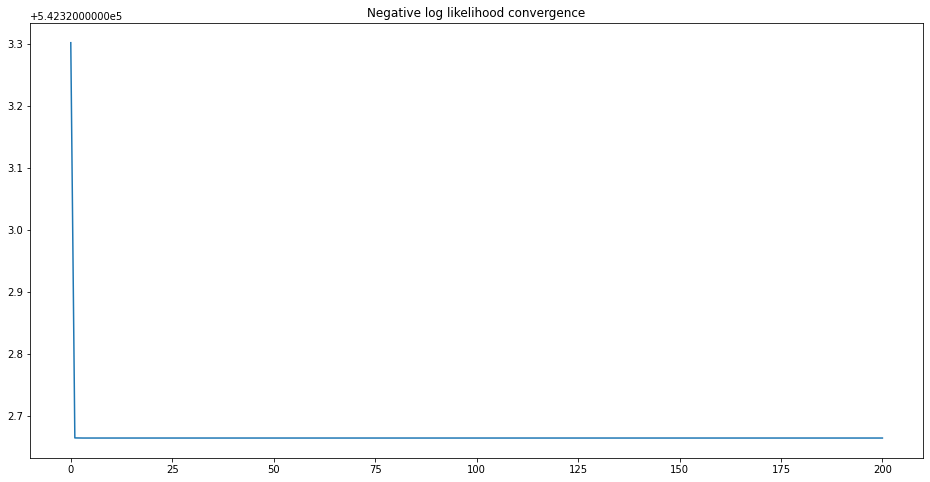

In [177]:
# HMM with covariance set to 1, PCA
hmm_cov_1 = HMMCov1(nr_states, emission_dim)
nlls = hmm_cov_1.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

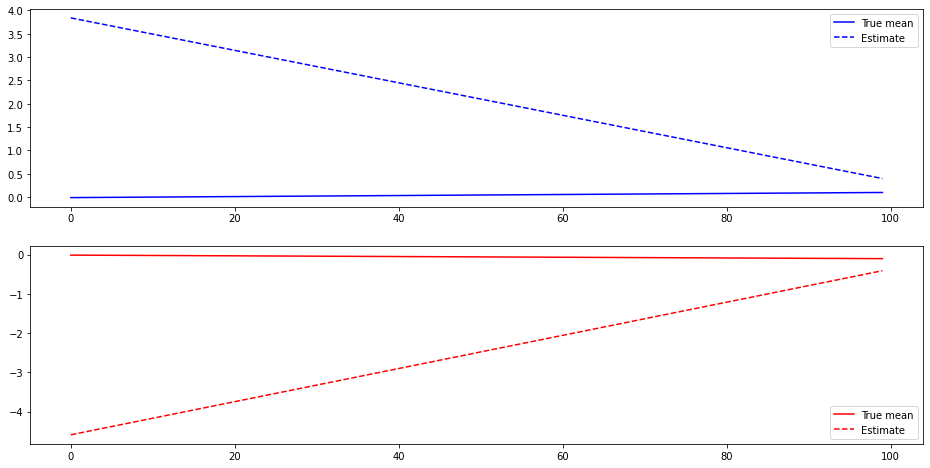

In [178]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(inverse_pca(hmm_cov_1.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

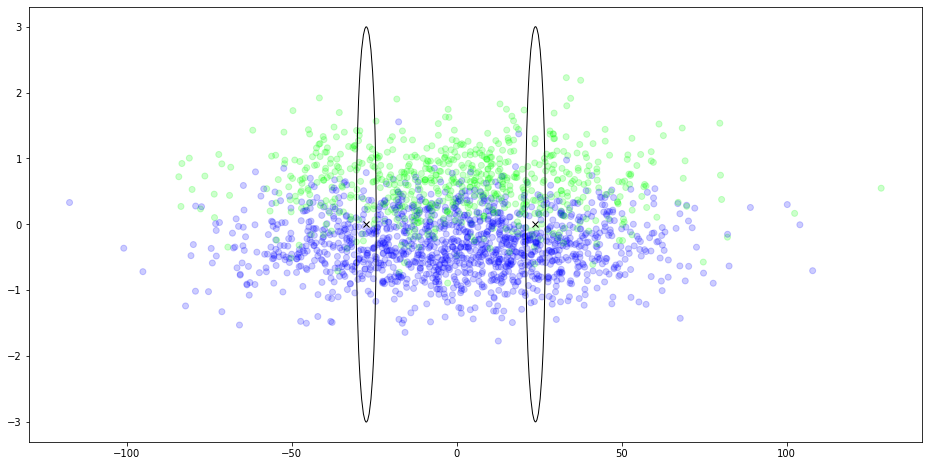

In [179]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

Accuracy: 0.514
Negative log likelihood: 362210.7118885784


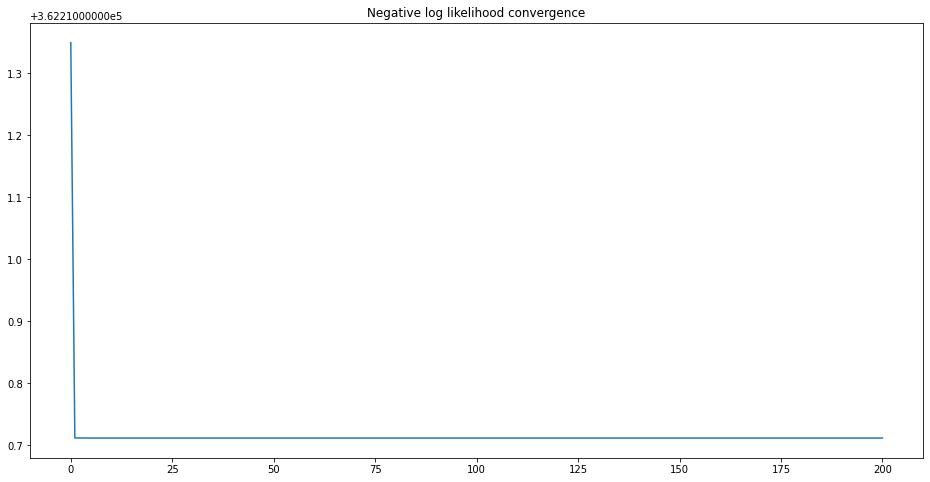

In [180]:
# HMM with covariance set to 1, PCA, reduced
hmm_cov_1 = HMMCov1(nr_states, emission_dim_reduced)
nlls = hmm_cov_1.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

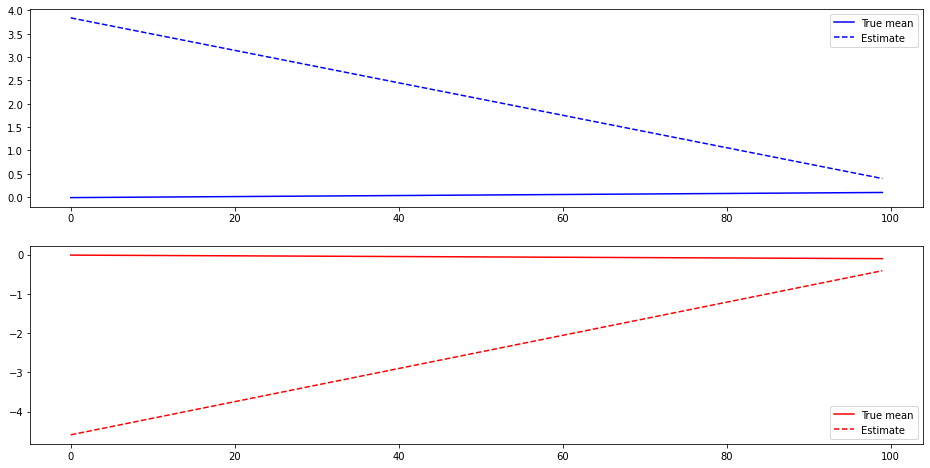

In [181]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(inverse_pca(hmm_cov_1.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

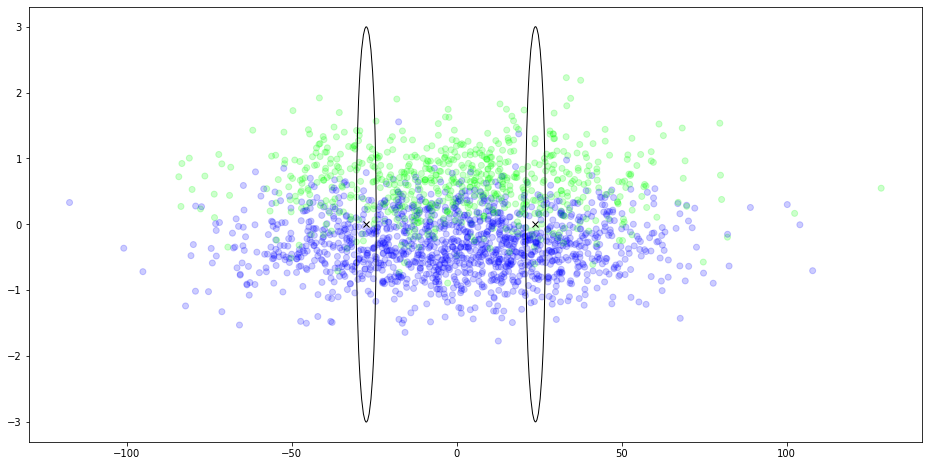

In [182]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

Accuracy: 0.539
Negative log likelihood: 5664.880760838412


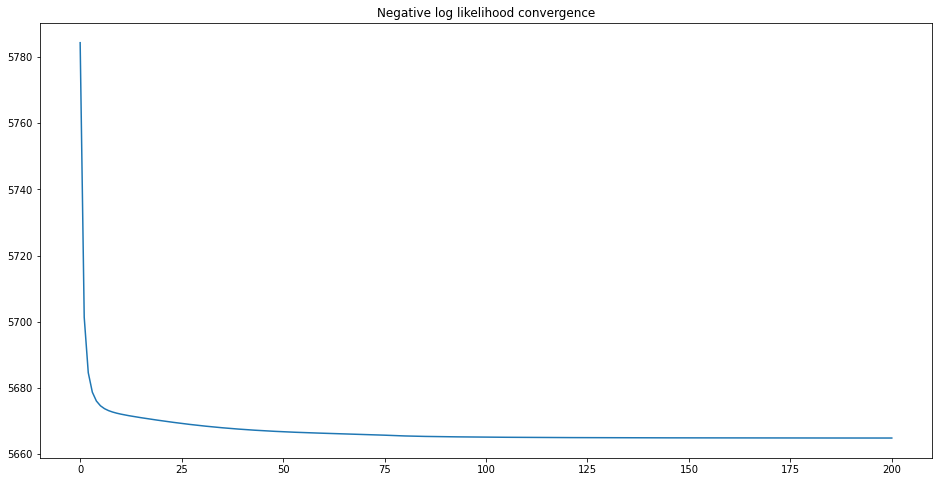

In [183]:
# HMM with covariance set to 1, whitened data
hmm_cov_1 = HMMCov1(nr_states, emission_dim_reduced)
nlls = hmm_cov_1.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm_cov_1.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

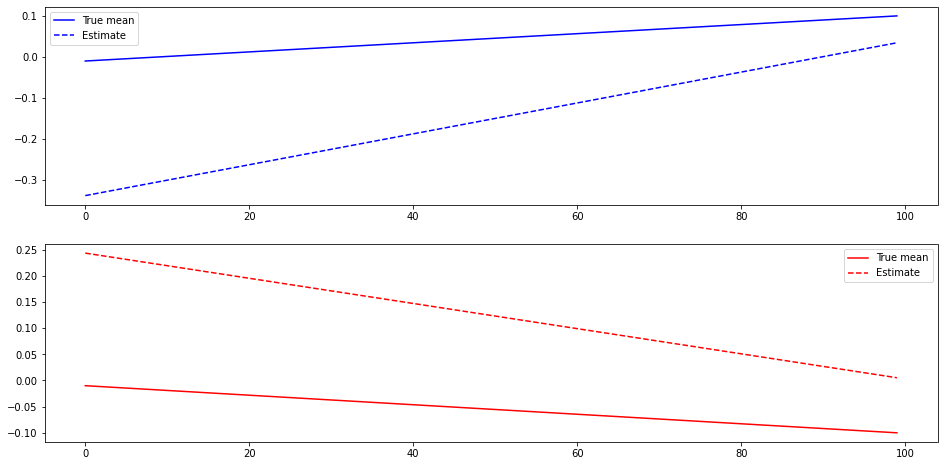

In [184]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(inverse_white(hmm_cov_1.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

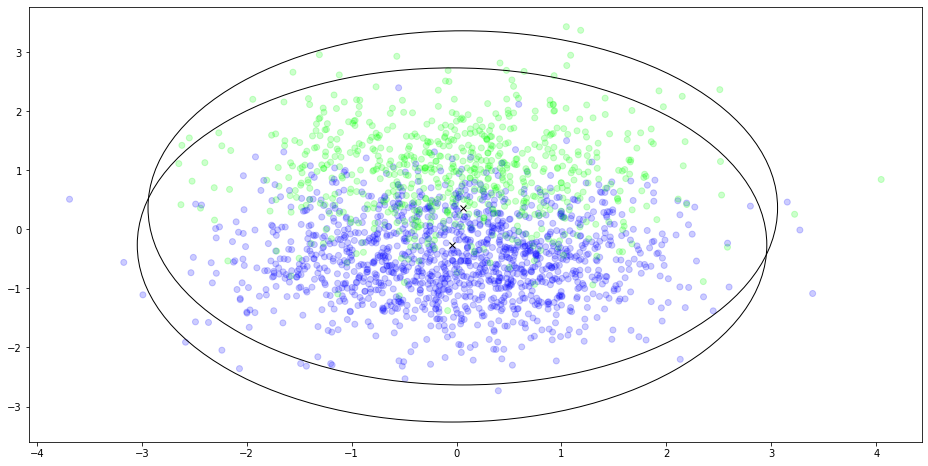

In [185]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(hmm_cov_1.mu[s], np.eye(emission_dim_reduced), dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm_cov_1.mu[s][dim0], hmm_cov_1.mu[s][dim1], 'x', c='black')

### HMM

Accuracy: 0.8405
Negative log likelihood: 11670.54032960011


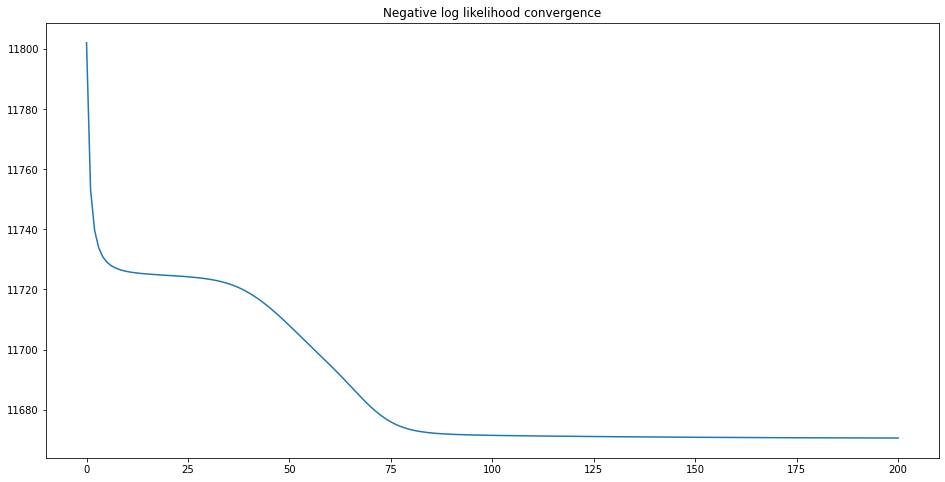

In [186]:
# HMM, no PCA
hmm = HMM(nr_states, emission_dim)
nlls = hmm.fit(data)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

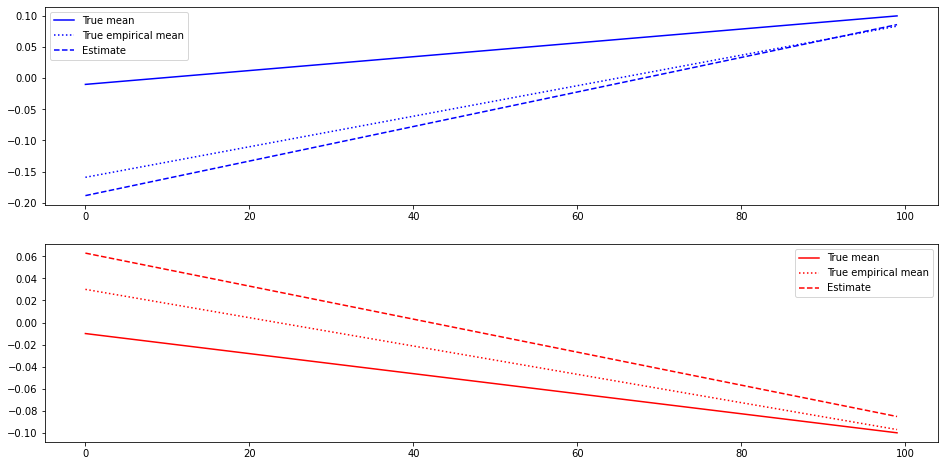

In [187]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(hmm.mu[mapping.index(s), :data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

Accuracy: 0.8405
Negative log likelihood: 11670.540329600168


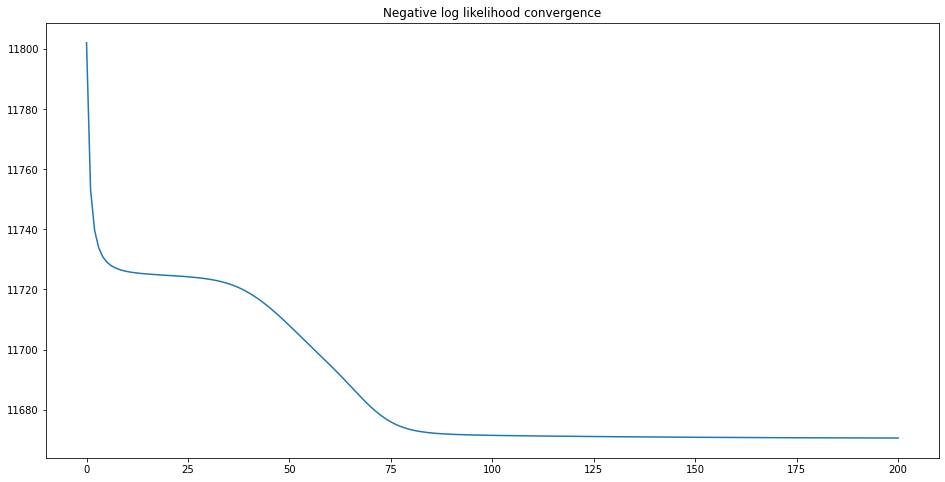

In [188]:
# HMM, PCA
hmm = HMM(nr_states, emission_dim)
nlls = hmm.fit(data_pca)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_pca)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

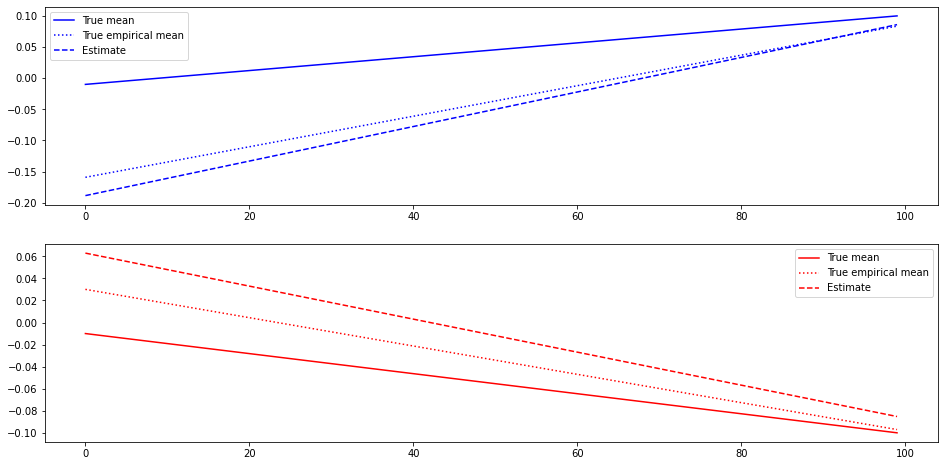

In [189]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(hmm.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

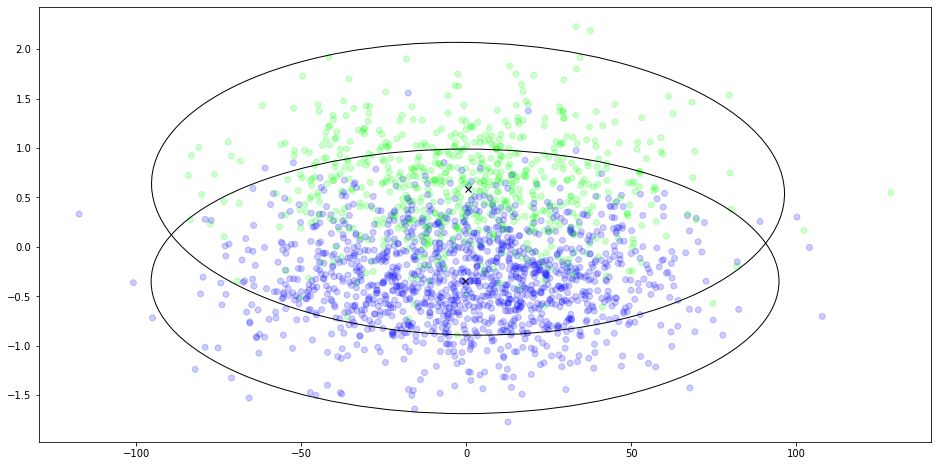

In [190]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca[:, dim0], data_pca[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')

Accuracy: 0.8405
Negative log likelihood: 11670.540329600086


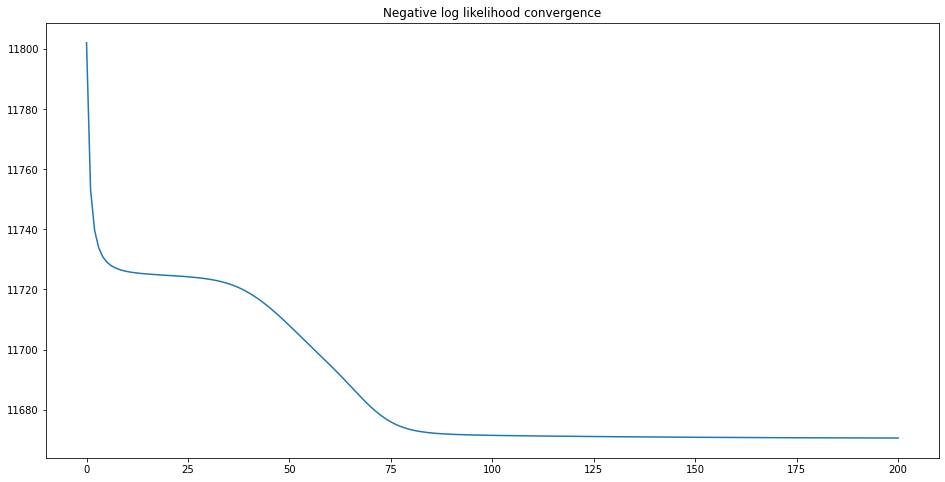

In [191]:
# HMM, PCA, reduced
hmm = HMM(nr_states, emission_dim_reduced)
nlls = hmm.fit(data_pca_reduced)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_pca_reduced)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

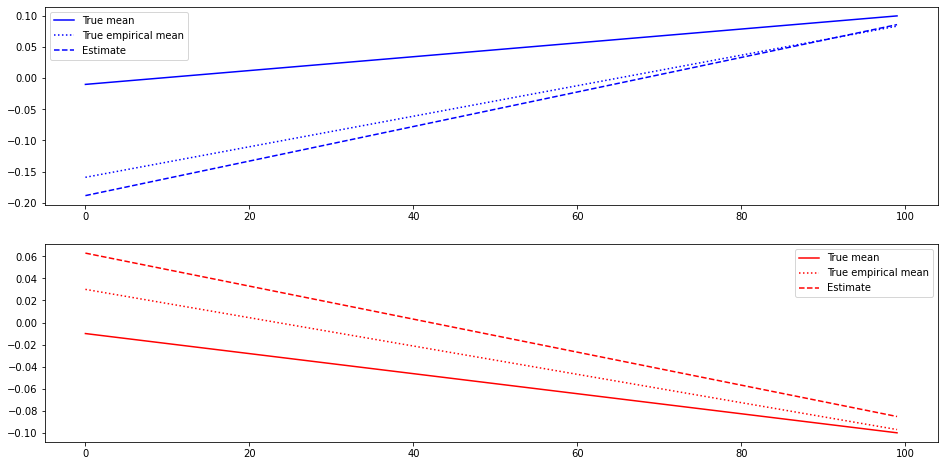

In [192]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_pca(hmm.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

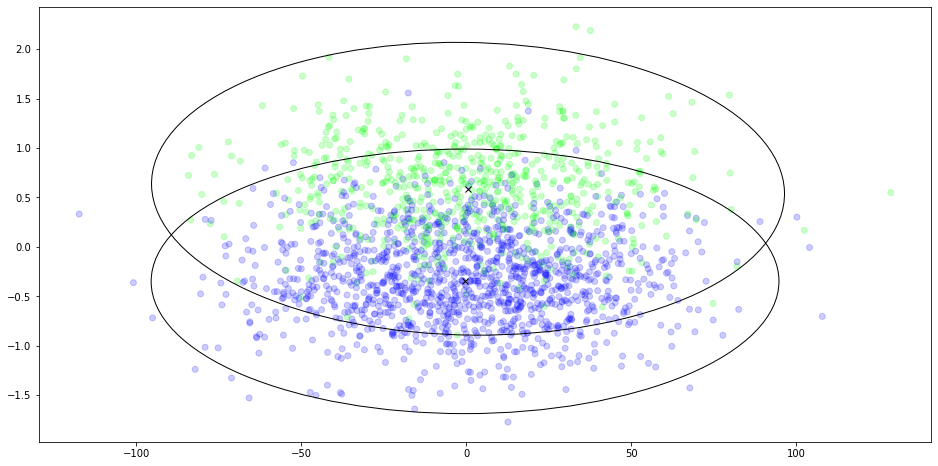

In [193]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_pca_reduced[:, dim0], data_pca_reduced[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')

Accuracy: 0.846
Negative log likelihood: 5618.567905969652


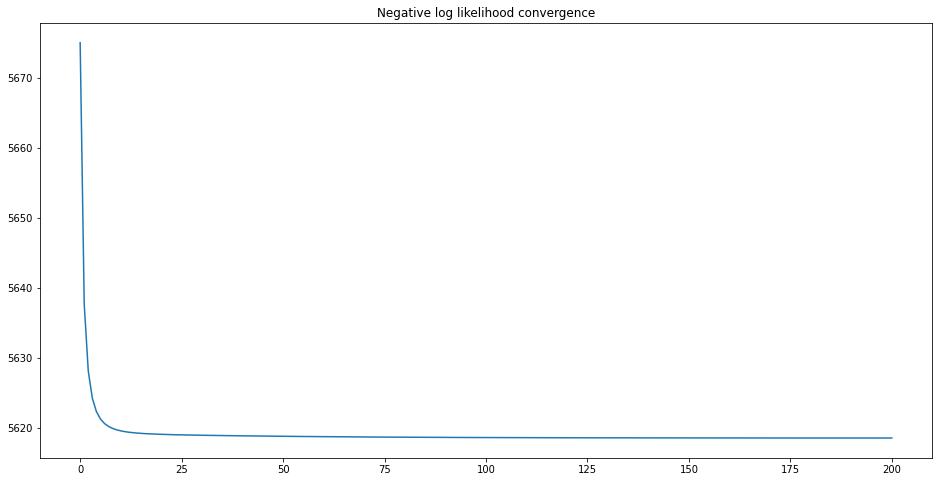

In [194]:
# HMM, whitened data
hmm = HMM(nr_states, emission_dim_reduced)
nlls = hmm.fit(data_white)
plt.plot(nlls)
plt.title('Negative log likelihood convergence')
states = hmm.predict(data_white)
mapping, states, accuracy = normalize_states(states, true_states)
print('Accuracy:', accuracy)
print('Negative log likelihood:', nlls[-1])

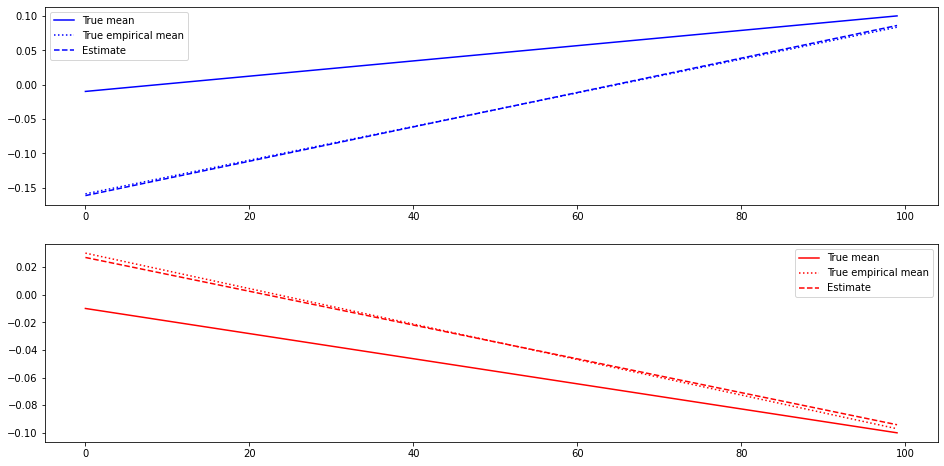

In [195]:
fig, axs = plt.subplots(nr_states)
for s in range(nr_states):
    axs[s].plot(mu[s], label='True mean', color=cmap(s))
    axs[s].plot(data[true_states == s].mean(axis=0), ':', label='True empirical mean', color=cmap(s))
    axs[s].plot(inverse_white(hmm.mu[mapping.index(s)])[:data_dim], '--', label='Estimate', color=cmap(s))
    axs[s].legend()

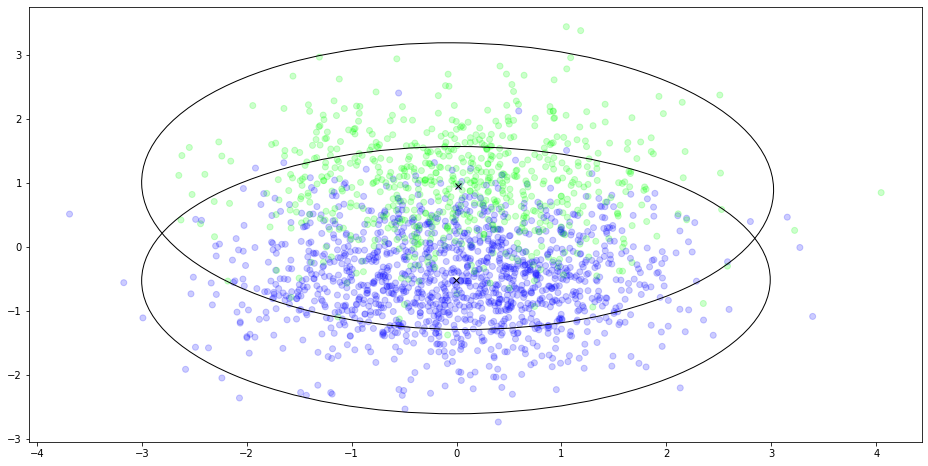

In [196]:
dims = 0, 1
dim0, dim1 = dims
fig, ax = plt.subplots()

plt.scatter(data_white[:, dim0], data_white[:, dim1], alpha=0.2, c=true_states, cmap=cmap)
for s in range(2):
    confidence_ellipse(hmm.mu[s], hmm.cov[s], dims, ax, n_std=3, edgecolor='black')
    ax.plot(hmm.mu[s][dim0], hmm.mu[s][dim1], 'x', c='black')